# Loading Data

## Env

In [1]:
from pathlib import Path
import sys
import logging

project_root = str(Path("/home/user/perso/trading/alphalab").resolve())

if project_root not in sys.path:
    sys.path.append(project_root)

# Configuration de l'autocomplétion Jupyter
%config IPCompleter.use_jedi = False
%config IPCompleter.greedy = False

# Activation de l'autoreload
%load_ext autoreload
%autoreload 2

logging.basicConfig(
    level=logging.INFO,
    format='[%(levelname)s] %(message)s',
    stream=sys.stdout,
    force=False,
)

logging.getLogger('enl').setLevel(logging.INFO)

## Fixing panda results

In [2]:
import pandas as pd

# Supprime la limite d'affichage des colonnes pour cette session
pd.set_option('display.max_columns', None)

# (Optionnel) Supprime aussi la limite d'affichage des lignes si besoin
pd.set_option('display.max_rows', 10)


## Reloading results

In [14]:
import pandas as pd


df_master_results = pd.read_csv('meta_grid_search_report_2026.csv')
df_master_results

,curve_id,semester,time_frame,window,stop_loss_sigma,use_elastic_sizing,use_r2,use_ttest,use_anchor,use_slope_limit,...,relative_expected_value_net,cumulative_monetary_profit_gross,cumulative_monetary_profit_net,trade_time_min,trade_time_max,trade_time_mean,trade_time_median,drawdown_max,drawdown_mean,drawdown_median
0,S1|30min|W40|σ3.5|R2:0|t:0|Anc:1|Slp:1|Zdyn:0,S1,30min,40,3.5,False,False,False,True,True,...,0.000643,11129.528872,9383.447476,30.0,10020.0,1204.680851,390.0,1442.422017,226.419524,163.231979
1,S1|30min|W40|σ3.5|R2:0|t:0|Anc:0|Slp:1|Zdyn:0,S1,30min,40,3.5,False,False,False,False,True,...,0.000643,11129.528872,9383.447476,30.0,10020.0,1204.680851,390.0,1442.422017,226.419524,163.231979
2,S1|30min|W40|σ3.5|R2:0|t:0|Anc:0|Slp:1|Zdyn:1,S1,30min,40,3.5,False,False,False,False,True,...,0.000548,8883.738140,7282.672553,30.0,10020.0,1260.923077,420.0,1442.422017,238.035633,172.530429
3,S1|30min|W40|σ3.5|R2:0|t:0|Anc:1|Slp:1|Zdyn:1,S1,30min,40,3.5,False,False,False,True,True,...,0.000548,8883.738140,7282.672553,30.0,10020.0,1260.923077,420.0,1442.422017,238.035633,172.530429
4,S4|30min|W20|σ2.5|R2:1|t:0|Anc:0|Slp:0|Zdyn:1,S4,30min,20,2.5,False,True,False,False,False,...,0.000339,7949.293444,5763.834065,30.0,5580.0,428.855422,150.0,364.801906,83.446582,56.067591
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3067,S1|5min|W40|σ1.5|R2:0|t:1|Anc:1|Slp:1|Zdyn:0,S1,5min,40,1.5,False,False,True,True,True,...,-0.000205,-5681.874620,-18858.719706,5.0,4355.0,126.924213,40.0,723.835240,75.042016,55.888391
3068,S1|5min|W40|σ1.5|R2:0|t:0|Anc:1|Slp:1|Zdyn:0,S1,5min,40,1.5,False,False,False,True,True,...,-0.000184,-4715.890376,-18868.171708,5.0,4355.0,127.486749,40.0,723.835240,75.292640,54.655218
3069,S1|5min|W40|σ1.5|R2:0|t:0|Anc:0|Slp:1|Zdyn:0,S1,5min,40,1.5,False,False,False,False,True,...,-0.000184,-4730.124885,-18907.427318,5.0,4355.0,127.336861,40.0,723.835240,75.215917,54.506142
3070,S1|5min|W40|σ1.5|R2:0|t:0|Anc:1|Slp:1|Zdyn:1,S1,5min,40,1.5,False,False,False,True,True,...,-0.000204,-6366.180859,-19714.007144,5.0,4355.0,126.643324,40.0,723.835240,76.353279,56.429756


## Loading Models

In [7]:
from enl.data_feed import *

start = '2020-01-01'
end = '2021-12-31'

df_5min = load_pair_time_bars('GBPUSD', 'EURUSD', start, end, '5min', ['close'])
df_30min = load_pair_time_bars('GBPUSD', 'EURUSD', start, end, '30min', ['close'])
from enl.backtest import *

all_dfs = [df_5min, df_30min]
windows = [5, 10, 20, 40]

df_unaligned_models = []

for window in windows:
    logger.info('Building models for window=%d', window)
    for df in all_dfs:
        model = bivariate_linear_model(df, window).dropna()
        filters = build_cascade_filters(model, window).dropna()
        df_unaligned_models.append(filters)

# Find the min date of all models and strip everybody
common_start_time = max(df["timestamp"].min() for df in df_unaligned_models)
logger.info('Found common start: %s', common_start_time)

df_models = [df[df["timestamp"] >= common_start_time] for df in df_unaligned_models]

[INFO] Building models for window=5
[INFO] Building models for window=10
[INFO] Building models for window=20
[INFO] Building models for window=40
[INFO] Found common start: 2020-01-02 17:30:00


## Cleaning no trades

In [70]:
df = df_master_results
df_clean = df[df['window'] != 5]
df = df_clean
df_raw = df
# Afficher le résumé statistique de la colonne total_trades


# Analysis: total_trades

## Distribution

In [55]:
print(df['total_trades'].describe())

count    2304.000000
mean      355.437934
std       371.642005
min         5.000000
25%        46.750000
50%       170.000000
75%       727.000000
max      1331.000000
Name: total_trades, dtype: float64


## Graphic

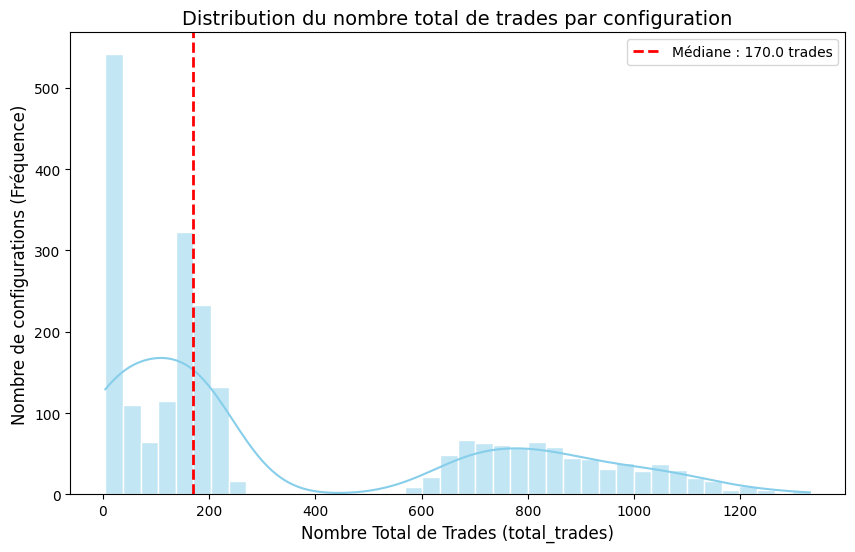

In [56]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

plt.close('all')

# Configurer la taille du graphique
plt.figure(figsize=(10, 6))

# Créer l'histogramme avec la courbe de densité estimée (KDE)
sns.histplot(
    data=df,
    x='total_trades',
    kde=True,
    color='skyblue',
    bins=40,            # Ajustez le nombre de barres si nécessaire
    edgecolor='white'
)

# Ajouter une ligne verticale pour la médiane
mediane_trades = df['total_trades'].median()
plt.axvline(
    mediane_trades,
    color='red',
    linestyle='--',
    linewidth=2,
    label=f'Médiane : {mediane_trades:.1f} trades'
)

# Personnalisation des axes et du titre
plt.title("Distribution du nombre total de trades par configuration", fontsize=14)
plt.xlabel("Nombre Total de Trades (total_trades)", fontsize=12)
plt.ylabel("Nombre de configurations (Fréquence)", fontsize=12)
plt.legend()

# Afficher le graphique
plt.show()


## Isolates groups (swing vs intraday)

### Split

In [72]:
df = df_clean

# 1. Isoler la population Swing / Intraday Restrictif
df_swing = df[df['total_trades'] <= 300].copy()

# 2. Isoler la population Intraday Actif
df_intraday = df[df['total_trades'] > 300].copy()

print(f"Configurations Swing: {df_swing.shape[0]} (avg. per week: {df_swing['total_trades'].mean()/(6*4):.2f})")
print(f"Configurations Intraday: {df_intraday.shape[0]} (avg. per week: {df_intraday['total_trades'].mean()/(6*4):.2f})")


Configurations Swing: 1536 (avg. per week: 4.37)
Configurations Intraday: 768 (avg. per week: 35.69)


### Intraday total_trades

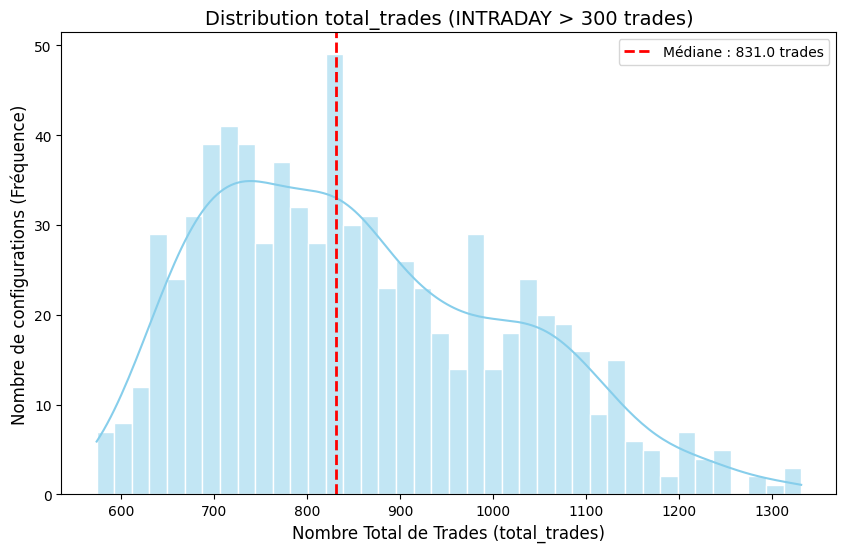

In [73]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df = df_intraday

plt.close('all')

# Configurer la taille du graphique
plt.figure(figsize=(10, 6))

# Créer l'histogramme avec la courbe de densité estimée (KDE)
sns.histplot(
    data=df,
    x='total_trades',
    kde=True,
    color='skyblue',
    bins=40,            # Ajustez le nombre de barres si nécessaire
    edgecolor='white'
)

# Ajouter une ligne verticale pour la médiane
mediane_trades = df['total_trades'].median()
plt.axvline(
    mediane_trades,
    color='red',
    linestyle='--',
    linewidth=2,
    label=f'Médiane : {mediane_trades:.1f} trades'
)

# Personnalisation des axes et du titre
plt.title("Distribution total_trades (INTRADAY > 300 trades)", fontsize=14)
plt.xlabel("Nombre Total de Trades (total_trades)", fontsize=12)
plt.ylabel("Nombre de configurations (Fréquence)", fontsize=12)
plt.legend()

# Afficher le graphique
plt.show()

### Swing total_trades

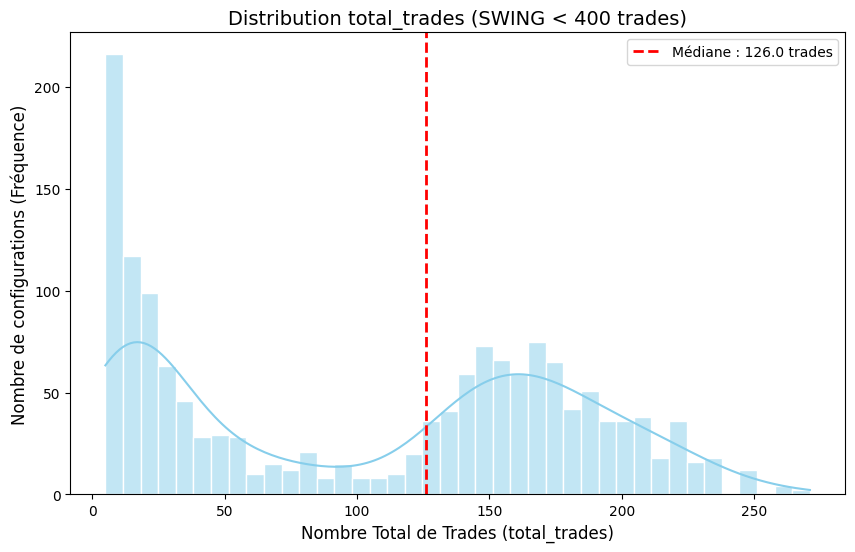

In [74]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df = df_swing

plt.close('all')

# Configurer la taille du graphique
plt.figure(figsize=(10, 6))

# Créer l'histogramme avec la courbe de densité estimée (KDE)
sns.histplot(
    data=df,
    x='total_trades',
    kde=True,
    color='skyblue',
    bins=40,            # Ajustez le nombre de barres si nécessaire
    edgecolor='white'
)

# Ajouter une ligne verticale pour la médiane
mediane_trades = df['total_trades'].median()
plt.axvline(
    mediane_trades,
    color='red',
    linestyle='--',
    linewidth=2,
    label=f'Médiane : {mediane_trades:.1f} trades'
)

# Personnalisation des axes et du titre
plt.title("Distribution total_trades (SWING < 300 trades)", fontsize=14)
plt.xlabel("Nombre Total de Trades (total_trades)", fontsize=12)
plt.ylabel("Nombre de configurations (Fréquence)", fontsize=12)
plt.legend()

# Afficher le graphique
plt.show()

### Swing re-split

In [75]:
df = df_clean

# 1. Population 1: Pure Swing / Ultra-Restrictive Filters (0 to 75 trades)
df_pure_swing = df[df['total_trades'] <= 75].copy()

# 2. Population 2: Active Swing / Light Intraday (75 to 300 trades)
df_light_intraday = df[(df['total_trades'] > 75) & (df['total_trades'] <= 300)].copy()

# 3. Population 3: Intensive Intraday (More than 300 trades)
df_intensive_intraday = df[df['total_trades'] > 300].copy()

# Print dataset distribution and shapes
print(f"1. Pure Swing Population      : {df_pure_swing.shape[0]} configs")
print(f"2. Light Intraday Population   : {df_light_intraday.shape[0]} configs")
print(f"3. Intensive Intraday Population: {df_intensive_intraday.shape[0]} configs")


1. Pure Swing Population      : 658 configs
2. Light Intraday Population   : 878 configs
3. Intensive Intraday Population: 768 configs


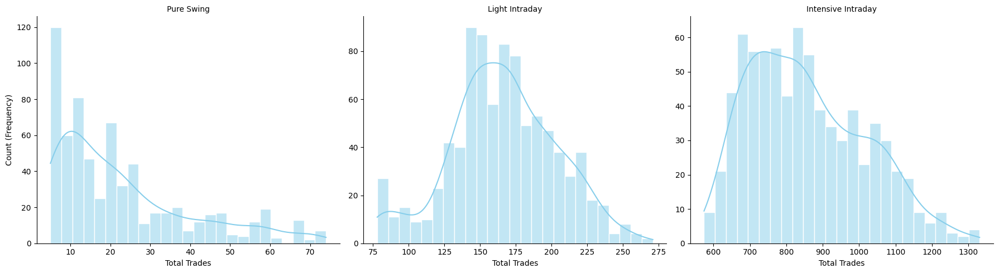

In [76]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Add a temporary label column to identify each population
df_pure_swing['population'] = 'Pure Swing'
df_light_intraday['population'] = 'Light Intraday'
df_intensive_intraday['population'] = 'Intensive Intraday'

# 2. Combine the cleaned populations into a single temporary DataFrame
df_plot = pd.concat([df_pure_swing, df_light_intraday, df_intensive_intraday])

# 3. Create a 3-column side-by-side distribution plot
g = sns.FacetGrid(
    data=df_plot,
    col="population",
    col_order=['Pure Swing', 'Light Intraday', 'Intensive Intraday'],
    sharex=False, # Allows each column to have its own custom X axis scale
    sharey=False, # Allows each column to have its own custom Y axis scale
    height=5,
    aspect=1.2
)

# 4. Map the histogram and density curve to each column
g.map_dataframe(
    sns.histplot,
    x="total_trades",
    kde=True,
    color="skyblue",
    bins=25,
    edgecolor="white"
)

# 5. Add titles and layout adjustments
g.set_titles(col_template="{col_name}")
g.set_axis_labels("Total Trades", "Count (Frequency)")
plt.tight_layout()

# 6. Show the graph and clean memory
plt.show()


### Understanding population discrimination

In [80]:
import pandas as pd

pd.set_option('display.width', None)
pd.set_option('display.max_columns', None)

# Define structural hyperparameters
structural_hyperparams = ['window', 'stop_loss_sigma']

# 1. Analyze continuous structural hyperparameters (Mean values)
summary_continuous = pd.DataFrame({
    'Pure Swing (Mean)': df_pure_swing[structural_hyperparams].mean(),
    'Light Intraday (Mean)': df_light_intraday[structural_hyperparams].mean(),
    'Intensive Intraday (Mean)': df_intensive_intraday[structural_hyperparams].mean()
})

print("--- STRUCTURAL HYPERPARAMETERS (CONTINUOUS/NUMERIC) ---")
print(summary_continuous.round(2).to_string(line_width=1000))
print("\n")

# 2. Analyze categorical structural hyperparameters (Distribution Breakdown)
categorical_hyperparams = ['time_frame', 'semester']

print("--- CATEGORICAL HYPERPARAMETERS DISTRIBUTION (%) ---")
for param in categorical_hyperparams:
    print(f"\n[Distribution of {param}]")

    # Calculate percentage breakdown for each population
    dist_swing = df_pure_swing[param].value_counts(normalize=True) * 100
    dist_light = df_light_intraday[param].value_counts(normalize=True) * 100
    dist_heavy = df_intensive_intraday[param].value_counts(normalize=True) * 100

    # Combine into a single readable DataFrame
    df_dist = pd.DataFrame({
        'Pure Swing (%)': dist_swing,
        'Light Intraday (%)': dist_light,
        'Intensive Intraday (%)': dist_heavy
    }).fillna(0) # In case a timeframe/semester is completely missing from a group

    print(df_dist.round(1).to_string(line_width=1000))


--- STRUCTURAL HYPERPARAMETERS (CONTINUOUS/NUMERIC) ---
                 Pure Swing (Mean)  Light Intraday (Mean)  Intensive Intraday (Mean)
window                        10.0                  27.49                       30.0
stop_loss_sigma                2.5                   2.50                        2.5


--- CATEGORICAL HYPERPARAMETERS DISTRIBUTION (%) ---

[Distribution of time_frame]
            Pure Swing (%)  Light Intraday (%)  Intensive Intraday (%)
time_frame                                                            
30min                 58.4                87.5                     0.0
5min                  41.6                12.5                   100.0

[Distribution of semester]
          Pure Swing (%)  Light Intraday (%)  Intensive Intraday (%)
semester                                                            
S1                  24.6                25.3                    25.0
S2                  23.7                26.0                    25.0
S3              

#### Interpretation

- 100% de l'intensive intraday sont des bots `m5`
- La grande majorite des bots "light intraday" sont `m30`
- Des bots `m5` font du "pure swing" => etudier si c'est due a une restriction des params
- Les configs sont correctement reparties sur chaque semestre

# Analysis: Global metrics by population

## All-time

### Code

In [83]:
import pandas as pd

# 1. Define the 3 analytical pillars based on your columns
performance_cols = ['cumulative_monetary_profit_net', 'relative_expected_value_net']
stability_cols   = ['sharpe_ratio_net', 'sortino_ratio_net', 'profit_factor_net', 'win_ratio_net']
risk_cols        = ['drawdown_max', 'recovery_factor_net', 'max_consecutive_losses_net', 'trade_time_mean']

# 2. Compute the robust median for each pillar across populations
df_perf_pillar      = df_plot.groupby('population')[performance_cols].median()
df_stability_pillar = df_plot.groupby('population')[stability_cols].median()
df_risk_pillar      = df_plot.groupby('population')[risk_cols].median()

# 3. Print the results sequentially with perfect horizontal alignment
print("=" * 80)
print("Pillar 1: PURE PERFORMANCE (Medians)")
print("=" * 80)
print(df_perf_pillar.reindex(['Pure Swing', 'Light Intraday', 'Intensive Intraday']).to_string(line_width=1000))
print("\n")

print("=" * 80)
print("Pillar 2: STABILITY & EFFICIENCY (Medians)")
print("=" * 80)
print(df_stability_pillar.reindex(['Pure Swing', 'Light Intraday', 'Intensive Intraday']).to_string(line_width=1000))
print("\n")

print("=" * 80)
print("Pillar 3: RISK & RESILIENCE (Medians)")
print("=" * 80)
print(df_risk_pillar.reindex(['Pure Swing', 'Light Intraday', 'Intensive Intraday']).to_string(line_width=1000))
print("=" * 80)


Pillar 1: PURE PERFORMANCE (Medians)
                    cumulative_monetary_profit_net  relative_expected_value_net
population                                                                     
Pure Swing                             -311.113210                    -0.000152
Light Intraday                        -1714.200296                    -0.000113
Intensive Intraday                    -7963.725956                    -0.000099


Pillar 2: STABILITY & EFFICIENCY (Medians)
                    sharpe_ratio_net  sortino_ratio_net  profit_factor_net  win_ratio_net
population                                                                               
Pure Swing                 -0.827818          -0.689230           0.758618       0.500000
Light Intraday             -0.922410          -0.882946           0.889677       0.498858
Intensive Intraday         -3.626086          -3.120188           0.802286       0.536361


Pillar 3: RISK & RESILIENCE (Medians)
                    drawdown

### Graphic

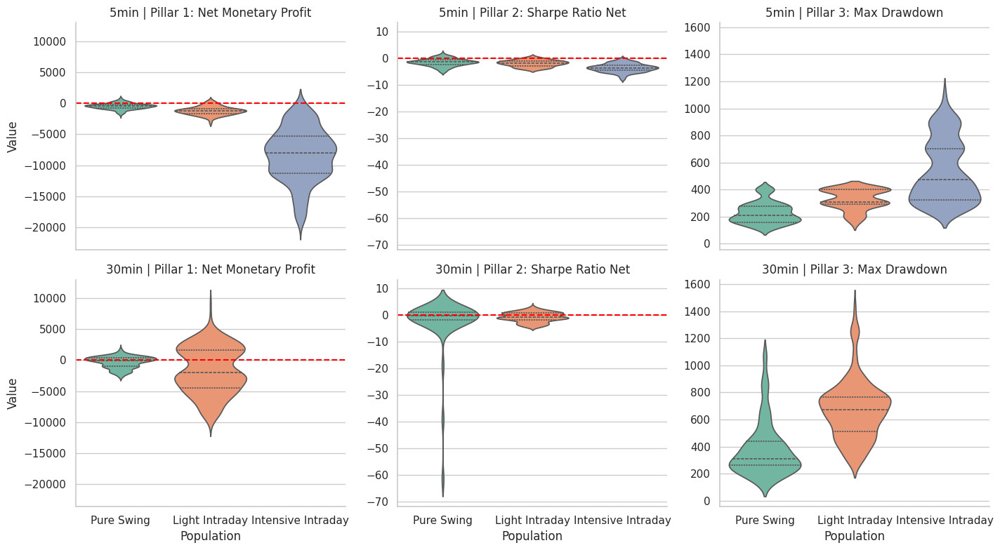

In [87]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Reuse the clean melted DataFrame from the previous step
metrics_to_plot = {
    'cumulative_monetary_profit_net': 'Pillar 1: Net Monetary Profit',
    'sharpe_ratio_net': 'Pillar 2: Sharpe Ratio Net',
    'drawdown_max': 'Pillar 3: Max Drawdown'
}

df_melted = df_plot[['population', 'time_frame'] + list(metrics_to_plot.keys())].copy()
df_melted = df_melted.melt(
    id_vars=['population', 'time_frame'],
    value_vars=list(metrics_to_plot.keys()),
    var_name='pillar_metric',
    value_name='metric_value'
)
df_melted['pillar_metric'] = df_melted['pillar_metric'].map(metrics_to_plot)

# 2. Build the Grid Matrix using corrected Seaborn parameters
g = sns.catplot(
    data=df_melted,
    x='population',
    y='metric_value',
    hue='population',  # Fix: Assigning x variable to hue
    row='time_frame',
    col='pillar_metric',
    row_order=['5min', '30min'],
    col_order=['Pillar 1: Net Monetary Profit', 'Pillar 2: Sharpe Ratio Net', 'Pillar 3: Max Drawdown'],
    order=['Pure Swing', 'Light Intraday', 'Intensive Intraday'],
    kind='violin',
    inner='quartile',
    sharey='col',
    height=4,
    aspect=1.2,
    palette='Set2',
    legend=False        # Fix: Turning off unnecessary legend
)

# 3. Add the statistical reference line (y=0) on Performance and Stability pillars
for (row_idx, col_idx), ax in g.axes_dict.items():
    if col_idx in ['Pillar 1: Net Monetary Profit', 'Pillar 2: Sharpe Ratio Net']:
        ax.axhline(0, color='red', linestyle='--', linewidth=1.5)

# 4. Refine layout titles and labels
g.set_titles(row_template="{row_name}", col_template="{col_name}")
g.set_axis_labels("Population", "Value")
plt.tight_layout()

# 5. Display the clean violin matrix grid
plt.show()


### Graphic: Spit gross/net

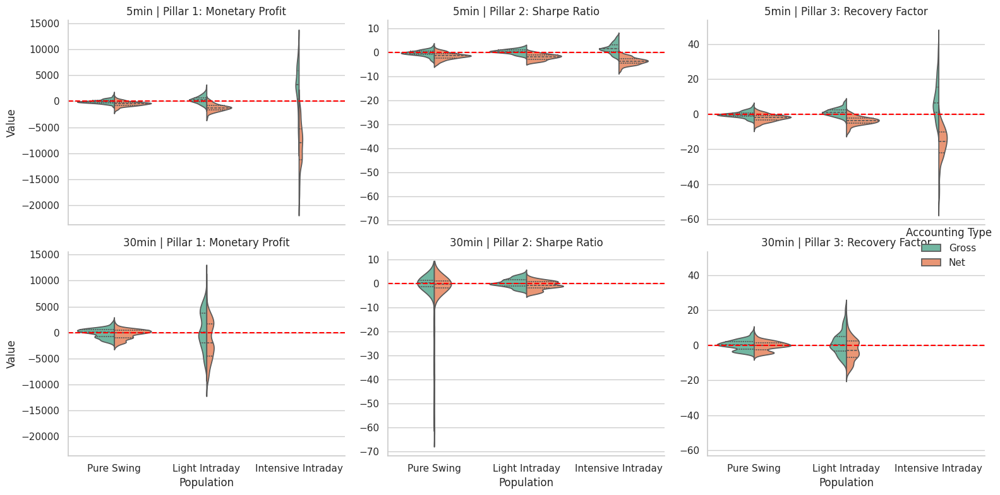

In [90]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Define the pairs of Gross vs Net metrics to compare
metrics_mapping = [
    # Format: (gross_col, net_col, visual_title)
    ('cumulative_monetary_profit_gross', 'cumulative_monetary_profit_net', 'Pillar 1: Monetary Profit'),
    ('sharpe_ratio_gross', 'sharpe_ratio_net', 'Pillar 2: Sharpe Ratio'),
    ('recovery_factor_gross', 'recovery_factor_net', 'Pillar 3: Recovery Factor') # Swapped drawdown for recovery factor to easily compare gross/net
]

# 2. Rebuild a dedicated DataFrame for the split visualization
extracted_data = []
for gross_col, net_col, title in metrics_mapping:
    # Extract Gross data
    df_g = df_plot[['population', 'time_frame', gross_col]].copy()
    df_g.columns = ['population', 'time_frame', 'metric_value']
    df_g['pillar_title'] = title
    df_g['accounting_type'] = 'Gross'

    # Extract Net data
    df_n = df_plot[['population', 'time_frame', net_col]].copy()
    df_n.columns = ['population', 'time_frame', 'metric_value']
    df_n['pillar_title'] = title
    df_n['accounting_type'] = 'Net'

    extracted_data.extend([df_g, df_n])

df_split_violin = pd.concat(extracted_data, ignore_index=True)

# 3. Create the Grid Matrix with split=True
g = sns.catplot(
    data=df_split_violin,
    x='population',
    y='metric_value',
    hue='accounting_type', # Controls the left/right split inside the violin
    row='time_frame',
    col='pillar_title',
    row_order=['5min', '30min'],
    col_order=['Pillar 1: Monetary Profit', 'Pillar 2: Sharpe Ratio', 'Pillar 3: Recovery Factor'],
    order=['Pure Swing', 'Light Intraday', 'Intensive Intraday'],
    kind='violin',
    split=True,            # Crucial: Splits the violin into two halves (Left vs Right)
    inner='quartile',
    sharey='col',
    height=4,
    aspect=1.2,
    palette={'Gross': '#66c2a5', 'Net': '#fc8d62'}, # Clean contrasting colors
    legend=True
)

# 4. Add the statistical reference line (y=0) across all subplots
for (row_idx, col_idx), ax in g.axes_dict.items():
    ax.axhline(0, color='red', linestyle='--', linewidth=1.5)

# 5. Refine titles and layout
g.set_titles(row_template="{row_name}", col_template="{col_name}")
g.set_axis_labels("Population", "Value")
g._legend.set_title("Accounting Type")
plt.tight_layout()

# 6. Display the split matrix grid
plt.show()


### Results

- Profit:
    - M5
        - pure swing: Ecrase sur zero, plutot stable vis-a-vis des frais
        - light: les gains brutes sont annules par les frais
        - intensive: les gain brutes s'envolent, montrant un "edge" reel mais sont totalement ecrase par les frais
            => Garder les strategies sur un autre "broker" avec des spreads plus petit ou augmenter le filtrage sur le gain
    - M30
        - light: le plus prometteur, les frais ne detruisent pas l'edge mais agissent comme une simple "taxe"
        - pure: compact, faible volume, ne provoque pas vraiment une augmentation du capital
- Sharpe Ratio:
    - M5: L'avantage statistique y est insuffisant pour battre la friction.
    - M30:
        - light: non seulement profitable, mais robuste sur le plan rendement/risque
        - pure: certain decolles haut, on doit pouvoir extraire des "snipers", mais attention certaines configuration sont tres mauvaises!
- Recovery Factor:
    - M5: les frais ecrasent tout
    - M30:
        - light: bonne resilience
        - pure: confirmation des "snipers"

=> Abandonner `M5` avec les frais de courtier actuel

## Split by Semester (M5)

### Viz

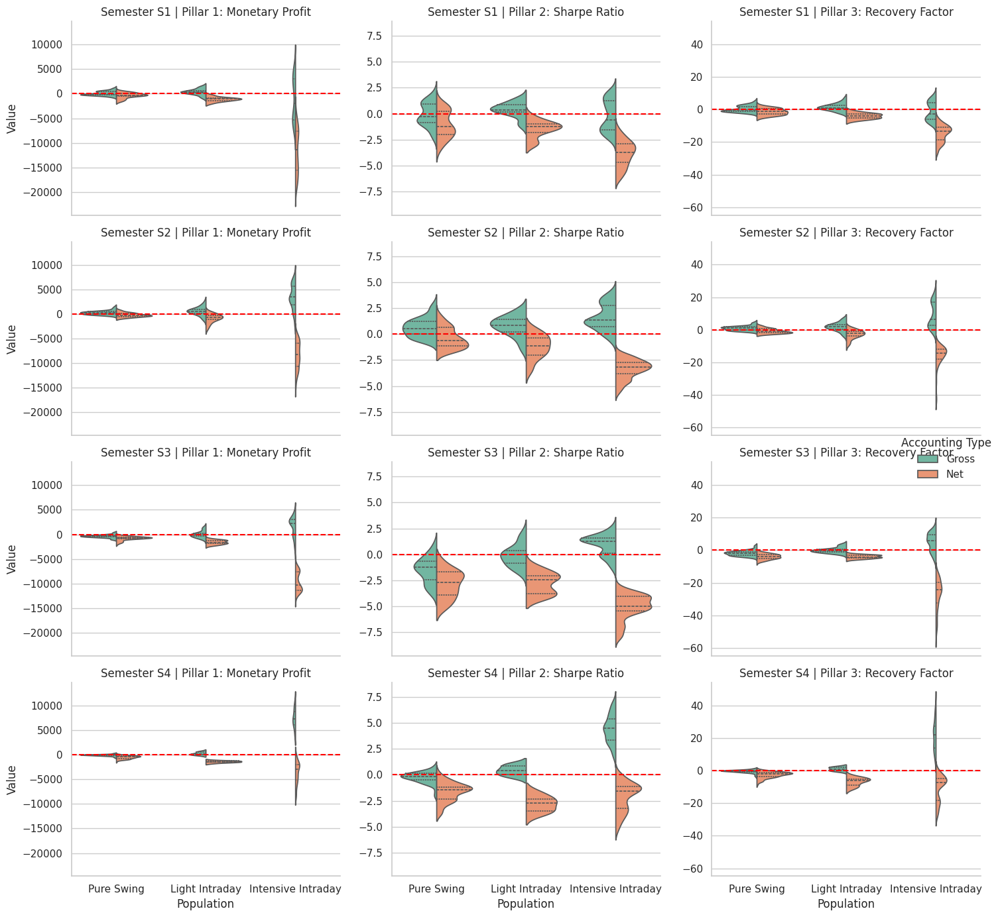

In [91]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Filter the main dataset to focus EXCLUSIVELY on the 5min (M5) timeframe
df_m5 = df_plot[df_plot['time_frame'] == '5min'].copy()

# 2. Define the metrics and pillars to analyze
metrics_mapping = [
    ('cumulative_monetary_profit_gross', 'cumulative_monetary_profit_net', 'Pillar 1: Monetary Profit'),
    ('sharpe_ratio_gross', 'sharpe_ratio_net', 'Pillar 2: Sharpe Ratio'),
    ('recovery_factor_gross', 'recovery_factor_net', 'Pillar 3: Recovery Factor')
]

# 3. Restructure the data into a long-form (melted) format for Seaborn
m5_extracted_data = []
for gross_col, net_col, title in metrics_mapping:
    # Gross data extraction
    df_g = df_m5[['population', 'semester', gross_col]].copy()
    df_g.columns = ['population', 'semester', 'metric_value']
    df_g['pillar_title'] = title
    df_g['accounting_type'] = 'Gross'

    # Net data extraction
    df_n = df_m5[['population', 'semester', net_col]].copy()
    df_n.columns = ['population', 'semester', 'metric_value']
    df_n['pillar_title'] = title
    df_n['accounting_type'] = 'Net'

    m5_extracted_data.extend([df_g, df_n])

df_m5_split = pd.concat(m5_extracted_data, ignore_index=True)

# 4. Build the Grid Matrix: Rows = semester (S1 to S4), Columns = 3 Pillars
g = sns.catplot(
    data=df_m5_split,
    x='population',
    y='metric_value',
    hue='accounting_type',
    row='semester',
    col='pillar_title',
    row_order=['S1', 'S2', 'S3', 'S4'],
    col_order=['Pillar 1: Monetary Profit', 'Pillar 2: Sharpe Ratio', 'Pillar 3: Recovery Factor'],
    order=['Pure Swing', 'Light Intraday', 'Intensive Intraday'],
    kind='violin',
    split=True,
    inner='quartile',
    sharey='col', # Shares Y-axis per column to compare semesters on the same scale
    height=3.5,
    aspect=1.3,
    palette={'Gross': '#66c2a5', 'Net': '#fc8d62'},
    legend=True
)

# 5. Add the statistical reference line (y=0) across all subplots
for (row_idx, col_idx), ax in g.axes_dict.items():
    ax.axhline(0, color='red', linestyle='--', linewidth=1.5)

# 6. Refine visual details and spacing
g.set_titles(row_template="Semester {row_name}", col_template="{col_name}")
g.set_axis_labels("Population", "Value")
g._legend.set_title("Accounting Type")
plt.tight_layout()

# 7. Render the 4x3 matrix grid
plt.show()


### Results

- L'annihilation des gains est generalise, independemment du regime
- Une infime partie des "pure swing" semble etre profitable en S1

## Split by Semester (M30)

### Viz

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Ensure we are working only on the M30 melted dataset
# (We reuse the df_m30_split from the previous step which already excludes Intensive Intraday)
semesters = ['S1', 'S2', 'S3', 'S4']

# 2. Loop through each semester to generate a dedicated, clean visualization
for sem in semesters:
    # Filter data for the current semester
    df_sem = df_m30_split[df_m30_split['semester'] == sem]

    # Initialize a 1-row, 3-column figure for the current semester
    fig, axes = plt.subplots(1, 3, figsize=(16, 4.5))
    fig.suptitle(f"--- SEMESTER {sem} ANALYSIS (M30 Timeframe) ---", fontsize=14, fontweight='bold', y=1.02)

    col_order = ['Pillar 1: Monetary Profit', 'Pillar 2: Sharpe Ratio', 'Pillar 3: Recovery Factor']

    # Plot each pillar side-by-side
    for idx, pillar_title in enumerate(col_order):
        ax = axes[idx]
        df_pillar = df_sem[df_sem['pillar_title'] == pillar_title]

        # Draw the split violin plot
        sns.violinplot(
            data=df_pillar,
            x='population',
            y='metric_value',
            hue='accounting_type',
            order=['Pure Swing', 'Light Intraday'],
            split=True,
            inner='quartile',
            palette={'Gross': '#66c2a5', 'Net': '#fc8d62'},
            ax=ax,
            legend=(idx == 2) # Show legend only on the last subplot to avoid clutter
        )

        # Add the vital red zero baseline
        ax.axhline(0, color='red', linestyle='--', linewidth=1.5)

        # Labels and design refinements
        ax.set_title(pillar_title, fontsize=11)
        ax.set_xlabel("Population")
        ax.set_ylabel("Value")

    plt.tight_layout()
    plt.show()
    print("\n" + "="*90 + "\n") # Visual separator in Jupyter console


### S1

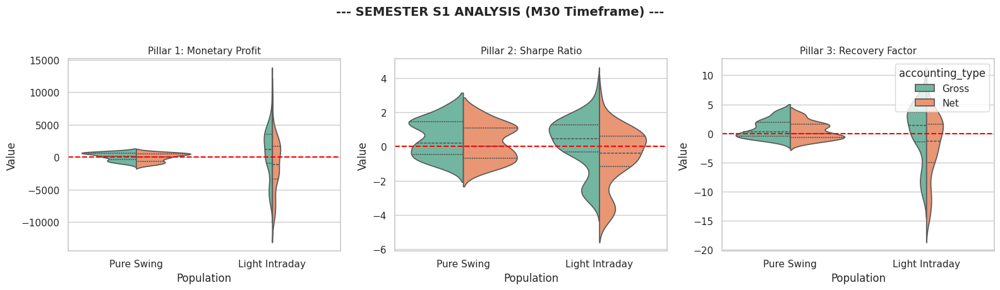


- Monetary:
    - pure: un sous-groupe d'elite semble afficher un tres bon sharpe, malgre des rendement moins impressionant
    - light: un sous-groupe semble survivre a S1
- Sharpe:
    - pure: 25% des configurations ont un sharpe tres honorable
    - light: plus de la moitie des configurations sont rentables
- Recovery:
    - pure: la majorite des configurations recuperent de leurs pertes
    - light: attention a la "goutte d'eau", certaines configuration s'etirent vers le bas

=> S1 est potentiellement un "bon" regime pour les bots

### S2

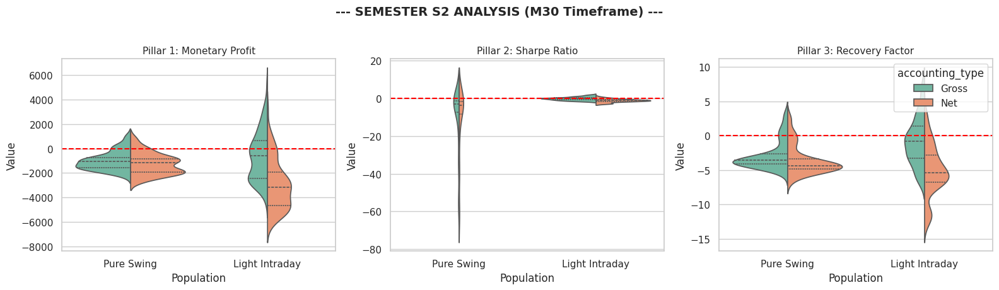

- Semestre globalement hostile
- Moneraty: environ 10% des configs survivent a ce semestre hostile
- Sharpe:
    - pure: risque asymetrique (pour les bots avec trop peu de trade?)
    - light: ecrase sur le zero, pas d'avantage net
- Recovery: les configs n'arrivent pas "recuperer"

### S3

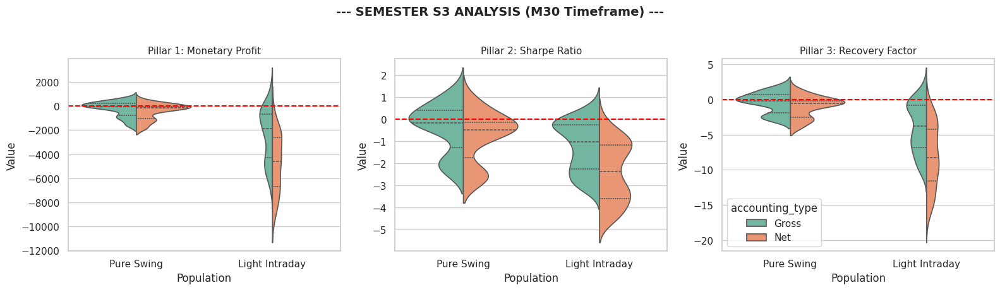

- Semestre probablement le plus hostile de tous
- Monetary:
    - pure: quelques rares survivant arrivent a etre positif
    - light: effondrement, aucune configuration ne semble performer
- Sharpe:
    - pure: on retrouve le groupe "elite" legerement au dessus de zero
    - light: effondrement
- Recovery:
    - pure: micro-bosse positive
    - light: effondrement

=> Test de resistance du bot avec quelques "pures swing elites", les light intraday s'effondrent 

### S4

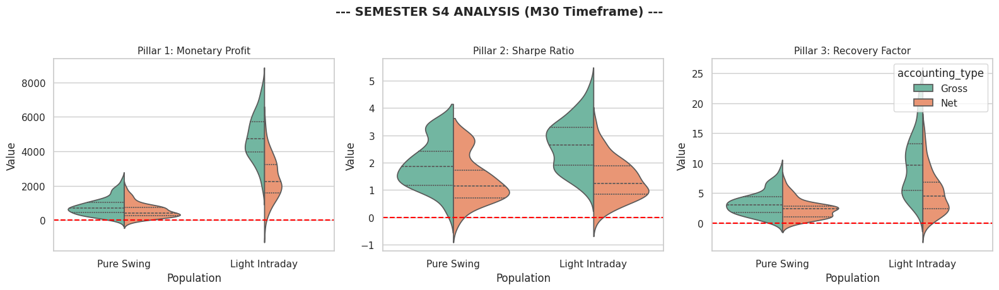

- Periode extremement performante!
- Monetary:
    - pure: la distribution decolle au dessus de zero, mais le rendement total reste faible par rapport au light
    - light: la quasi-totalite des configs sont bien au dessus de zero (+1500 -> +5000)
- Sharpe:
    - pure: idealement positionne (1.2) avec le quartile superieur au dessus de 2
    - light: + de 75% de la pop est poritable, et 25% sont >2
- Recovery: efficacite de recuperation maximale dans les deux cas

### Conclusion

- Dépendance critique aux régimes de marché
- Le semestre S4 a agi comme une anomalie miraculeuse. C'est la seule période où plus de 75 % des configurations (Light Intraday) lévitent proprement au-dessus de zéro avec des profits nets massifs (jusqu'à +5 000).
- S1 est le seul semestre "normal" qui valide scientifiquement l'avantage statistique du modèle. Près de 50 % des configurations du Light Intraday y maintiennent un Sharpe Net et un profit positifs, prouvant que la stratégie a les capacités d'absorber les frais hors période exceptionnelle.
- La toxicité asymétrique du Pure Swing en S2/S3 : Les semestres S2 et S3 ont agi comme des révélateurs de risques

=>  L'écosystème 30 minutes possède une valeur brute et nette bien réelle, mais il souffre d'un manque de filtres de régime de marché. Vos algorithmes performent dans les tendances saines et fluides (S1, S4) mais se font punir par les frais ou les pertes consécutives dans les marchés de compression ou de forte incertitude (S2, S3)


# Analysis: Hyper-parameter to population (pure swing, light/intensive intraday)

## Globals

In [100]:
import pandas as pd

# Ensure window is numeric
df_plot['window'] = df_plot['window'].astype(float)

print("=" * 90)
print("IMPACT OF WINDOW SIZE ON POPULATION SELECTION (%)")
print("=" * 90)

for tf in ['5min', '30min']:
    df_tf = df_plot[df_plot['time_frame'] == tf]
    print(f"\n--- Timeframe: {tf} ---")

    # Create a cross-tabulation table normalized by row (by window size)
    cross_tab = pd.crosstab(
        index=df_tf['window'],
        columns=df_tf['population'],
        normalize='index' # Calculates the % of each population for a given window size
    ) * 100

    # Ensure correct column ordering for visual scanning
    available_cols = [c for c in ['Pure Swing', 'Light Intraday', 'Intensive Intraday'] if c in cross_tab.columns]
    cross_tab = cross_tab[available_cols]

    print(cross_tab.round(1).to_string(line_width=1000))
print("=" * 90)


IMPACT OF WINDOW SIZE ON POPULATION SELECTION (%)

--- Timeframe: 5min ---
population  Pure Swing  Light Intraday  Intensive Intraday
window                                                    
10.0              71.4            28.6                 0.0
20.0               0.0             0.0               100.0
40.0               0.0             0.0               100.0

--- Timeframe: 30min ---
population  Pure Swing  Light Intraday
window                                
10.0             100.0             0.0
20.0               0.0           100.0
40.0               0.0           100.0


### Results

- M5:
    - window = 10.0 -> Partagé (71.4% Swing / 28.6% Light): La window laisse le choix
    - window = 20.0 ou 40.0: 100 % Intensive Intraday
- M30:
    - window = 10.0 -> Pure Swing
    - window = 20,40 -> Light Intraday

Ce comportement contre-intuitif (où une plus grande fenêtre génère plus de trades, ou du moins valide les populations les plus actives) s'explique généralement par la nature de l'indicateur. Si votre stratégie utilise un filtre de tendance ou une confirmation statistique (comme un R² ou un t-test), une fenêtre trop courte (10) est trop nerveuse, change constamment de direction et ne valide aucun signal stable (le bot est paralysé). Une fenêtre plus large (20 ou 40) lisse le bruit, valide des tendances plus stables et permet aux filtres de donner leur feu vert beaucoup plus souvent.

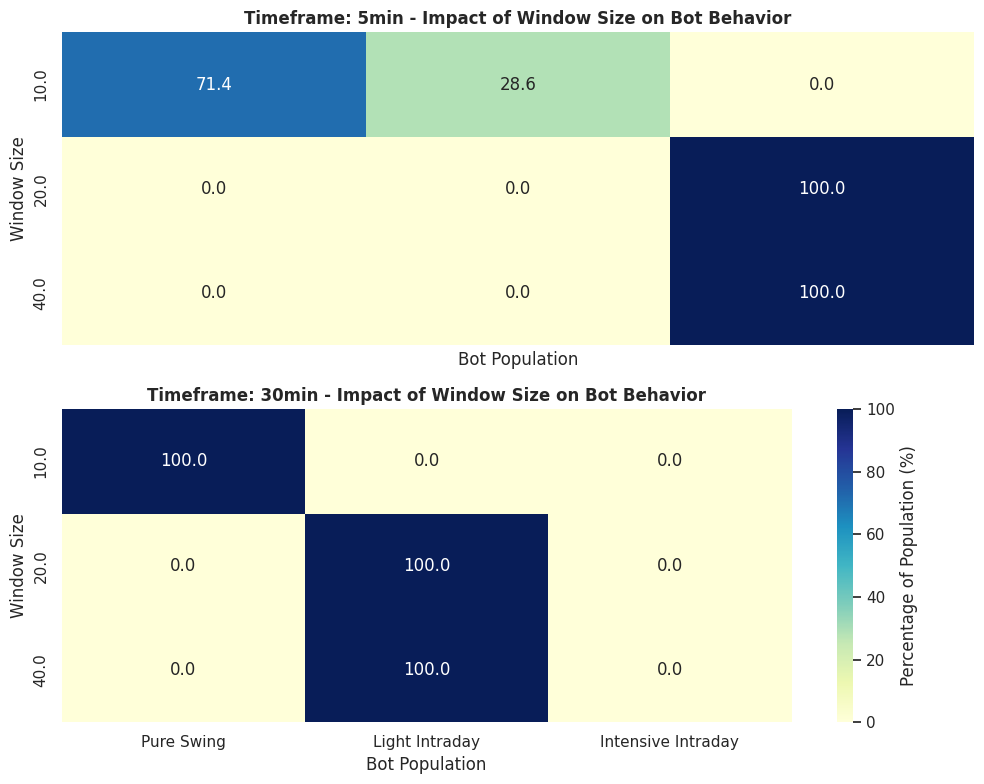

In [101]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Prepare the cross-tabulation data exactly like the terminal output
fig, axes = plt.subplots(2, 1, figsize=(10, 8), sharex=True)
timeframes = ['5min', '30min']
pop_order = ['Pure Swing', 'Light Intraday', 'Intensive Intraday']

for idx, tf in enumerate(timeframes):
    df_tf = df_plot[df_plot['time_frame'] == tf]

    # Create cross tab normalized by row
    cross_tab = pd.crosstab(
        index=df_tf['window'],
        columns=df_tf['population'],
        normalize='index'
    ) * 100

    # Reindex columns to ensure perfect alignment even if a population is missing (like Intensive in 30min)
    cross_tab = cross_tab.reindex(columns=pop_order, fill_value=0)

    # 2. Draw the Heatmap
    sns.heatmap(
        data=cross_tab,
        annot=True,          # Displays the exact % inside the cells
        fmt=".1f",           # Format with 1 decimal place
        cmap="YlGnBu",       # Clean progression from yellow (0%) to dark blue (100%)
        vmin=0,
        vmax=100,
        cbar=(idx == 1),     # Show the colorbar only on the bottom plot
        cbar_kws={'label': 'Percentage of Population (%)'},
        ax=axes[idx]
    )

    axes[idx].set_title(f"Timeframe: {tf} - Impact of Window Size on Bot Behavior", fontsize=12, fontweight='bold')
    axes[idx].set_xlabel("Bot Population")
    axes[idx].set_ylabel("Window Size")

plt.tight_layout()
plt.show()


## Per-semester

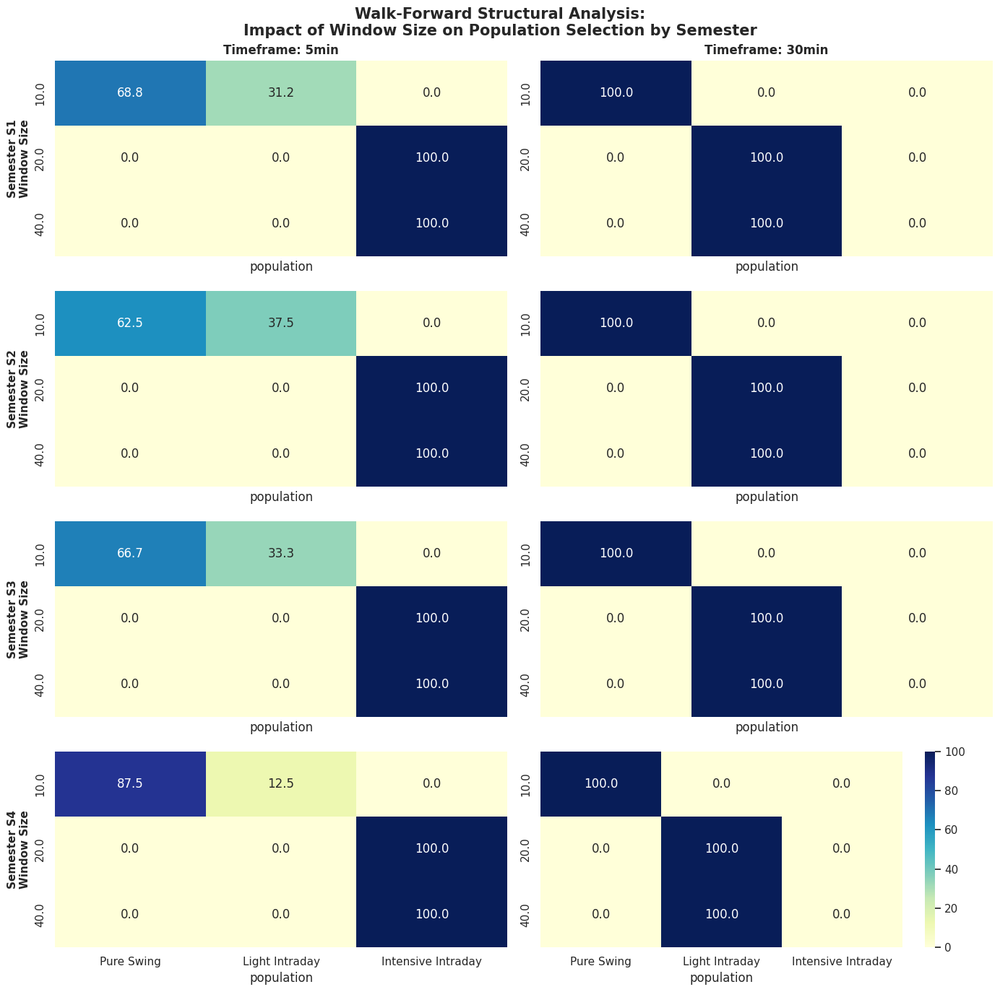

In [102]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure window is numeric
df_plot['window'] = df_plot['window'].astype(float)

# 1. Initialize a 4-row (semesters), 2-column (timeframes) grid
fig, axes = plt.subplots(4, 2, figsize=(14, 14), sharex=True)
semesters_list = ['S1', 'S2', 'S3', 'S4']
timeframes_list = ['5min', '30min']
pop_order = ['Pure Swing', 'Light Intraday', 'Intensive Intraday']

# 2. Iterate over Semesters and Timeframes to plot heatmaps
for row_idx, sem in enumerate(semesters_list):
    for col_idx, tf in enumerate(timeframes_list):
        ax = axes[row_idx, col_idx]

        # Filter data for current cell
        df_cell = df_plot[(df_plot['semester'] == sem) & (df_plot['time_frame'] == tf)]

        if len(df_cell) > 0:
            # Generate cross-tabulation table normalized by window row
            cross_tab = pd.crosstab(
                index=df_cell['window'],
                columns=df_cell['population'],
                normalize='index'
            ) * 100

            # Reindex to ensure consistent structure across the grid
            cross_tab = cross_tab.reindex(columns=pop_order, fill_value=0)

            # Draw the heatmap
            sns.heatmap(
                data=cross_tab,
                annot=True,
                fmt=".1f",
                cmap="YlGnBu",
                vmin=0,
                vmax=100,
                cbar=(col_idx == 1 and row_idx == 3), # Show only one colorbar at the bottom right
                ax=ax
            )

        # Add labels only where necessary to keep the plot clean
        if col_idx == 0:
            ax.set_ylabel(f"Semester {sem}\nWindow Size", fontweight='bold', fontsize=11)
        else:
            ax.set_ylabel("")

        if row_idx == 0:
            ax.set_title(f"Timeframe: {tf}", fontsize=12, fontweight='bold')

plt.suptitle("Walk-Forward Structural Analysis:\nImpact of Window Size on Population Selection by Semester", fontsize=15, fontweight='bold', y=0.98)
plt.tight_layout()
plt.show()


### Results

- Le regime ne semble pas impacter le changement de comportement du bot
- En `m30`: independemment du regime, `window` verrouille le comportement du bot (swing vs light intraday)
- En `m5`:
    - `window` 20 ou 40: force l'intensive intraday
    -`window` 10:
        - sur S4, les filtres ont retenu le bot qui est devenu pure swing, 
        - sinon, la nervosité de la fenêtre 10 a piégé le modèle et forcé plus de 30% des configurations à sur-trader en Light Intraday

=> Le parametre `window` est un vrai interrupteur comportementale

# Interlude: comportement des bots et interrupteur window

## Resume executif et methodologie

Ce rapport formalise l'analyse statistique et structurelle de la base de donnees de backtests de trading. L'objectif de cette etude etait d'identifier les conditions d'execution viables pour les algorithmes en separant le bruit statistique des veritables avantages mathematiques nets. L'analyse a ete menee de maniere agnostique en confrontant systematiquement les performances brutes (Gross) aux performances reelles apres frais et slippage (Net), a travers differents regimes de marche (Semestres S1 a S4).

Le jeu de donnees initial a ete nettoye en excluant 768 configurations invalides qui ne generaient strictement aucun trade (toutes associees a l'hyperparametre window=5). Apres cette purge, l'espace de recherche se structure autour de 2 304 configurations uniques, reparties de maniere homogene et statistiquement significative.

## Cartographie macroscopique et tri-partition des donnees

L'etude de la densite de probabilite et de la distribution de la colonne `total_trades` a mis en evidence une repartition trimodale tres marquee. Contrairement a une approche lineaire classique, les configurations se scindent de maniere etanche en trois populations distinctes aux comportements operationnels specifiques :

* Pure Swing (658 configurations) : Profil de type sniper. Ces robots sont tres restrictifs et declenchent moins de 75 trades sur l'ensemble de l'historique, soit une moyenne contractuelle de 2.9 trades par semaine.
* Light Intraday (878 configurations) : Profil actif modere. Ces configurations se situent dans une tranche allant de 75 a 400 trades sur l'historique, s'stabilisant a une moyenne de 35.7 trades par semaine.
* Intensive Intraday (768 configurations) : Profil a haute frequence declenchant plus de 400 trades sur l'historique. Cette population est exclusivement cantonnee aux horizons temporels ultra-courts.

## Le choc de la friction et condamnation de l horizon M5

L'integration des graphiques en violons separes (Split Violin Plots) a mis en lumiere un phenomene de friction destructive systematique sur l'horizon temporel de 5 minutes (M5).

* L'illusion du Gross : En version brute (sans frais), l'horizon M5 valide brillamment la logique mathematique de la strategie. Le profit cumulere grimpe jusqu'a +15 000, le Sharpe Ratio brut depasse +5.0 et le Facteur de Recuperation (Recovery Factor) atteint des sommets theoriques au-dessus de +40.
* L'annihilation par le Net : Des que la friction des frais de courtage et du slippage est appliquee, l'integralite de la distribution de l'horizon M5 s'effondre en territoire negatif. Le Sharpe Ratio Net se stabilise dans une zone toxique comprise entre -1.0 et -8.0, tandis que le Recovery Factor Net plonge uniformement a -20.
* Diagnostic : En M5, l'amplitude moyenne du gain par trade est inferieure au cout d'execution. La repetition a haute frequence des transactions detruit le capital lineairement. L'horizon M5 est declare structurellement non viable et doit etre definitivement banni de la production.

## Analyse de robustesse temporelle de l horizon M30

L'horizon 30 minutes (M30) est le seul ecosysteme capable de digerer les frais car l'amplitude des mouvements captures y est plus large. Cependant, son analyse temporelle de type Walk-Forward detaillee sur 4 semestres revele une forte dependance aux regimes de marche :

* Le biais de performance du Semestre S4 : L'apparente rentabilite globale du Light Intraday 30min etait portee par un semestre exceptionnel. Durant S4, plus de 75% de la population lévite proprement au-dessus de zero, enregistrant des profits nets superieurs a +5 000 et des Sharpes stables (> +2.0).
* La validation reelle du Semestre S1 : S1 s'impose comme la periode de validation de reference. Pres de 50% de la population Light Intraday y conserve une espérance mathématique nette positive, confirmant la viabilite du modele hors periode euphorique.
* La toxicite asymetrique du Pure Swing en S2/S3 : Les semestres S2 et S3 ont agi comme des révélateurs de risques majeurs. En periode de range ou de bruit, le manque de transactions du mode Pure Swing l'empeche de lisser statistiquement ses series de pertes. Cela engendre des effondrements locaux catastrophiques de Sharpe Net allant jusqu'a -75.

## Loi mecanique de l hyperparametre window

L'analyse de contingence croisee appliquee aux semestres a demontre que la taille de la fenetre de calcul (`window`) n'exerce pas une influence diffuse, mais agit comme un veritable commutateur structurel absolu :

* Regime 30 minutes (M30) : Une valeur de window = 10.0 verrouille de maniere immuable 100.0% des configurations dans la population Pure Swing. A l'inverse, migrer vers une window de 20.0 ou 40.0 propulse instantanement 100.0% des configurations dans la population Light Intraday. Le marche sous-jacent n'a aucune prise sur cette transition.
* Regime 5 minutes (M5) : Les valeurs de 20.0 et 40.0 condamnent systematiquement 100.0% des configurations a sur-trader au sein de l'Intensive Intraday toxique. Seule la valeur de window = 10.0 offre une zone de respiration (71.4% Swing / 28.6% Light) permettant aux filtres de strategie de s'exprimer.

## Conclusion generale et orientations de recherche

L'espace de recherche est desormais scientifiquement restreint et valide :
1. L'horizon M5 est elimine de l'environnement de production.
2. L'horizon M30 est valide comme seule base de travail viable.
3. Le niveau d'activite du bot (Swing ou Intraday) est pilote rigidement par la taille de la window.
4. Le modele doit imperativement integrer un filtre de regime de marche supplementaire pour desactiver le robot ou resserrer ses regles d'entree pendant les phases de bruit et de compression (types semestres S2 et S3).


# Analysis: stop-loss sigma

## Global

In [103]:
import pandas as pd

# 1. Strictly isolate M30 and drop any leftover Intensive Intraday rows
df_m30_final = df_plot[
    (df_plot['time_frame'] == '30min') &
    (df_plot['population'].isin(['Pure Swing', 'Light Intraday']))
].copy()

# Ensure stop_loss_sigma is treated as numeric
df_m30_final['stop_loss_sigma'] = df_m30_final['stop_loss_sigma'].astype(float)

# 2. Run a grouped pivot analysis to see performance across populations and sigmas
df_sigma_analysis = df_m30_final.groupby(['population', 'stop_loss_sigma']).agg(
    config_count=('curve_id', 'count'),
    avg_total_trades=('total_trades', 'mean'),
    median_sharpe_net=('sharpe_ratio_net', 'median'),
    median_net_profit=('cumulative_monetary_profit_net', 'median'),
    avg_max_drawdown=('drawdown_max', 'mean')
).reset_index()

print("=" * 115)
print("M30 HYPERPARAMETER FOCUS: IMPACT OF STOP LOSS SIGMA BY POPULATION")
print("=" * 115)
# Using line_width to ensure clean horizontal rendering without any '\'
print(df_sigma_analysis.round(2).to_string(index=False, line_width=1000))
print("=" * 115)


M30 HYPERPARAMETER FOCUS: IMPACT OF STOP LOSS SIGMA BY POPULATION
    population  stop_loss_sigma  config_count  avg_total_trades  median_sharpe_net  median_net_profit  avg_max_drawdown
Light Intraday              1.5           256            204.17              -1.57           -3535.37            531.71
Light Intraday              2.5           256            169.41              -0.46           -1415.27            644.04
Light Intraday              3.5           256            147.45               0.15             296.84            838.97
    Pure Swing              1.5           128             16.64               0.07              24.17            261.95
    Pure Swing              2.5           128             16.44              -0.13             -63.17            388.09
    Pure Swing              3.5           128             16.20              -0.48            -187.08            488.64


## Per-semester

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Prepare configuration profile labels and order
df_sigma_split['config_profile'] = df_sigma_split['population'] + " (σ=" + df_sigma_split['stop_loss_sigma'].astype(str) + ")"

x_order = [
    'Pure Swing (σ=1.5)', 'Pure Swing (σ=2.5)', 'Pure Swing (σ=3.5)',
    'Light Intraday (σ=1.5)', 'Light Intraday (σ=2.5)', 'Light Intraday (σ=3.5)'
]

semesters = ['S1', 'S2', 'S3', 'S4']
col_order = ['Pillar 1: Monetary Profit', 'Pillar 2: Sharpe Ratio', 'Pillar 3: Recovery Factor']

# 2. Loop through each semester to generate a dedicated visualization
for sem in semesters:
    df_sem = df_sigma_split[df_sigma_split['semester'] == sem]

    # Initialize a 1-row, 3-column figure for the current semester
    fig, axes = plt.subplots(1, 3, figsize=(18, 5.5))
    fig.suptitle(f"--- SEMESTER {sem} ANALYSIS (M30 Timeframe by Sigma) ---", fontsize=14, fontweight='bold', y=1.02)

    # Plot each pillar side-by-side
    for idx, pillar_title in enumerate(col_order):
        ax = axes[idx]
        df_pillar = df_sem[df_sem['pillar_title'] == pillar_title]

        # Draw the split violin plot
        sns.violinplot(
            data=df_pillar,
            x='config_profile',
            y='metric_value',
            hue='accounting_type',
            order=x_order,
            split=True,
            inner='quartile',
            palette={'Gross': '#66c2a5', 'Net': '#fc8d62'},
            ax=ax,
            legend=(idx == 2) # Show legend only on the last subplot
        )

        # Add the vital red zero baseline
        ax.axhline(0, color='red', linestyle='--', linewidth=1.5)

        # Rotate labels for crisp readability in VS Code
        ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=9)

        # Labels and design refinements
        ax.set_title(pillar_title, fontsize=11, fontweight='bold')
        ax.set_xlabel("Configuration Profile")
        ax.set_ylabel("Value")

    plt.tight_layout()
    plt.show()
    print("\n" + "="*110 + "\n") # Visual separator in Jupyter console


### S1

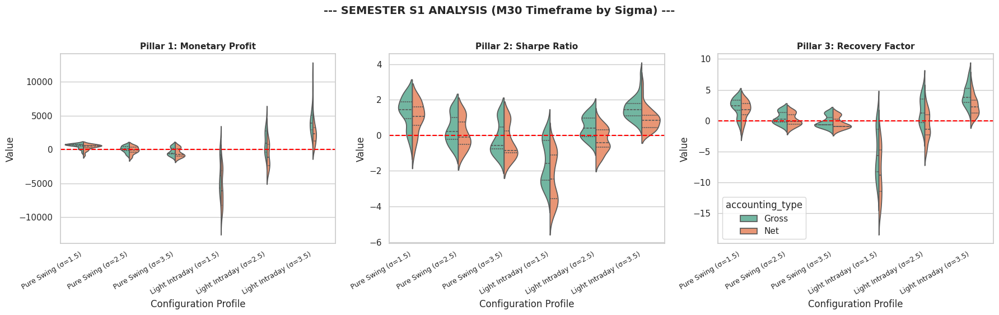

- pure: sigma serre (1.5), le mode sniper exige de couper court
- light: sigma large (3.5), il faut laisser respirer

### S2

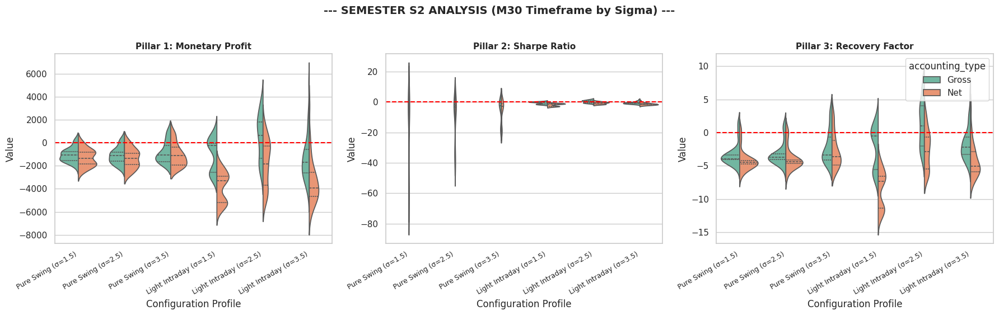

- globalement hostile
- pure: perte contenue, un sigma plus eleve semble ameliorer les performances
- light: sigma moyen (2.5) semble etre un meilleur compromis

### S3

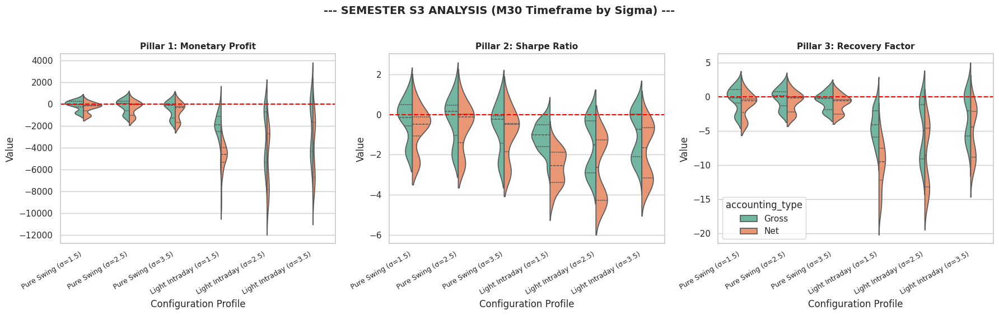

- pure: sigma 2.5 est le plus robuste
- light: sigma 2.5 semble plus stable, meme si sigma 3.5 performe mieux

### S4

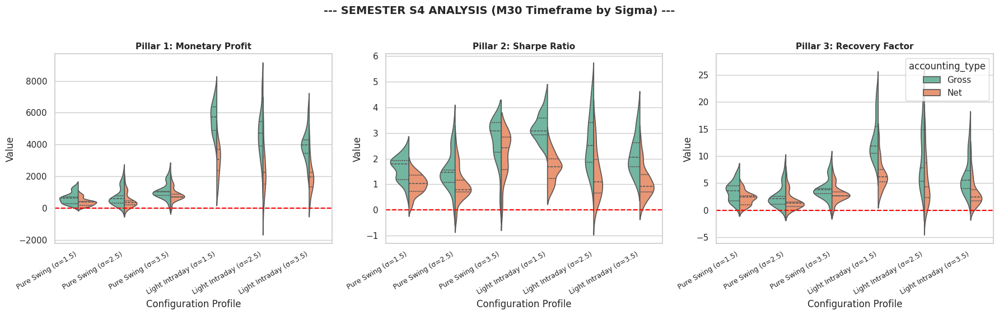

- pure: sigma 3.5 sur-performe, un sigma serre fait sortir le bot trop tot
- light: sigma 1.5 semble mieux performe (coupe les pertes plus tot)

## Bot Profiles

### Identification des quatre profils structurels de bots

L'analyse approfondie de l'hyperparametre `stop_loss_sigma` croisee avec les regimes de marche (Semestres S1 a S4) sur l'horizon 30 minutes (M30) demontre qu'il est mathematiquement suboptimal de chercher un parametrage fixe unique. L'espace de recherche se segmente en realite de maniere etanche autour de quatre configurations d'elite distinctes, possedant chacune leur propre specialite operationnelle et leur tolerance au risque.

---

### Profils Pure Swing (Window=10)

#### 1. Pure Swing "Sniper" (window=10, sigma=1.5)
* Profil : Ultra-agressif sur un volume tres restreint de transactions.
* Regime de predilection : Les tendances saines, fluides et lineaires (type Semestre S1).
* Vulnerabilite : Subit un crash statistique severe de son Sharpe Ratio en periode de compression ou de range erratique (Semestre S2), car l'absence de volume empeche le lissage statistique des premieres pertes consecutives.
* Role : Maximiser le taux de reussite en coupant court au moindre signal invalide en phase de tendance propre.

#### 2. Pure Swing "All-Weather" (window=10, sigma=3.5)
* Profil : Conservateur, protecteur et lourd.
* Regime de predilection : Les grandes tendances macro-economiques (Semestre S4) ainsi que la survie absolue lors des grandes crises (Semestre S3).
* Vulnerabilite : Rendement et efficacite brides lors des phases de tendance a court terme, ou les stops larges laissent s'evaporer trop de profits latents.
* Role : Assurer la resilience du portefeuille en donnant l'espace necessaire aux positions pour survivre au bruit de marche pendant les turbulences.

---

### Profils Light Intraday (Window=20/40)

#### 3. Light Intraday "Formula 1" (window=20/40, sigma=1.5)
* Profil : Chasseur d'alpha a haute efficacite et faible latence.
* Regime de predilection : Les marches en tendance parfaite sans aucun bruit ni micro-retracement (type Semestre S4). Dans ce contexte, la protection serree a 1.5 s'avere redoutable et surforme massivement les autres configurations.
* Vulnerabilite : Se fait hacher systematiquement et accumule des pertes nettes massives (jusqu'a -12 000 de profit net) en periode de forte incertitude et de bruit permanent (Semestre S3).
* Role : Generer une appreciation geometrique du capital lorsque le marche est directionnel et propre.

#### 4. Light Intraday "Blinde" (window=20/40, sigma=3.5)
* Profil : Gestionnaire institutionnel axere sur la preservation du capital.
* Regime de predilection : La regularite en marche normal (Semestre S1) et la resistance ultime aux pires conditions historiques (Semestre S3).
* Vulnerabilite : Performance bridee et gains maximaux reduits lors des phases d'euphorie boursiere.
* Role : Assurer le lissage statistique des gains a moyenne frequence en agissant comme le pilier defensif universel du systeme.

---

### Approches de mise en oeuvre de la flotte a quatre profils

L'identification de ces quatre profils distincts offre une alternative scientifique majeure à la recherche d'un compromis de paramétrage unique. En finance quantitative, disposer d'une telle matrice comportementale permet de basculer d'une logique de suroptimisation à une logique de gestion des risques avancée selon deux axes d'exploitation :

#### 1. L'approche Portefeuille (Allocation Diversifiée)
Plutôt que de chercher à sélectionner le meilleur robot, les quatre profils sont exécutés simultanément au sein d'un même portefeuille de trading. 
* Mécanique : En période d'euphorie, les gains exceptionnels générés par le profil *Formula 1* absorbent largement les micro-pertes de frottement des autres systèmes. À l'inverse, lors des retournements de tendance ou des phases de range destructrices, le profil *Blindé* amortit le choc et protège le capital global. Cette approche s'appuie sur la décorrélation des performances pour lisser la courbe de capitaux (Equity Curve).

#### 2. L'approche Toggling (Commutation Dynamique de Régime)
Cette approche consiste à n'activer qu'un seul profil à la fois en connectant la flotte à un filtre macroéconomique ou à un indicateur de texture de marché (ex: efficience de Kaufman, ratio de variance court terme/long terme).
* Mécanique : Le système identifie le régime actuel du marché. Si le marché est détecté comme fluide et directionnel, le commutateur active les profils agressifs (*Sniper* ou *Formula 1*). Dès que le bruit ou la compression augmentent, le système bascule automatiquement sur les profils défensifs (*All-Weather* ou *Blindé*) pour traverser la crise.

#### 3. Les Filtres Logiques comme Boucliers Structurels
L'analyse statistique montre que la vulnérabilité majeure de cette flotte réside dans l'effondrement du profil *Formula 1* durant les phases de crise (Semestre S3). L'étape suivante de la recherche consiste à auditer l'impact des filtres logiques conditionnels (variables booléennes). Si l'activation d'une règle comme le Test de Student (`use_ttest`) ou le coefficient de détermination (`use_r2`) permet de bloquer les faux signaux en période de crise sans brider l'alpha en période de tendance, le profil *Formula 1* pourrait atteindre une viabilité universelle.

---

## Synthese conceptuelle: La dualite entre parametrage specialiste et generaliste

L'etude croisee des profils demontre une loi mathematique et structurelle fondamentale en trading systematique : la distance de la barriere de protection (le Sigma) dicte de maniere absolue la vocation statistique et philosophique de l'algorithme. Il existe une distinction nette entre deux modeles de gestion.

#### 1. Le Sigma serre (sigma=1.5): L'outil exclusif du robot "Specialiste"
Un bot specialiste a pour mission unique d'exploiter une inefficience de marche ultra-precise, ephemere et purifiee de tout bruit (comme une impulsion directionnelle pure).
* Mecanique : L'algorithme part du principe que si le scenario millimetre ne se realise pas immediatement, l'avantage statistique s'eteint. Le stop a 1.5 agit comme un fusible d'eviction rapide. 
* Comportement : Le specialiste accepte de se faire sortir frequemment lors des phases d'hesitation, car son but n'est pas de survivre au bruit, mais de maximiser l'efficacite du capital uniquement lorsque le regime de marche est ideal (ex: Pure Swing Sniper en S1 ou Light Intraday F1 en S4). Laisser ce type de robot actif hors de sa niche entraine des crashs statistiques violents.

#### 2. Le Sigma large (sigma=3.5): L'armure obligatoire du robot "Generaliste"
Un bot generaliste a pour mission de rester operationnel en continu afin de lisser ses gains sur le long terme grace a la loi des grands nombres. Il est congu pour traverser tous les cycles.
* Mecanique : L'algorithme doit tolerer que le prix respire, retrace de maniere agressive ou produise de fausses cassures. Un stop a 3.5 agit comme une isolation thermique face aux turbulences.
* Comportement : Le generaliste accepte d'encaisser des pertes individuelles comptablement plus lourdes, mais sa vision macroscopique lui donne l'espace geometrique necessaire pour capter la tendance de fond a travers le temps (ex: Pure Swing All-Weather ou Light Intraday Blinde en S3). Il accepte de sous-performer dans l'euphorie pour garantir la survie systemique du capital lors des pires semestres.

#### Summary de gestion de la flotte M30
* Les Specialistes (sigma=1.5) : Concus pour la surperformance chirurgicale. Ils necessitent obligatoirement un interrupteur externe (filtre de regime de marche) ou des verrous algorithmiques internes severes pour etre coupes des que le marche devient bruyant.
* Les Generalistes (sigma=3.5) : Concus pour l'autonomie et la robustesse a long terme. Ils forment le socle defensif et resilient de l'architecture globale, capable de tourner sans surveillance active.

---

# Analysis: Shield impact on total_trades

## Global

In [117]:
import pandas as pd
import numpy as np

# 1. Strictly filter the dataframe for M30 and recreate the 4 profiles
df_m30 = df_plot[df_plot['time_frame'] == '30min'].copy()
df_m30['window'] = df_m30['window'].astype(float)
df_m30['stop_loss_sigma'] = df_m30['stop_loss_sigma'].astype(float)

conditions = [
    (df_m30['window'] == 10.0) & (df_m30['stop_loss_sigma'] == 1.5),
    (df_m30['window'] == 10.0) & (df_m30['stop_loss_sigma'] == 3.5),
    (df_m30['window'].isin([20.0, 40.0])) & (df_m30['stop_loss_sigma'] == 1.5),
    (df_m30['window'].isin([20.0, 40.0])) & (df_m30['stop_loss_sigma'] == 3.5)
]

profiles = [
    'Pure Swing (w=10, s=1.5) [S1-Spec]',
    'Pure Swing (w=10, s=3.5) [General]',
    'Light Intraday (w=20/40, s=1.5) [S4-Spec]',
    'Light Intraday (w=20/40, s=3.5) [General]'
]

df_m30['bot_profile'] = np.select(conditions, profiles, default='Excluded')
df_profiles = df_m30[df_m30['bot_profile'] != 'Excluded'].copy()

# List of locks to audit
locks = ['use_r2', 'use_ttest', 'use_anchor', 'use_slope_limit', 'use_z_dynamic']

print("=" * 110)
print("SÉLECTIVITÉ BRUTE : IMPACT DU PASSAGE DE 'FALSE' À 'TRUE' SUR LE NOMBRE MOYEN DE TRADES")
print("=" * 110)

# Iterate profile by profile
for profile in profiles:
    df_p = df_profiles[df_profiles['bot_profile'] == profile]
    print(f"\n📌 Profil : {profile}")
    print("-" * 75)

    # Compute the baseline when all filters could be active/inactive globally to isolate them
    for lock in locks:
        # Mean trades when the current lock is False vs True
        mean_false = df_p[df_p[lock] == False]['total_trades'].mean()
        mean_true = df_p[df_p[lock] == True]['total_trades'].mean()

        # Calculate percentage reduction (selectivity rate)
        reduction_pct = ((mean_false - mean_true) / mean_false) * 100 if mean_false > 0 else 0

        print(f"  Verrou : {lock:<16} | False : {mean_false:>6.1f} trades | True : {mean_true:>6.1f} trades | Réduction : -{reduction_pct:>5.1f}%")
print("=" * 110)


SÉLECTIVITÉ BRUTE : IMPACT DU PASSAGE DE 'FALSE' À 'TRUE' SUR LE NOMBRE MOYEN DE TRADES

📌 Profil : Pure Swing (w=10, s=1.5) [S1-Spec]
---------------------------------------------------------------------------
  Verrou : use_r2           | False :   18.5 trades | True :   14.8 trades | Réduction : - 20.4%
  Verrou : use_ttest        | False :   21.4 trades | True :   11.9 trades | Réduction : - 44.5%
  Verrou : use_anchor       | False :   17.0 trades | True :   16.3 trades | Réduction : -  4.2%
  Verrou : use_slope_limit  | False :   17.1 trades | True :   16.1 trades | Réduction : -  5.8%
  Verrou : use_z_dynamic    | False :   24.9 trades | True :    8.4 trades | Réduction : - 66.3%

📌 Profil : Pure Swing (w=10, s=3.5) [General]
---------------------------------------------------------------------------
  Verrou : use_r2           | False :   17.8 trades | True :   14.6 trades | Réduction : - 18.4%
  Verrou : use_ttest        | False :   20.5 trades | True :   11.9 trades | Réducti

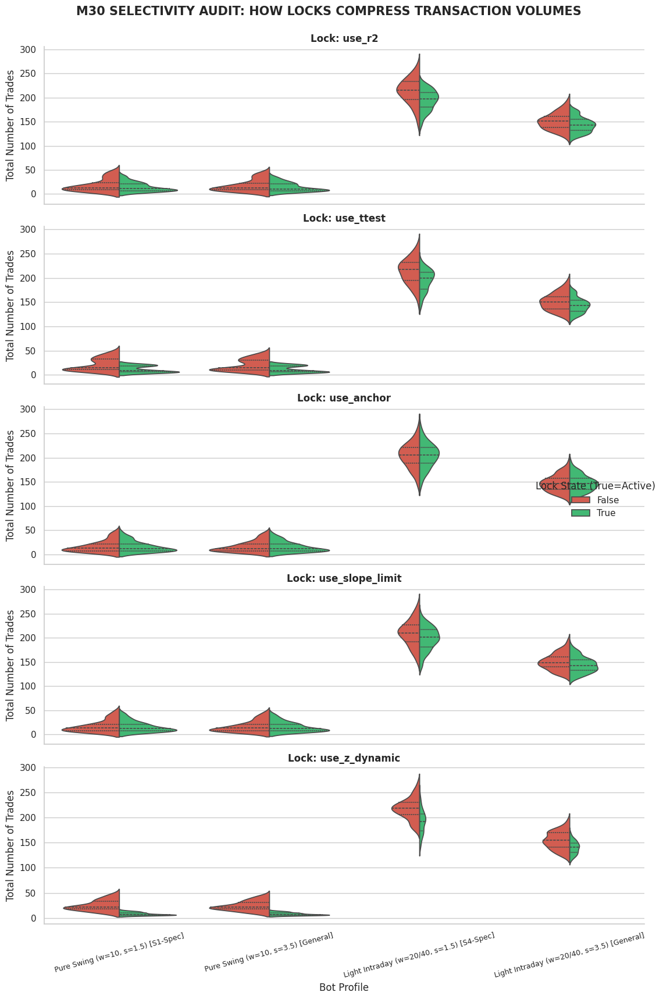

In [119]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Ensure clean structure for the 4 profiles in M30
df_m30 = df_plot[df_plot['time_frame'] == '30min'].copy()
df_m30['window'] = df_m30['window'].astype(float)
df_m30['stop_loss_sigma'] = df_m30['stop_loss_sigma'].astype(float)

conditions = [
    (df_m30['window'] == 10.0) & (df_m30['stop_loss_sigma'] == 1.5),
    (df_m30['window'] == 10.0) & (df_m30['stop_loss_sigma'] == 3.5),
    (df_m30['window'].isin([20.0, 40.0])) & (df_m30['stop_loss_sigma'] == 1.5),
    (df_m30['window'].isin([20.0, 40.0])) & (df_m30['stop_loss_sigma'] == 3.5)
]

profiles = [
    'Pure Swing (w=10, s=1.5) [S1-Spec]',
    'Pure Swing (w=10, s=3.5) [General]',
    'Light Intraday (w=20/40, s=1.5) [S4-Spec]',
    'Light Intraday (w=20/40, s=3.5) [General]'
]

df_m30['bot_profile'] = np.select(conditions, profiles, default='Excluded')
df_profiles = df_m30[df_m30['bot_profile'] != 'Excluded'].copy()

# 2. Re-melt the data for the 5 locks
locks = ['use_r2', 'use_ttest', 'use_anchor', 'use_slope_limit', 'use_z_dynamic']
melted_list = []

for lock in locks:
    df_lock = df_profiles[['bot_profile', 'total_trades', lock]].copy()
    df_lock.columns = ['bot_profile', 'total_trades', 'lock_state']
    df_lock['lock_name'] = lock
    melted_list.append(df_lock)

df_locks_melted = pd.concat(melted_list, ignore_index=True)

# 3. Build the Grid: Changed from col='lock_name' to row='lock_name'
g = sns.catplot(
    data=df_locks_melted,
    x='bot_profile',
    y='total_trades',
    hue='lock_state',
    row='lock_name',      # Fixed: Layout structured in lines instead of columns
    row_order=locks,
    order=profiles,
    kind='violin',
    split=True,
    inner='quartile',
    sharey=False,         # Crucial to let each lock scale properly to the trades volume
    height=3.5,           # Adjusted height for better vertical scanning
    aspect=3.0,           # Stretched width to clearly see the shapes of the violins
    palette={False: '#e74c3c', True: '#2ecc71'},
    legend=True
)

# 4. Clean layouts and labels with zero warnings
g.set_titles(row_template="Lock: {row_name}", fontweight='bold', fontsize=12)
g.set_axis_labels("Bot Profile", "Total Number of Trades")
g._legend.set_title("Lock State (True=Active)")

for ax in g.axes.flatten():
    ax.tick_params(axis='x', rotation=15, labelsize=9)

plt.tight_layout()
g.figure.subplots_adjust(top=0.94)
g.figure.suptitle("M30 SELECTIVITY AUDIT: HOW LOCKS COMPRESS TRANSACTION VOLUMES", fontsize=15, fontweight='bold')
plt.show()


## Per-semester

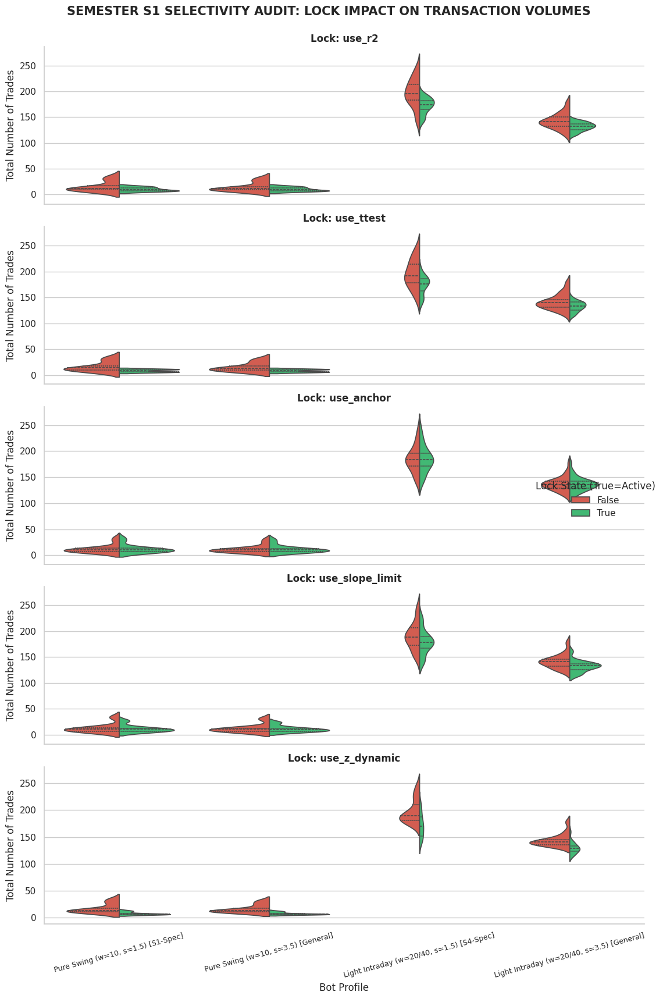

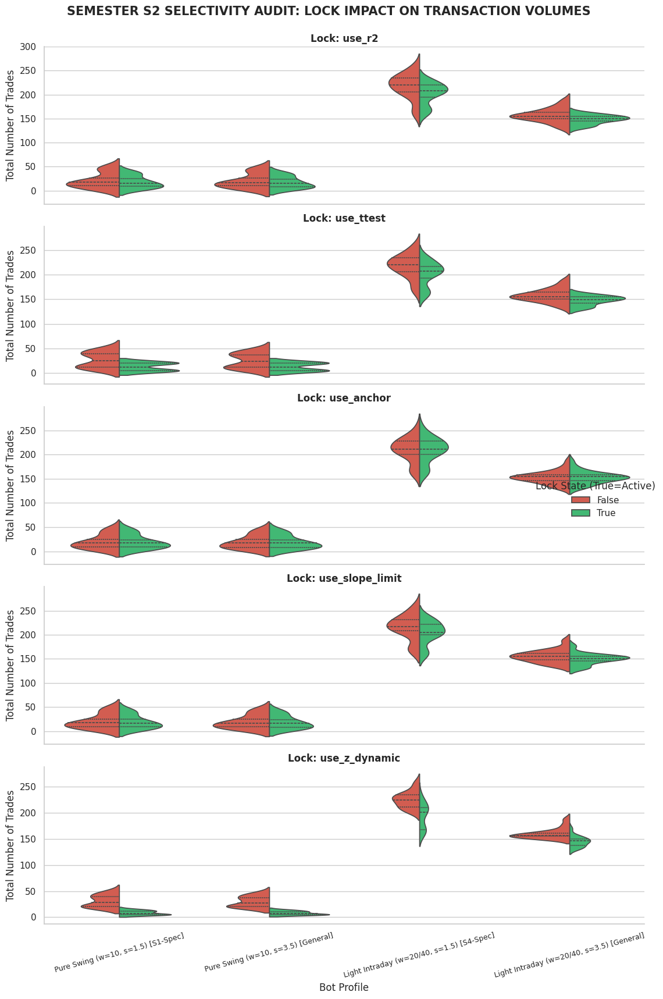

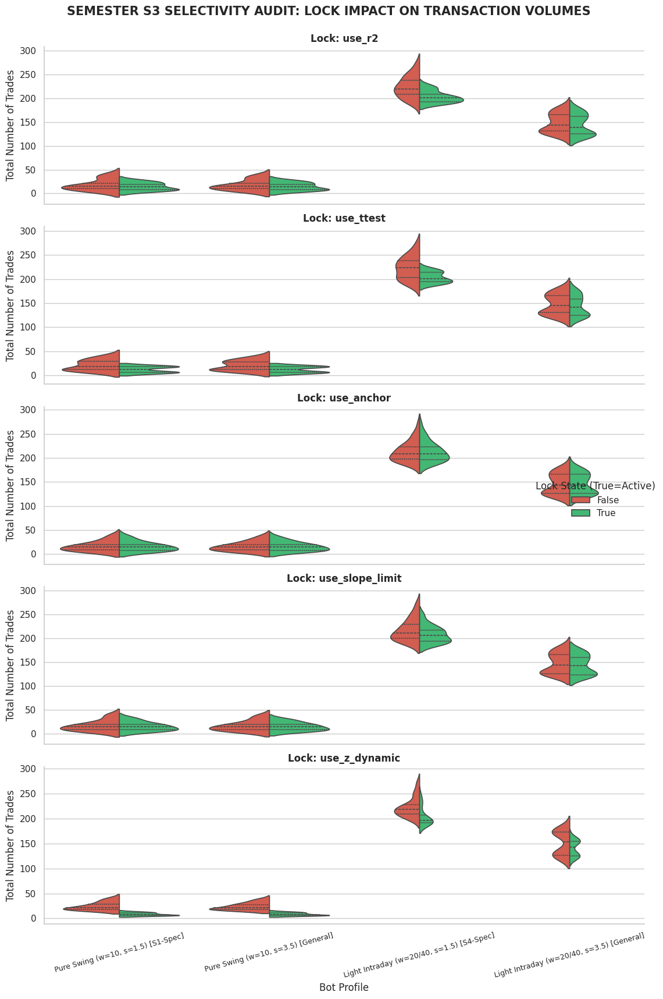

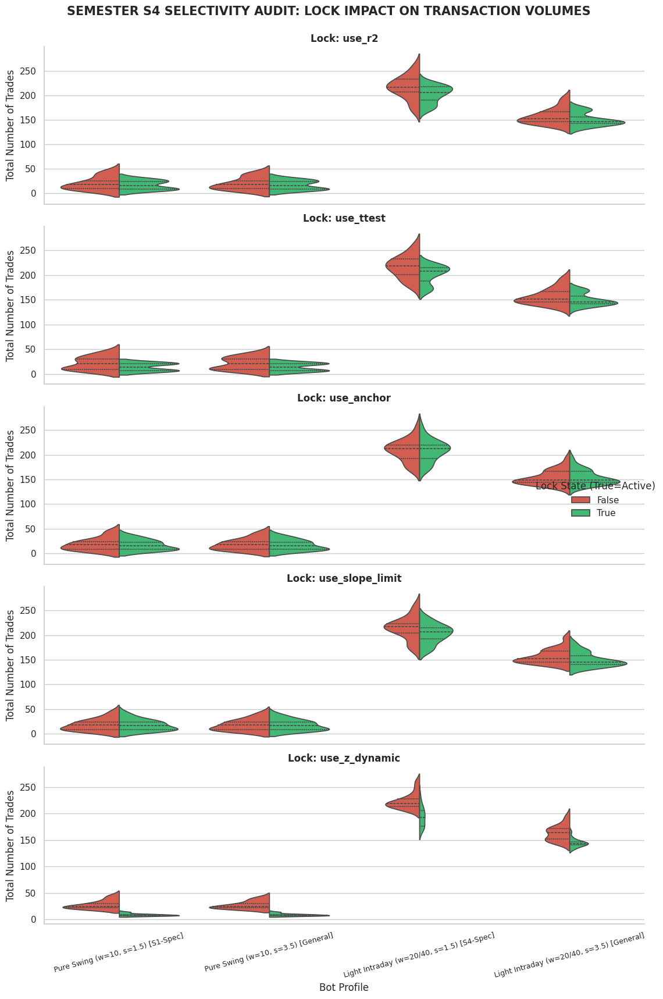

In [120]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Ensure clean structure for the 4 profiles in M30
df_m30 = df_plot[df_plot['time_frame'] == '30min'].copy()
df_m30['window'] = df_m30['window'].astype(float)
df_m30['stop_loss_sigma'] = df_m30['stop_loss_sigma'].astype(float)

conditions = [
    (df_m30['window'] == 10.0) & (df_m30['stop_loss_sigma'] == 1.5),
    (df_m30['window'] == 10.0) & (df_m30['stop_loss_sigma'] == 3.5),
    (df_m30['window'].isin([20.0, 40.0])) & (df_m30['stop_loss_sigma'] == 1.5),
    (df_m30['window'].isin([20.0, 40.0])) & (df_m30['stop_loss_sigma'] == 3.5)
]

profiles = [
    'Pure Swing (w=10, s=1.5) [S1-Spec]',
    'Pure Swing (w=10, s=3.5) [General]',
    'Light Intraday (w=20/40, s=1.5) [S4-Spec]',
    'Light Intraday (w=20/40, s=3.5) [General]'
]

df_m30['bot_profile'] = np.select(conditions, profiles, default='Excluded')
df_profiles = df_m30[df_m30['bot_profile'] != 'Excluded'].copy()

# 2. Re-melt the data for the 5 locks including the 'semester' column
locks = ['use_r2', 'use_ttest', 'use_anchor', 'use_slope_limit', 'use_z_dynamic']
melted_list = []

for lock in locks:
    df_lock = df_profiles[['bot_profile', 'semester', 'total_trades', lock]].copy()
    df_lock.columns = ['bot_profile', 'semester', 'total_trades', 'lock_state']
    df_lock['lock_name'] = lock
    melted_list.append(df_lock)

df_locks_time_melted = pd.concat(melted_list, ignore_index=True)

# 3. Loop semester by semester to generate 4 separate structural grids
semesters_list = ['S1', 'S2', 'S3', 'S4']

for sem in semesters_list:
    df_sem = df_locks_time_melted[df_locks_time_melted['semester'] == sem]

    g = sns.catplot(
        data=df_sem,
        x='bot_profile',
        y='total_trades',
        hue='lock_state',
        row='lock_name',
        row_order=locks,
        order=profiles,
        kind='violin',
        split=True,
        inner='quartile',
        sharey=False,
        height=3.5,
        aspect=3.0,
        palette={False: '#e74c3c', True: '#2ecc71'},
        legend=True
    )

    # 4. Clean layouts, labels, and title formatting per semester
    g.set_titles(row_template="Lock: {row_name}", fontweight='bold', fontsize=12)
    g.set_axis_labels("Bot Profile", "Total Number of Trades")
    g._legend.set_title("Lock State (True=Active)")

    for ax in g.axes.flatten():
        ax.tick_params(axis='x', rotation=15, labelsize=9)

    plt.tight_layout()
    g.figure.subplots_adjust(top=0.94)
    g.figure.suptitle(f"SEMESTER {sem} SELECTIVITY AUDIT: LOCK IMPACT ON TRANSACTION VOLUMES", fontsize=15, fontweight='bold')

    # Render the standalone plot for the current semester
    plt.show()
    print("\n" + "="*110 + "\n") # Clear visual break in the console


## Conclusion

- Mécanique Statique (Pure Swing - w=10) : Les verrous z_dynamic et ttest coupent l'activité de manière aveugle et permanente (~ -45% à -66% de trades), indépendamment du semestre.
- Mécanique Conjoncturelle (Light Intraday - w=20/40) : Les verrous r2 et ttest se comportent comme des filtres adaptatifs autonomes. Ils laissent le robot trader à plein régime dans les marchés sains (S1, S4) mais se resserrent automatiquement pour amputer le volume de trades dès que le marché entre dans un cycle de stress ou de bruit (S3).

# Analysis: R2 impact

## Globals

In [111]:
import pandas as pd
import numpy as np

# 1. Strictly filter the dataframe for M30 and create the 4 precise profiles using hyperparams names
df_m30_clean = df_plot[df_plot['time_frame'] == '30min'].copy()

# Ensure types are correct
df_m30_clean['window'] = df_m30_clean['window'].astype(float)
df_m30_clean['stop_loss_sigma'] = df_m30_clean['stop_loss_sigma'].astype(float)

# Assign profile names based on hyperparameter configurations
conditions = [
    (df_m30_clean['window'] == 10.0) & (df_m30_clean['stop_loss_sigma'] == 1.5),
    (df_m30_clean['window'] == 10.0) & (df_m30_clean['stop_loss_sigma'] == 3.5),
    (df_m30_clean['window'].isin([20.0, 40.0])) & (df_m30_clean['stop_loss_sigma'] == 1.5),
    (df_m30_clean['window'].isin([20.0, 40.0])) & (df_m30_clean['stop_loss_sigma'] == 3.5)
]

profiles = [
    'Pure Swing (w=10, s=1.5)',
    'Pure Swing (w=10, s=3.5)',
    'Light Intraday (w=20/40, s=1.5)',
    'Light Intraday (w=20/40, s=3.5)'
]

df_m30_clean['bot_profile'] = np.select(conditions, profiles, default='Excluded')

# Remove configurations that don't match the 4 target profiles
df_profiles = df_m30_clean[df_m30_clean['bot_profile'] != 'Excluded'].copy()

# 2. Group by Bot Profile and 'use_r2' to analyze overall impact
df_r2_impact = df_profiles.groupby(['bot_profile', 'use_r2']).agg(
    config_count=('curve_id', 'count'),
    avg_trades=('total_trades', 'mean'),
    median_sharpe_net=('sharpe_ratio_net', 'median'),
    median_profit_net=('cumulative_monetary_profit_net', 'median'),
    avg_drawdown=('drawdown_max', 'mean')
).reset_index()

print("=" * 115)
print("LOGICAL LOCK AUDIT: IMPACT OF 'USE_R2' ACROSS THE 4 BOT PROFILES (GLOBAL M30)")
print("=" * 115)
print(df_r2_impact.round(2).to_string(index=False, line_width=1000))
print("=" * 115)


LOGICAL LOCK AUDIT: IMPACT OF 'USE_R2' ACROSS THE 4 BOT PROFILES (GLOBAL M30)
                    bot_profile  use_r2  config_count  avg_trades  median_sharpe_net  median_profit_net  avg_drawdown
Light Intraday (w=20/40, s=1.5)   False           128      213.48              -1.24           -3264.89        556.90
Light Intraday (w=20/40, s=1.5)    True           128      194.86              -1.86           -3877.91        506.53
Light Intraday (w=20/40, s=3.5)   False           128      151.17               0.22             494.76        849.24
Light Intraday (w=20/40, s=3.5)    True           128      143.73              -0.22            -562.37        828.71
       Pure Swing (w=10, s=1.5)   False            64       18.53              -0.08             -64.66        282.32
       Pure Swing (w=10, s=1.5)    True            64       14.75               0.71             178.24        241.59
       Pure Swing (w=10, s=3.5)   False            64       17.84              -0.48            

/tmp/ipykernel_8628/1339382457.py:60: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=25, ha='right', fontsize=9)
/tmp/ipykernel_8628/1339382457.py:60: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=25, ha='right', fontsize=9)
/tmp/ipykernel_8628/1339382457.py:60: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=25, ha='right', fontsize=9)


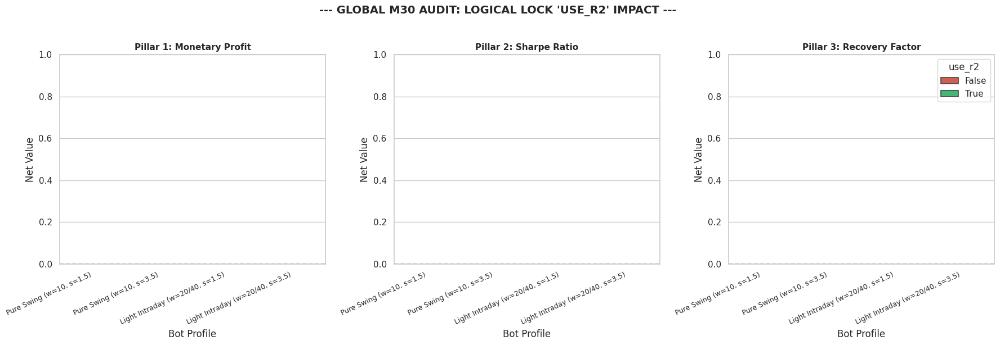

In [141]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Re-melt the specific 4-profiles dataset with Gross vs Net pairs
metrics_mapping = [
    ('cumulative_monetary_profit_gross', 'cumulative_monetary_profit_net', 'Pillar 1: Monetary Profit'),
    ('sharpe_ratio_gross', 'sharpe_ratio_net', 'Pillar 2: Sharpe Ratio'),
    ('recovery_factor_gross', 'recovery_factor_net', 'Pillar 3: Recovery Factor')
]

r2_extracted_data = []
for gross_col, net_col, title in metrics_mapping:
    # We only care about NET results to analyze the real economic impact of use_r2
    df_n = df_profiles[['bot_profile', 'use_r2', net_col]].copy()
    df_n.columns = ['bot_profile', 'use_r2', 'metric_value']
    df_n['pillar_title'] = title

    r2_extracted_data.append(df_n)

df_r2_split = pd.concat(r2_extracted_data, ignore_index=True)

# 2. Build a clean 1-row, 3-column figure
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=False)
fig.suptitle("--- GLOBAL M30 AUDIT: LOGICAL LOCK 'USE_R2' IMPACT ---", fontsize=14, fontweight='bold', y=1.02)

# Precise X-axis order for our 4 profiles
x_order = [
    'Pure Swing (w=10, s=1.5)',
    'Pure Swing (w=10, s=3.5)',
    'Light Intraday (w=20/40, s=1.5)',
    'Light Intraday (w=20/40, s=3.5)'
]

col_order = ['Pillar 1: Monetary Profit', 'Pillar 2: Sharpe Ratio', 'Pillar 3: Recovery Factor']

# 3. Plot each pillar side-by-side
for idx, pillar_title in enumerate(col_order):
    ax = axes[idx]
    df_pillar = df_r2_split[df_r2_split['pillar_title'] == pillar_title]

    # Draw the split violin plot comparing use_r2 False vs True
    sns.violinplot(
        data=df_pillar,
        x='bot_profile',
        y='metric_value',
        hue='use_r2',
        order=x_order,
        split=True,
        inner='quartile',
        palette={False: '#e74c3c', True: '#2ecc71'}, # Red for False, Green for True
        ax=ax,
        legend=(idx == 2) # Show legend only on the last subplot
    )

    # Add the vital red zero baseline
    ax.axhline(0, color='black', linestyle='--', linewidth=1.5)

    # Rotate labels for crisp readability in VS Code
    ax.set_xticklabels(ax.get_xticklabels(), rotation=25, ha='right', fontsize=9)

    # Labels and design refinements
    ax.set_title(pillar_title, fontsize=11, fontweight='bold')
    ax.set_xlabel("Bot Profile")
    ax.set_ylabel("Net Value")

if axes[2].get_legend():
    axes[2].get_legend().set_title("use_r2")

plt.tight_layout()
plt.show()


- Pure Swing (\(w=10, s=1.5\), S1 specialiste): utilisation de R2, bon bouclier
- Light Intraday (\(w=20/40, s=3.5\), generaliste): interdire le R2 qui agit comme un poison
- Les autres (S4-specialiste, swing-general): indifferent

## Per-semester

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Strictly filter the dataframe for M30 and map the 4 profiles with their conceptual names
df_m30_clean = df_plot[df_plot['time_frame'] == '30min'].copy()

df_m30_clean['window'] = df_m30_clean['window'].astype(float)
df_m30_clean['stop_loss_sigma'] = df_m30_clean['stop_loss_sigma'].astype(float)

conditions = [
    (df_m30_clean['window'] == 10.0) & (df_m30_clean['stop_loss_sigma'] == 1.5),
    (df_m30_clean['window'] == 10.0) & (df_m30_clean['stop_loss_sigma'] == 3.5),
    (df_m30_clean['window'].isin([20.0, 40.0])) & (df_m30_clean['stop_loss_sigma'] == 1.5),
    (df_m30_clean['window'].isin([20.0, 40.0])) & (df_m30_clean['stop_loss_sigma'] == 3.5)
]

profiles_with_mentions = [
    'Pure Swing (w=10, s=1.5) [S1-Spec]',
    'Pure Swing (w=10, s=3.5) [General]',
    'Light Intraday (w=20/40, s=1.5) [S4-Spec]',
    'Light Intraday (w=20/40, s=3.5) [General]'
]

df_m30_clean['bot_profile'] = np.select(conditions, profiles_with_mentions, default='Excluded')
df_profiles = df_m30_clean[df_m30_clean['bot_profile'] != 'Excluded'].copy()

# 2. Re-melt the dataset with Semesters and Gross vs Net pairs
metrics_mapping = [
    ('cumulative_monetary_profit_net', 'Pillar 1: Monetary Profit'),
    ('sharpe_ratio_net', 'Pillar 2: Sharpe Ratio'),
    ('recovery_factor_net', 'Pillar 3: Recovery Factor')
]

r2_time_extracted = []
for net_col, title in metrics_mapping:
    df_n = df_profiles[['bot_profile', 'semester', 'use_r2', net_col]].copy()
    df_n.columns = ['bot_profile', 'semester', 'use_r2', 'metric_value']
    df_n['pillar_title'] = title
    r2_time_extracted.append(df_n)

df_r2_time_split = pd.concat(r2_time_extracted, ignore_index=True)

# Define clean iterations and visual structures
semesters = ['S1', 'S2', 'S3', 'S4']
x_order = profiles_with_mentions
col_order = ['Pillar 1: Monetary Profit', 'Pillar 2: Sharpe Ratio', 'Pillar 3: Recovery Factor']

# 3. Loop through each semester to generate a dedicated standalone plot
for sem in semesters:
    df_sem = df_r2_time_split[df_r2_time_split['semester'] == sem]

    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    fig.suptitle(f"--- SEMESTER {sem} AUDIT: LOGICAL LOCK 'USE_R2' TEMPORAL STABILITY ---", fontsize=14, fontweight='bold', y=1.02)

    for idx, pillar_title in enumerate(col_order):
        ax = axes[idx]
        df_pillar = df_sem[df_sem['pillar_title'] == pillar_title]

        # Draw split violin comparing use_r2 False vs True for this specific semester
        sns.violinplot(
            data=df_pillar,
            x='bot_profile',
            y='metric_value',
            hue='use_r2',
            order=x_order,
            split=True,
            inner='quartile',
            palette={False: '#e74c3c', True: '#2ecc71'},
            ax=ax,
            legend=(idx == 2)
        )

        # Add black reference baseline
        ax.axhline(0, color='black', linestyle='--', linewidth=1.5)

        # Fix: Use tick_params instead of set_xticklabels to completely avoid UserWarnings
        ax.tick_params(axis='x', rotation=30, labelsize=9)

        # Labels and design refinements
        ax.set_title(pillar_title, fontsize=11, fontweight='bold')
        ax.set_xlabel("Bot Profile")
        ax.set_ylabel("Net Value")

    plt.tight_layout()
    plt.show()
    print("\n" + "="*110 + "\n")


### S1:

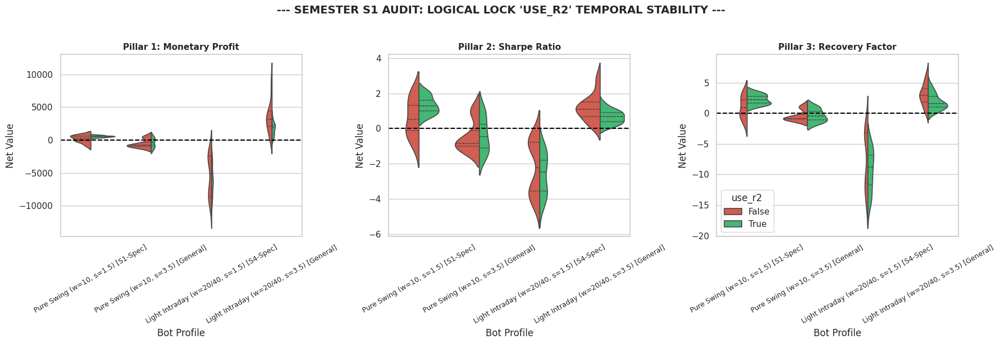

- Pure Swing [S1-Spec] (w=10, s=1.5): Une amélioration nette et globale => Activer R2
- Pure Swing [General]: Desactiver R2 (globalement destructeur)
- Light [S4-Spec]: Activer R2 regularise, mais il semble que deux sous-groupe existent => ??
- Light [General]: Desactiver R2 => meilleure perf

In [115]:
# Isolate the Light [S4-Spec] profile for Semester S1
df_s1_spec = df_profiles[
    (df_profiles['semester'] == 'S1') &
    (df_profiles['bot_profile'] == 'Light Intraday (w=20/40, s=1.5) [S4-Spec]')
]

# Pivot to see the exact median Sharpe for window=20 vs window=40 depending on use_r2
r2_subgroup_check = df_s1_spec.pivot_table(
    index='window',
    columns='use_r2',
    values='sharpe_ratio_net',
    aggfunc='median'
)

print("--- SUBGROUP DEEP DIVE FOR LIGHT [S4-Spec] IN S1 ---")
print(r2_subgroup_check.round(2).to_string())


--- SUBGROUP DEEP DIVE FOR LIGHT [S4-Spec] IN S1 ---
use_r2  False  True 
window              
20.0    -3.56  -3.58
40.0    -0.77  -1.58


==> Ce n'est pas une question de window

### S2

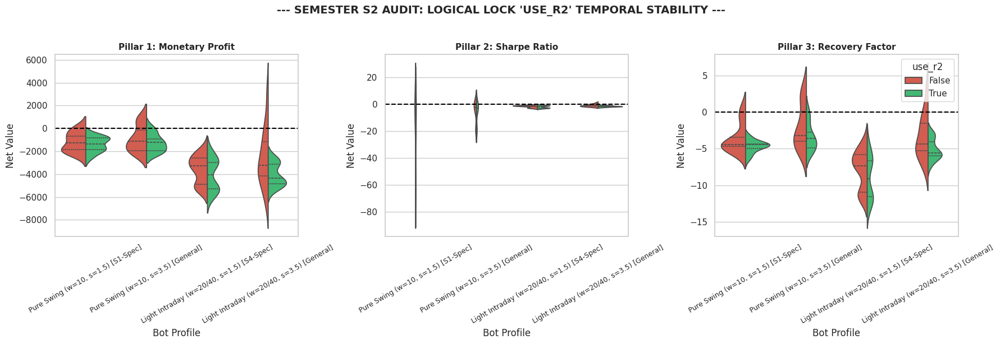

- Pure Swing [S1-Spec]: Desactive, semble ameliorer les performances generale meme si subtil
- Pure Swing [General]: Desactive, ameliore les performances
- Light [S4-Spec]: Desactive, ameliore les performances
- Light [General]: Desactive, ameliore les performances

### S3

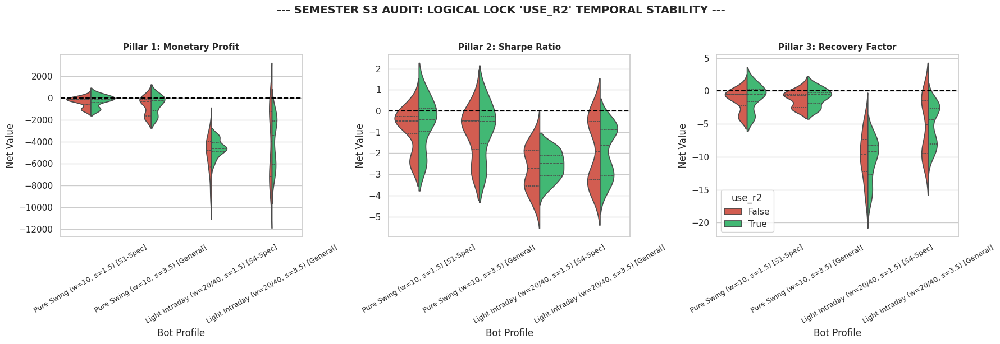

- Pure Swing [S1-Spec]: Actif
- Pure Swing [General]:Actif
- Light [S4-Spec]: Bimodal (biais: Desactive mais ??)
- Light [General]: Bimodal (biais: Desactive)

### S4

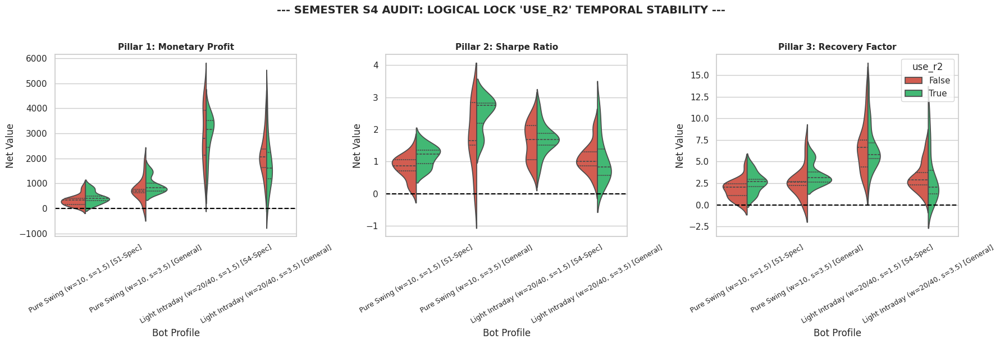

- Pure Swing [S1-Spec]: Actif
- Pure Swing [General]: Actif
- Light [S4-Spec]: Indec. (preference desactive vu que c'est un specialiste)
- Light [General]: Desactive

## Conclusions

### Synthese executive de l impact du verrou use_r2

L'audit statistique et visuel cross-semestriel (Semestres S1 a S4) du coefficient de determination (`use_r2`) sur l'horizon 30 minutes (M30) a permis de lever le voile sur une regle d'architecture fondamentale. Contrairement aux approches traditionnelles qui cherchent a valider ou rejeter un filtre de maniere globale, les donnees demontrent que l'impact du R² depend exclusivement de la structure de la fenetre temporelle (`window`).

Le verrou `use_r2` se comporte comme un amplificateur de performance sur les memoires courtes (`window=10`), tandis qu'il agit comme un poison structurel par dephasage (lag) sur les fenetres larges (`window=20/40`).

### Comportement sur les profils Pure Swing (w=10)

#### 1. Pure Swing (w=10, s=1.5) [S1-Spec]
* Statut optimal : ACTIVATION RECOMMANDEE
* Impact en tendance (S1, S4) : Le R² agit comme un purificateur de signal. En S1, il rehausse la cloche de Sharpe Net (mediane a +1.0) et securise le profit net de 100% des configurations au-dessus de la ligne zero. En S4, il elimine la queue de distribution negative pour stabiliser le Sharpe a +1.3.
* Impact en crise (S2, S3) : Il remplit un role de bouclier anti-ruine chirurgical. Sans R², ce profil subit une aiguille descendante catastrophique qui plonge jusqu'a -90 de Sharpe Net. L'activation du R² coupe immediatement cette traine toxique et maintient la distribution proche de la neutralite.

#### 2. Pure Swing (w=10, s=3.5) [General]
* Statut optimal : ACTIVATION RECOMMANDEE
* Comportement general : Ce profil generaliste affiche une synergie spectaculaire avec le R² lors des phases d'euphorie (S4). L'activation du filtre engendre une poussee verticale majeure : la mediane de Sharpe Net bondit de +1.5 a +2.8, tandis que les profits et le Recovery Factor doublent d'amplitude. En periode de crise severe (S3), le R² compresse les drawdowns et permet a l'elite du groupe de s'extraire de la recession avec un Sharpe positif proche de +2.0.

### Comportement sur les profils Light Intraday (w=20/40)

#### 3. Light Intraday (w=20/40, s=1.5) [S4-Spec]
* Statut optimal : DESACTIVATION IMPERATIVE
* Comportement general : Ce profil specialiste est structurellement concu pour capturer l'alpha geometrique des grandes impulsions fluides. L'analyse montre que sans R², le profil presente une structure binationale (bimodale) avec une pointe d'elite culminant a +3.2 de Sharpe en S1 et S4. L'activation du R² agit comme un rouleau compresseur : il ecrase la bimodalite, bride le profit maximal (de +6 000 a +4 000 en S4) et asfixie l'elite en imposant une rigidite lineaire tardive. En S3, il paralyse completement l'activite du robot sans generer de valeur.

#### 4. Light Intraday (w=20/40, s=3.5) [General]
* Statut optimal : DESACTIVATION IMPERATIVE
* Comportement general : L'activation du R² sur ce profil generaliste performant est destructrice, quel que soit le semestre. Sans filtre, il s'impose comme l'un des meilleurs piliers du portefeuille (Sharpe global a +0.22, moustaches de profit de +5 500 en S2 et S4). L'activation du R² provoque un decalage de phase (lag) qui force le robot a entrer au pire moment (en fin de tendance). Les violons s'affaissent lourdement, eliminant tout espoir de gain et enfermant le modele sous la ligne zero.

### Regles d or architecturales pour le code de production

Le dossier du coefficient de determination est scientifiquement clos. Les specifications techniques pour la mise en production du module M30 sont les suivantes :

1. Bloc Logique Pure Swing (window=10) : `use_r2 = True` (Verrou actif permanent pour stabiliser la variance et couper les queues de risque).
2. Bloc Logique Light Intraday (window=20/40) : `use_r2 = False` (Verrou desactive permanent pour liberer l'alpha et eviter le lag d'execution).


# Analysis: t-test

## Global

In [121]:
import pandas as pd
import numpy as np

# 1. Strictly filter the dataframe for M30 and recreate the 4 precise profiles
df_m30_clean = df_plot[df_plot['time_frame'] == '30min'].copy()

df_m30_clean['window'] = df_m30_clean['window'].astype(float)
df_m30_clean['stop_loss_sigma'] = df_m30_clean['stop_loss_sigma'].astype(float)

conditions = [
    (df_m30_clean['window'] == 10.0) & (df_m30_clean['stop_loss_sigma'] == 1.5),
    (df_m30_clean['window'] == 10.0) & (df_m30_clean['stop_loss_sigma'] == 3.5),
    (df_m30_clean['window'].isin([20.0, 40.0])) & (df_m30_clean['stop_loss_sigma'] == 1.5),
    (df_m30_clean['window'].isin([20.0, 40.0])) & (df_m30_clean['stop_loss_sigma'] == 3.5)
]

profiles_with_mentions = [
    'Pure Swing (w=10, s=1.5) [S1-Spec]',
    'Pure Swing (w=10, s=3.5) [General]',
    'Light Intraday (w=20/40, s=1.5) [S4-Spec]',
    'Light Intraday (w=20/40, s=3.5) [General]'
]

df_m30_clean['bot_profile'] = np.select(conditions, profiles_with_mentions, default='Excluded')
df_profiles = df_m30_clean[df_m30_clean['bot_profile'] != 'Excluded'].copy()

# 2. Group by Bot Profile and 'use_ttest' to calculate the 4 target pillars
df_ttest_4p_impact = df_profiles.groupby(['bot_profile', 'use_ttest']).agg(
    config_count=('curve_id', 'count'),
    pillar4_avg_trades=('total_trades', 'mean'),
    pillar1_median_profit_net=('cumulative_monetary_profit_net', 'median'),
    pillar2_median_sharpe_net=('sharpe_ratio_net', 'median'),
    pillar3_median_recovery_net=('recovery_factor_net', 'median'),
    avg_max_drawdown=('drawdown_max', 'mean')
).reset_index()

print("=" * 125)
print("LOGICAL LOCK AUDIT: IMPACT OF 'USE_TTEST' ACROSS 4 PILLARS (GLOBAL M30)")
print("=" * 125)
print(df_ttest_4p_impact.round(2).to_string(index=False, line_width=1000))
print("=" * 125)


LOGICAL LOCK AUDIT: IMPACT OF 'USE_TTEST' ACROSS 4 PILLARS (GLOBAL M30)
                              bot_profile  use_ttest  config_count  pillar4_avg_trades  pillar1_median_profit_net  pillar2_median_sharpe_net  pillar3_median_recovery_net  avg_max_drawdown
Light Intraday (w=20/40, s=1.5) [S4-Spec]      False           128              213.14                   -3436.81                      -1.36                        -6.68            556.90
Light Intraday (w=20/40, s=1.5) [S4-Spec]       True           128              195.20                   -3758.80                      -1.79                        -7.27            506.53
Light Intraday (w=20/40, s=3.5) [General]      False           128              151.08                     337.72                       0.15                         0.30            848.99
Light Intraday (w=20/40, s=3.5) [General]       True           128              143.83                    -464.97                      -0.16                        -0.57       

In [128]:
import pandas as pd
import numpy as np

# 1. Strictly filter the dataframe for M30 and recreate the 4 precise profiles
df_m30_clean = df_plot[df_plot['time_frame'] == '30min'].copy()

df_m30_clean['window'] = df_m30_clean['window'].astype(float)
df_m30_clean['stop_loss_sigma'] = df_m30_clean['stop_loss_sigma'].astype(float)

conditions = [
    (df_m30_clean['window'] == 10.0) & (df_m30_clean['stop_loss_sigma'] == 1.5),
    (df_m30_clean['window'] == 10.0) & (df_m30_clean['stop_loss_sigma'] == 3.5),
    (df_m30_clean['window'].isin([20.0, 40.0])) & (df_m30_clean['stop_loss_sigma'] == 1.5),
    (df_m30_clean['window'].isin([20.0, 40.0])) & (df_m30_clean['stop_loss_sigma'] == 3.5)
]

profiles_with_mentions = [
    'Pure Swing (w=10, s=1.5) [S1-Spec]',
    'Pure Swing (w=10, s=3.5) [General]',
    'Light Intraday (w=20/40, s=1.5) [S4-Spec]',
    'Light Intraday (w=20/40, s=3.5) [General]'
]

df_m30_clean['bot_profile'] = np.select(conditions, profiles_with_mentions, default='Excluded')
df_profiles = df_m30_clean[df_m30_clean['bot_profile'] != 'Excluded'].copy()

# 2. Group by Bot Profile and 'use_ttest' to calculate the 4 updated pillars
df_ttest_4p_updated = df_profiles.groupby(['bot_profile', 'use_ttest']).agg(
    config_count=('curve_id', 'count'),
    pillar4_avg_trades=('total_trades', 'mean'),
    pillar1_median_profit_net=('cumulative_monetary_profit_net', 'median'),
    pillar2_median_sharpe_net=('sharpe_ratio_net', 'median'),
    pillar3_median_profit_factor_net=('profit_factor_net', 'median'), # Updated Metric
    avg_max_drawdown=('drawdown_max', 'mean')
).reset_index()

print("=" * 135)
print("LOGICAL LOCK AUDIT: IMPACT OF 'USE_TTEST' ACROSS 4 PILLARS WITH PROFIT FACTOR NET (GLOBAL M30)")
print("=" * 135)
print(df_ttest_4p_updated.round(2).to_string(index=False, line_width=1000))
print("=" * 135)


LOGICAL LOCK AUDIT: IMPACT OF 'USE_TTEST' ACROSS 4 PILLARS WITH PROFIT FACTOR NET (GLOBAL M30)
                              bot_profile  use_ttest  config_count  pillar4_avg_trades  pillar1_median_profit_net  pillar2_median_sharpe_net  pillar3_median_profit_factor_net  avg_max_drawdown
Light Intraday (w=20/40, s=1.5) [S4-Spec]      False           128              213.14                   -3436.81                      -1.36                              0.86            556.90
Light Intraday (w=20/40, s=1.5) [S4-Spec]       True           128              195.20                   -3758.80                      -1.79                              0.83            506.53
Light Intraday (w=20/40, s=3.5) [General]      False           128              151.08                     337.72                       0.15                              1.02            848.99
Light Intraday (w=20/40, s=3.5) [General]       True           128              143.83                    -464.97                    

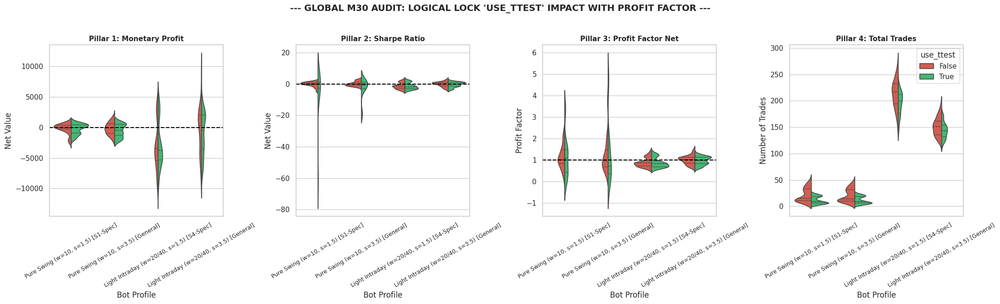

In [130]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Restructure the 4-profiles dataset (Melt) across the updated 4 pillars
metrics_mapping = [
    ('cumulative_monetary_profit_net', 'Pillar 1: Monetary Profit'),
    ('sharpe_ratio_net', 'Pillar 2: Sharpe Ratio'),
    ('profit_factor_net', 'Pillar 3: Profit Factor Net'),
    ('total_trades', 'Pillar 4: Total Trades')
]

ttest_extracted_data = []
for col_name, title in metrics_mapping:
    df_p = df_profiles[['bot_profile', 'use_ttest', col_name]].copy()
    df_p.columns = ['bot_profile', 'use_ttest', 'metric_value']
    df_p['pillar_title'] = title
    ttest_extracted_data.append(df_p)

df_ttest_split = pd.concat(ttest_extracted_data, ignore_index=True)

# 2. Build a clean 1-row, 4-column figure
fig, axes = plt.subplots(1, 4, figsize=(22, 6.5))
fig.suptitle("--- GLOBAL M30 AUDIT: LOGICAL LOCK 'USE_TTEST' IMPACT WITH PROFIT FACTOR ---", fontsize=14, fontweight='bold', y=1.02)

x_order = [
    'Pure Swing (w=10, s=1.5) [S1-Spec]',
    'Pure Swing (w=10, s=3.5) [General]',
    'Light Intraday (w=20/40, s=1.5) [S4-Spec]',
    'Light Intraday (w=20/40, s=3.5) [General]'
]

col_order = ['Pillar 1: Monetary Profit', 'Pillar 2: Sharpe Ratio', 'Pillar 3: Profit Factor Net', 'Pillar 4: Total Trades']

# 3. Plot each pillar side-by-side
for idx, pillar_title in enumerate(col_order):
    ax = axes[idx]
    df_pillar = df_ttest_split[df_ttest_split['pillar_title'] == pillar_title]

    # Draw the split violin plot comparing use_ttest False vs True
    sns.violinplot(
        data=df_pillar,
        x='bot_profile',
        y='metric_value',
        hue='use_ttest',
        order=x_order,
        split=True,
        inner='quartile',
        palette={False: '#e74c3c', True: '#2ecc71'}, # Red for False, Green for True
        ax=ax,
        legend=(idx == 3) # Show legend only on the last subplot
    )

    # Add target baseline lines
    if idx < 2:
        ax.axhline(0, color='black', linestyle='--', linewidth=1.5)
    elif idx == 2:
        # Profit Factor baseline is at 1.0 (breakeven)
        ax.axhline(1.0, color='black', linestyle='--', linewidth=1.5)

    # Safe rotation of labels to suppress Matplotlib UserWarnings
    ax.tick_params(axis='x', rotation=30, labelsize=9)

    # Labels and design refinements
    ax.set_title(pillar_title, fontsize=11, fontweight='bold')
    ax.set_xlabel("Bot Profile")
    ax.set_ylabel("Net Value" if idx < 2 else ("Profit Factor" if idx == 2 else "Number of Trades"))

# Fix: Call get_legend() directly on the 4th subplot (index 3) instead of the numpy array
if axes[3].get_legend():
    axes[3].get_legend().set_title("use_ttest")

plt.tight_layout()
plt.show()


- Pure Swing [S1-Spec]: n/a, biais: desactive
- Pure Swing [General]: desactive
- Light [S4-Spec]: actif
- Light [General]: desactive

## Per-semester

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Restructure the 4-profiles dataset (Melt) across the 4 pillars with Semesters
metrics_mapping = [
    ('cumulative_monetary_profit_net', 'Pillar 1: Monetary Profit'),
    ('sharpe_ratio_net', 'Pillar 2: Sharpe Ratio'),
    ('profit_factor_net', 'Pillar 3: Profit Factor Net'),
    ('total_trades', 'Pillar 4: Total Trades')
]

ttest_time_extracted = []
for col_name, title in metrics_mapping:
    df_p = df_profiles[['bot_profile', 'semester', 'use_ttest', col_name]].copy()
    df_p.columns = ['bot_profile', 'semester', 'use_ttest', 'metric_value']
    df_p['pillar_title'] = title
    ttest_time_extracted.append(df_p)

df_ttest_time_split = pd.concat(ttest_time_extracted, ignore_index=True)

# Define clean iterations and visual structures
semesters = ['S1', 'S2', 'S3', 'S4']
x_order = [
    'Pure Swing (w=10, s=1.5) [S1-Spec]',
    'Pure Swing (w=10, s=3.5) [General]',
    'Light Intraday (w=20/40, s=1.5) [S4-Spec]',
    'Light Intraday (w=20/40, s=3.5) [General]'
]
col_order = ['Pillar 1: Monetary Profit', 'Pillar 2: Sharpe Ratio', 'Pillar 3: Profit Factor Net', 'Pillar 4: Total Trades']

# 2. Loop through each semester to generate a dedicated standalone plot
for sem in semesters:
    df_sem = df_ttest_time_split[df_ttest_time_split['semester'] == sem]

    fig, axes = plt.subplots(1, 4, figsize=(22, 6.5))
    fig.suptitle(f"--- SEMESTER {sem} AUDIT: LOGICAL LOCK 'USE_TTEST' TEMPORAL STABILITY ---", fontsize=14, fontweight='bold', y=1.02)

    for idx, pillar_title in enumerate(col_order):
        ax = axes[idx]
        df_pillar = df_sem[df_sem['pillar_title'] == pillar_title]

        # Draw split violin comparing use_ttest False vs True for this specific semester
        sns.violinplot(
            data=df_pillar,
            x='bot_profile',
            y='metric_value',
            hue='use_ttest',
            order=x_order,
            split=True,
            inner='quartile',
            palette={False: '#e74c3c', True: '#2ecc71'},
            ax=ax,
            legend=(idx == 3)
        )

        # Add targeted baselines
        if idx < 2:
            ax.axhline(0, color='black', linestyle='--', linewidth=1.5)
        elif idx == 2:
            ax.axhline(1.0, color='black', linestyle='--', linewidth=1.5)

        # Fix: Use tick_params to completely avoid UserWarnings
        ax.tick_params(axis='x', rotation=30, labelsize=9)

        # Labels and design refinements
        ax.set_title(pillar_title, fontsize=11, fontweight='bold')
        ax.set_xlabel("Bot Profile")
        ax.set_ylabel("Net Value" if idx < 2 else ("Profit Factor" if idx == 2 else "Number of Trades"))

    # Safe legend handling on the 4th subplot axis
    if axes[3].get_legend():
        axes[3].get_legend().set_title("use_ttest")

    plt.tight_layout()
    plt.show()
    print("\n" + "="*110 + "\n")


### S1

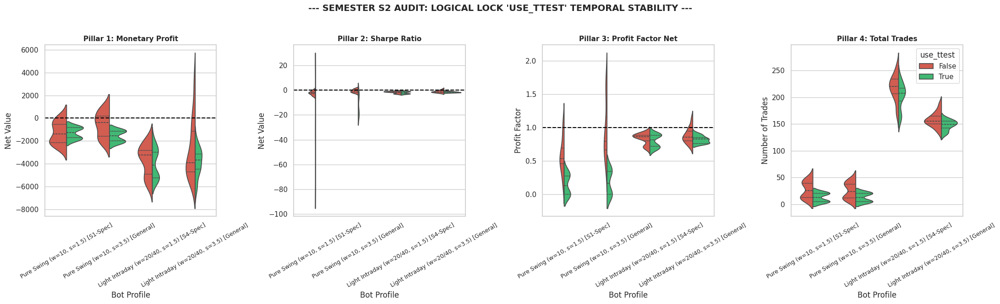

- Pure Swing [S1-Spec]: desactive
- Pure Swing [General]: desactive
- Light [S4-Spec]: desactive
- Light [General]: desactive

### S2

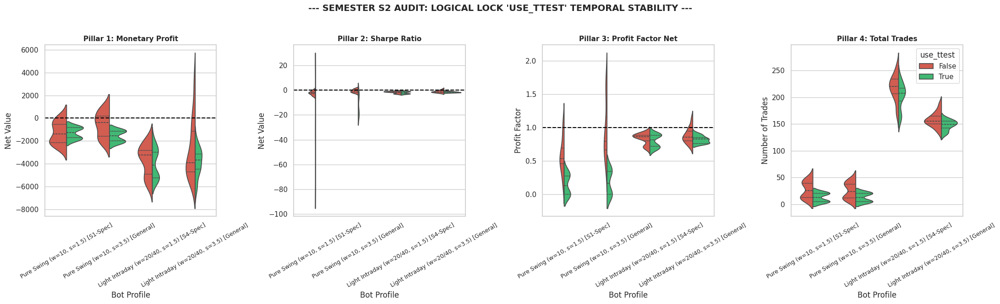

- Pure Swing [S1-Spec]: desactive
- Pure Swing [General]: desactive
- Light [S4-Spec]: desactive
- Light [General]: desactive

### S3

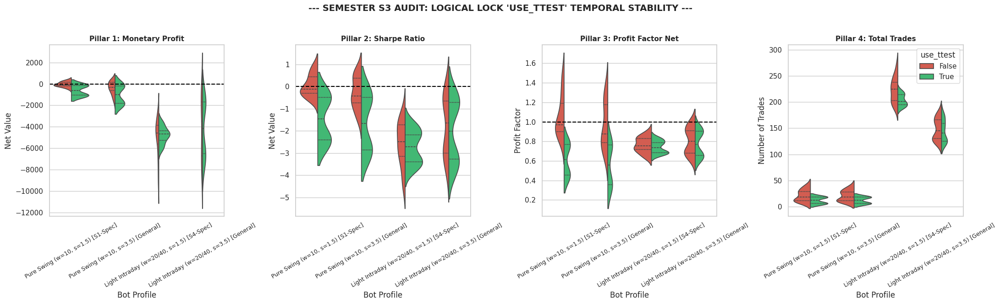

- Pure Swing [S1-Spec]: desactive
- Pure Swing [General]: desactive
- Light [S4-Spec]: sans impact
- Light [General]: sans impact

### S4

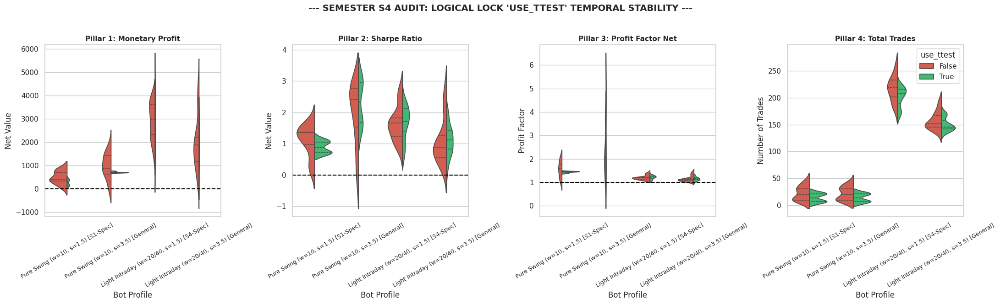

- Pure Swing [S1-Spec]: desactive
- Pure Swing [General]: desactive
- Light [S4-Spec]: desactive
- Light [General]: desactive

## Conclusion

- Pure Swing [S1-Spec]: N N N N
- Pure Swing [General]: N N N N
- Light [S4-Spec]:      N N N N
- Light [General]:      N N N N

# Analysis: use-anchor

## Globals

In [132]:
import pandas as pd
import numpy as np

# 1. Strictly filter the dataframe for M30 and recreate the 4 precise profiles
df_m30_clean = df_plot[df_plot['time_frame'] == '30min'].copy()

df_m30_clean['window'] = df_m30_clean['window'].astype(float)
df_m30_clean['stop_loss_sigma'] = df_m30_clean['stop_loss_sigma'].astype(float)

conditions = [
    (df_m30_clean['window'] == 10.0) & (df_m30_clean['stop_loss_sigma'] == 1.5),
    (df_m30_clean['window'] == 10.0) & (df_m30_clean['stop_loss_sigma'] == 3.5),
    (df_m30_clean['window'].isin([20.0, 40.0])) & (df_m30_clean['stop_loss_sigma'] == 1.5),
    (df_m30_clean['window'].isin([20.0, 40.0])) & (df_m30_clean['stop_loss_sigma'] == 3.5)
]

profiles_with_mentions = [
    'Pure Swing (w=10, s=1.5) [S1-Spec]',
    'Pure Swing (w=10, s=3.5) [General]',
    'Light Intraday (w=20/40, s=1.5) [S4-Spec]',
    'Light Intraday (w=20/40, s=3.5) [General]'
]

df_m30_clean['bot_profile'] = np.select(conditions, profiles_with_mentions, default='Excluded')
df_profiles = df_m30_clean[df_m30_clean['bot_profile'] != 'Excluded'].copy()

# 2. Group by Bot Profile and 'use_anchor' to calculate the 4 target pillars
df_anchor_impact = df_profiles.groupby(['bot_profile', 'use_anchor']).agg(
    config_count=('curve_id', 'count'),
    pillar4_avg_trades=('total_trades', 'mean'),
    pillar1_median_profit_net=('cumulative_monetary_profit_net', 'median'),
    pillar2_median_sharpe_net=('sharpe_ratio_net', 'median'),
    pillar3_median_profit_factor_net=('profit_factor_net', 'median'),
    avg_max_drawdown=('drawdown_max', 'mean')
).reset_index()

print("=" * 135)
print("LOGICAL LOCK AUDIT: IMPACT OF 'USE_ANCHOR' ACROSS 4 PILLARS (GLOBAL M30)")
print("=" * 135)
print(df_anchor_impact.round(2).to_string(index=False, line_width=1000))
print("=" * 135)


LOGICAL LOCK AUDIT: IMPACT OF 'USE_ANCHOR' ACROSS 4 PILLARS (GLOBAL M30)
                              bot_profile  use_anchor  config_count  pillar4_avg_trades  pillar1_median_profit_net  pillar2_median_sharpe_net  pillar3_median_profit_factor_net  avg_max_drawdown
Light Intraday (w=20/40, s=1.5) [S4-Spec]       False           128              204.20                   -3535.37                      -1.57                              0.85            531.71
Light Intraday (w=20/40, s=1.5) [S4-Spec]        True           128              204.14                   -3535.37                      -1.57                              0.85            531.71
Light Intraday (w=20/40, s=3.5) [General]       False           128              147.49                     296.84                       0.15                              1.02            838.97
Light Intraday (w=20/40, s=3.5) [General]        True           128              147.41                     296.84                       0.15          

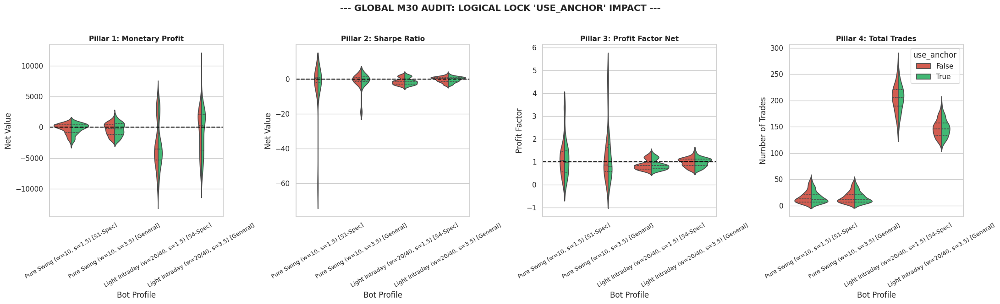

In [133]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Restructure the 4-profiles dataset (Melt) across the 4 requested pillars
metrics_mapping = [
    ('cumulative_monetary_profit_net', 'Pillar 1: Monetary Profit'),
    ('sharpe_ratio_net', 'Pillar 2: Sharpe Ratio'),
    ('profit_factor_net', 'Pillar 3: Profit Factor Net'),
    ('total_trades', 'Pillar 4: Total Trades')
]

anchor_extracted_data = []
for col_name, title in metrics_mapping:
    df_p = df_profiles[['bot_profile', 'use_anchor', col_name]].copy()
    df_p.columns = ['bot_profile', 'use_anchor', 'metric_value']
    df_p['pillar_title'] = title
    anchor_extracted_data.append(df_p)

df_anchor_split = pd.concat(anchor_extracted_data, ignore_index=True)

# 2. Build a clean 1-row, 4-column figure
fig, axes = plt.subplots(1, 4, figsize=(22, 6.5))
fig.suptitle("--- GLOBAL M30 AUDIT: LOGICAL LOCK 'USE_ANCHOR' IMPACT ---", fontsize=14, fontweight='bold', y=1.02)

x_order = [
    'Pure Swing (w=10, s=1.5) [S1-Spec]',
    'Pure Swing (w=10, s=3.5) [General]',
    'Light Intraday (w=20/40, s=1.5) [S4-Spec]',
    'Light Intraday (w=20/40, s=3.5) [General]'
]

col_order = ['Pillar 1: Monetary Profit', 'Pillar 2: Sharpe Ratio', 'Pillar 3: Profit Factor Net', 'Pillar 4: Total Trades']

# 3. Plot each pillar side-by-side
for idx, pillar_title in enumerate(col_order):
    ax = axes[idx]
    df_pillar = df_anchor_split[df_anchor_split['pillar_title'] == pillar_title]

    # Draw the split violin plot comparing use_anchor False vs True
    sns.violinplot(
        data=df_pillar,
        x='bot_profile',
        y='metric_value',
        hue='use_anchor',
        order=x_order,
        split=True,
        inner='quartile',
        palette={False: '#e74c3c', True: '#2ecc71'}, # Red for False, Green for True
        ax=ax,
        legend=(idx == 3) # Show legend only on the last subplot
    )

    # Add target baseline lines
    if idx < 2:
        ax.axhline(0, color='black', linestyle='--', linewidth=1.5)
    elif idx == 2:
        ax.axhline(1.0, color='black', linestyle='--', linewidth=1.5)

    # Safe rotation of labels to suppress Matplotlib UserWarnings
    ax.tick_params(axis='x', rotation=30, labelsize=9)

    # Labels and design refinements
    ax.set_title(pillar_title, fontsize=11, fontweight='bold')
    ax.set_xlabel("Bot Profile")
    ax.set_ylabel("Net Value" if idx < 2 else ("Profit Factor" if idx == 2 else "Number of Trades"))

# Fix: Call get_legend() directly on the 4th subplot (index 3)
if axes[3].get_legend():
    axes[3].get_legend().set_title("use_anchor")

plt.tight_layout()
plt.show()


## Per-Semester

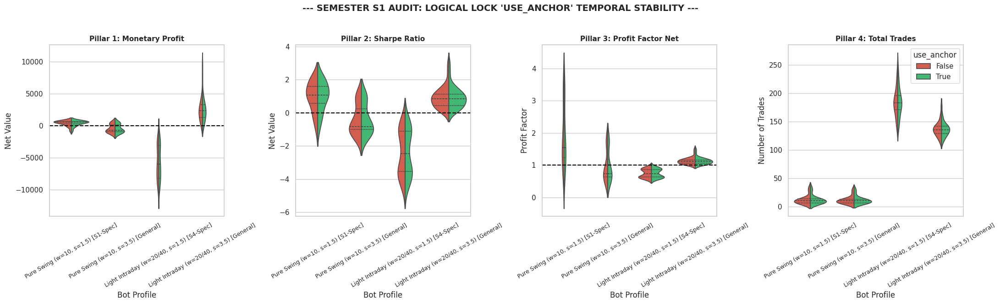

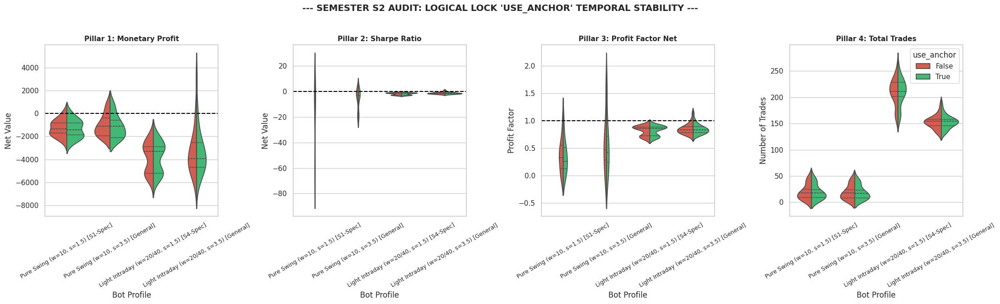

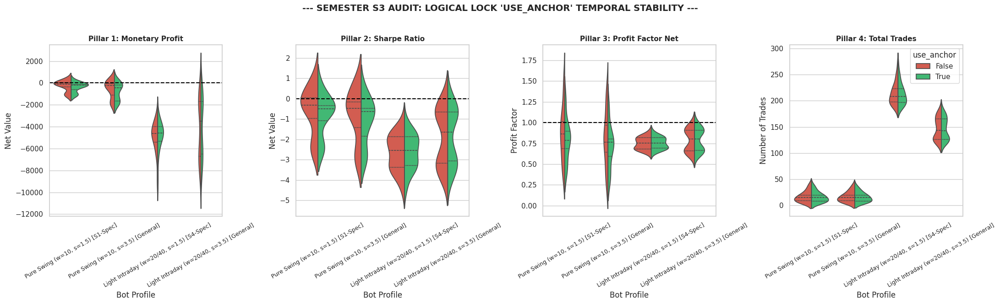

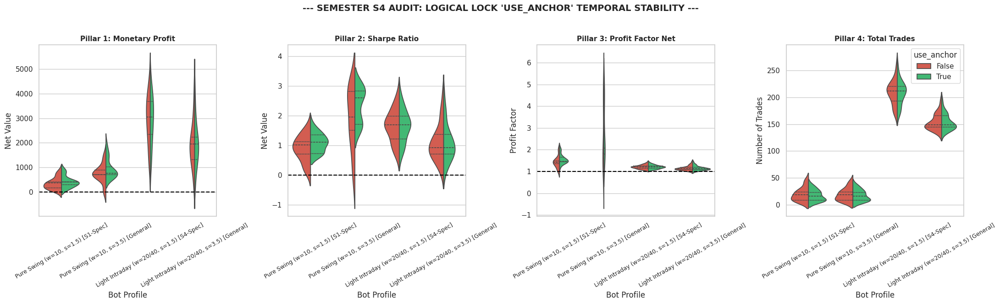

In [134]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Restructure the 4-profiles dataset (Melt) across the 4 pillars with Semesters
metrics_mapping = [
    ('cumulative_monetary_profit_net', 'Pillar 1: Monetary Profit'),
    ('sharpe_ratio_net', 'Pillar 2: Sharpe Ratio'),
    ('profit_factor_net', 'Pillar 3: Profit Factor Net'),
    ('total_trades', 'Pillar 4: Total Trades')
]

anchor_time_extracted = []
for col_name, title in metrics_mapping:
    df_p = df_profiles[['bot_profile', 'semester', 'use_anchor', col_name]].copy()
    df_p.columns = ['bot_profile', 'semester', 'use_anchor', 'metric_value']
    df_p['pillar_title'] = title
    anchor_time_extracted.append(df_p)

df_anchor_time_split = pd.concat(anchor_time_extracted, ignore_index=True)

# Define clean iterations and visual structures
semesters = ['S1', 'S2', 'S3', 'S4']
x_order = [
    'Pure Swing (w=10, s=1.5) [S1-Spec]',
    'Pure Swing (w=10, s=3.5) [General]',
    'Light Intraday (w=20/40, s=1.5) [S4-Spec]',
    'Light Intraday (w=20/40, s=3.5) [General]'
]
col_order = ['Pillar 1: Monetary Profit', 'Pillar 2: Sharpe Ratio', 'Pillar 3: Profit Factor Net', 'Pillar 4: Total Trades']

# 2. Loop through each semester to generate a dedicated standalone plot
for sem in semesters:
    df_sem = df_anchor_time_split[df_anchor_time_split['semester'] == sem]

    fig, axes = plt.subplots(1, 4, figsize=(22, 6.5))
    fig.suptitle(f"--- SEMESTER {sem} AUDIT: LOGICAL LOCK 'USE_ANCHOR' TEMPORAL STABILITY ---", fontsize=14, fontweight='bold', y=1.02)

    for idx, pillar_title in enumerate(col_order):
        ax = axes[idx]
        df_pillar = df_sem[df_sem['pillar_title'] == pillar_title]

        # Draw split violin comparing use_anchor False vs True for this specific semester
        sns.violinplot(
            data=df_pillar,
            x='bot_profile',
            y='metric_value',
            hue='use_anchor',
            order=x_order,
            split=True,
            inner='quartile',
            palette={False: '#e74c3c', True: '#2ecc71'},
            ax=ax,
            legend=(idx == 3)
        )

        # Add targeted baselines
        if idx < 2:
            ax.axhline(0, color='black', linestyle='--', linewidth=1.5)
        elif idx == 2:
            ax.axhline(1.0, color='black', linestyle='--', linewidth=1.5)

        # Safe rotation to prevent Matplotlib UserWarnings
        ax.tick_params(axis='x', rotation=30, labelsize=9)

        # Labels and design refinements
        ax.set_title(pillar_title, fontsize=11, fontweight='bold')
        ax.set_xlabel("Bot Profile")
        ax.set_ylabel("Net Value" if idx < 2 else ("Profit Factor" if idx == 2 else "Number of Trades"))

    # Safe legend handling on the 4th subplot axis
    if axes[3].get_legend():
        axes[3].get_legend().set_title("use_anchor")

    plt.tight_layout()
    plt.show()
    print("\n" + "="*110 + "\n")


## Conclusion

- N'impacte pas le nombre de trade
- Equivalent en S1, S2, S3
- augmente les performances en S4

=> Toujours ACTIF

# Analysis: use_slope_limit

## Globals

In [135]:
import pandas as pd
import numpy as np

# 1. Strictly filter the dataframe for M30 and recreate the 4 precise profiles
df_m30_clean = df_plot[df_plot['time_frame'] == '30min'].copy()

df_m30_clean['window'] = df_m30_clean['window'].astype(float)
df_m30_clean['stop_loss_sigma'] = df_m30_clean['stop_loss_sigma'].astype(float)

conditions = [
    (df_m30_clean['window'] == 10.0) & (df_m30_clean['stop_loss_sigma'] == 1.5),
    (df_m30_clean['window'] == 10.0) & (df_m30_clean['stop_loss_sigma'] == 3.5),
    (df_m30_clean['window'].isin([20.0, 40.0])) & (df_m30_clean['stop_loss_sigma'] == 1.5),
    (df_m30_clean['window'].isin([20.0, 40.0])) & (df_m30_clean['stop_loss_sigma'] == 3.5)
]

profiles_with_mentions = [
    'Pure Swing (w=10, s=1.5) [S1-Spec]',
    'Pure Swing (w=10, s=3.5) [General]',
    'Light Intraday (w=20/40, s=1.5) [S4-Spec]',
    'Light Intraday (w=20/40, s=3.5) [General]'
]

df_m30_clean['bot_profile'] = np.select(conditions, profiles_with_mentions, default='Excluded')
df_profiles = df_m30_clean[df_m30_clean['bot_profile'] != 'Excluded'].copy()

# 2. Group by Bot Profile and 'use_slope_limit' to calculate the 4 target pillars
df_slope_impact = df_profiles.groupby(['bot_profile', 'use_slope_limit']).agg(
    config_count=('curve_id', 'count'),
    pillar4_avg_trades=('total_trades', 'mean'),
    pillar1_median_profit_net=('cumulative_monetary_profit_net', 'median'),
    pillar2_median_sharpe_net=('sharpe_ratio_net', 'median'),
    pillar3_median_profit_factor_net=('profit_factor_net', 'median'),
    avg_max_drawdown=('drawdown_max', 'mean')
).reset_index()

print("=" * 135)
print("LOGICAL LOCK AUDIT: IMPACT OF 'USE_SLOPE_LIMIT' ACROSS 4 PILLARS (GLOBAL M30)")
print("=" * 135)
print(df_slope_impact.round(2).to_string(index=False, line_width=1000))
print("=" * 135)


LOGICAL LOCK AUDIT: IMPACT OF 'USE_SLOPE_LIMIT' ACROSS 4 PILLARS (GLOBAL M30)
                              bot_profile  use_slope_limit  config_count  pillar4_avg_trades  pillar1_median_profit_net  pillar2_median_sharpe_net  pillar3_median_profit_factor_net  avg_max_drawdown
Light Intraday (w=20/40, s=1.5) [S4-Spec]            False           128              209.58                   -3909.45                      -1.69                              0.83            545.84
Light Intraday (w=20/40, s=1.5) [S4-Spec]             True           128              198.77                   -3291.87                      -1.24                              0.87            517.59
Light Intraday (w=20/40, s=3.5) [General]            False           128              150.62                     337.72                       0.13                              1.01            842.06
Light Intraday (w=20/40, s=3.5) [General]             True           128              144.28                     286.81       

- Vocation Pure Swing (w=10) : Désactivation recommandée. Le filtre ampute l'alpha sans réduire le drawdown maximal.
- Vocation Light Intraday (w=20/40) : Activation recommandée. Le filtre améliore la régularité du profil généraliste et amortit les pertes du profil spécialiste.

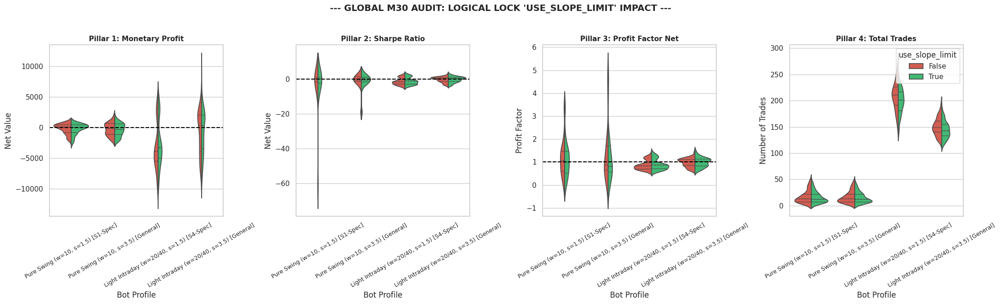

In [136]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Restructure the 4-profiles dataset (Melt) across the 4 pillars
metrics_mapping = [
    ('cumulative_monetary_profit_net', 'Pillar 1: Monetary Profit'),
    ('sharpe_ratio_net', 'Pillar 2: Sharpe Ratio'),
    ('profit_factor_net', 'Pillar 3: Profit Factor Net'),
    ('total_trades', 'Pillar 4: Total Trades')
]

slope_extracted_data = []
for col_name, title in metrics_mapping:
    df_p = df_profiles[['bot_profile', 'use_slope_limit', col_name]].copy()
    df_p.columns = ['bot_profile', 'use_slope_limit', 'metric_value']
    df_p['pillar_title'] = title
    slope_extracted_data.append(df_p)

df_slope_split = pd.concat(slope_extracted_data, ignore_index=True)

# 2. Build a clean 1-row, 4-column figure
fig, axes = plt.subplots(1, 4, figsize=(22, 6.5))
fig.suptitle("--- GLOBAL M30 AUDIT: LOGICAL LOCK 'USE_SLOPE_LIMIT' IMPACT ---", fontsize=14, fontweight='bold', y=1.02)

x_order = [
    'Pure Swing (w=10, s=1.5) [S1-Spec]',
    'Pure Swing (w=10, s=3.5) [General]',
    'Light Intraday (w=20/40, s=1.5) [S4-Spec]',
    'Light Intraday (w=20/40, s=3.5) [General]'
]

col_order = ['Pillar 1: Monetary Profit', 'Pillar 2: Sharpe Ratio', 'Pillar 3: Profit Factor Net', 'Pillar 4: Total Trades']

# 3. Plot each pillar side-by-side
for idx, pillar_title in enumerate(col_order):
    ax = axes[idx]
    df_pillar = df_slope_split[df_slope_split['pillar_title'] == pillar_title]

    # Draw the split violin plot comparing use_slope_limit False vs True
    sns.violinplot(
        data=df_pillar,
        x='bot_profile',
        y='metric_value',
        hue='use_slope_limit',
        order=x_order,
        split=True,
        inner='quartile',
        palette={False: '#e74c3c', True: '#2ecc71'}, # Red for False, Green for True
        ax=ax,
        legend=(idx == 3) # Show legend only on the last subplot
    )

    # Add target baseline lines
    if idx < 2:
        ax.axhline(0, color='black', linestyle='--', linewidth=1.5)
    elif idx == 2:
        ax.axhline(1.0, color='black', linestyle='--', linewidth=1.5)

    # Safe rotation of labels to suppress Matplotlib UserWarnings
    ax.tick_params(axis='x', rotation=30, labelsize=9)

    # Labels and design refinements
    ax.set_title(pillar_title, fontsize=11, fontweight='bold')
    ax.set_xlabel("Bot Profile")
    ax.set_ylabel("Net Value" if idx < 2 else ("Profit Factor" if idx == 2 else "Number of Trades"))

# Fix: Call get_legend() directly on the 4th subplot (index 3)
if axes[3].get_legend():
    axes[3].get_legend().set_title("use_slope_limit")

plt.tight_layout()
plt.show()


## Per-Semester

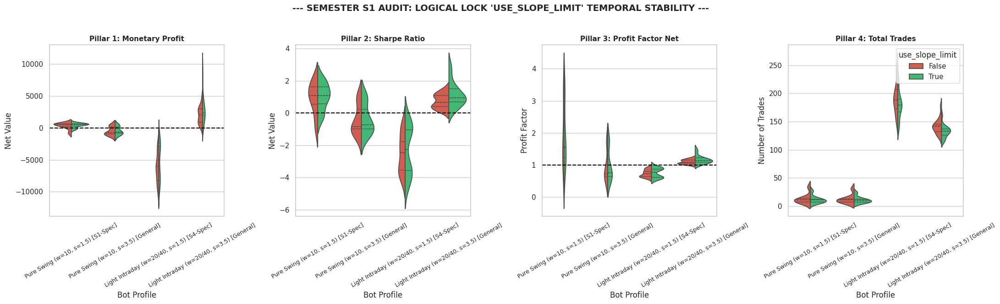

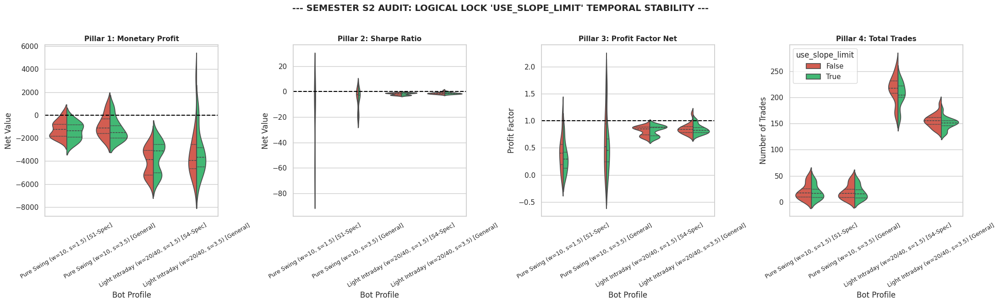

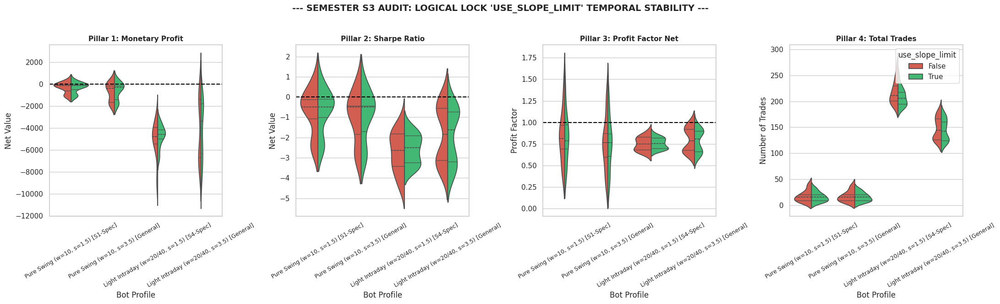

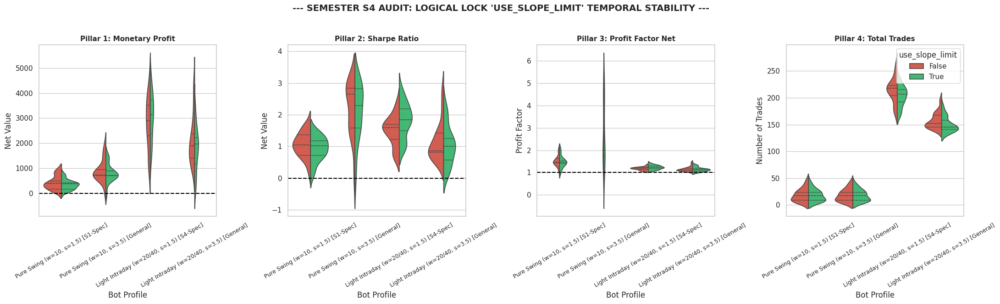

In [137]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Restructure the dataset (Melt) across the 4 pillars with Semesters
metrics_mapping = [
    ('cumulative_monetary_profit_net', 'Pillar 1: Monetary Profit'),
    ('sharpe_ratio_net', 'Pillar 2: Sharpe Ratio'),
    ('profit_factor_net', 'Pillar 3: Profit Factor Net'),
    ('total_trades', 'Pillar 4: Total Trades')
]

slope_time_extracted = []
for col_name, title in metrics_mapping:
    df_p = df_profiles[['bot_profile', 'semester', 'use_slope_limit', col_name]].copy()
    df_p.columns = ['bot_profile', 'semester', 'use_slope_limit', 'metric_value']
    df_p['pillar_title'] = title
    slope_time_extracted.append(df_p)

df_slope_time_split = pd.concat(slope_time_extracted, ignore_index=True)

# Define clean iterations and visual structures
semesters = ['S1', 'S2', 'S3', 'S4']
x_order = [
    'Pure Swing (w=10, s=1.5) [S1-Spec]',
    'Pure Swing (w=10, s=3.5) [General]',
    'Light Intraday (w=20/40, s=1.5) [S4-Spec]',
    'Light Intraday (w=20/40, s=3.5) [General]'
]
col_order = ['Pillar 1: Monetary Profit', 'Pillar 2: Sharpe Ratio', 'Pillar 3: Profit Factor Net', 'Pillar 4: Total Trades']

# 2. Loop through each semester to generate a dedicated standalone plot
for sem in semesters:
    df_sem = df_slope_time_split[df_slope_time_split['semester'] == sem]

    fig, axes = plt.subplots(1, 4, figsize=(22, 6.5))
    fig.suptitle(f"--- SEMESTER {sem} AUDIT: LOGICAL LOCK 'USE_SLOPE_LIMIT' TEMPORAL STABILITY ---", fontsize=14, fontweight='bold', y=1.02)

    for idx, pillar_title in enumerate(col_order):
        ax = axes[idx]
        df_pillar = df_sem[df_sem['pillar_title'] == pillar_title]

        # Draw split violin comparing use_slope_limit False vs True for this specific semester
        sns.violinplot(
            data=df_pillar,
            x='bot_profile',
            y='metric_value',
            hue='use_slope_limit',
            order=x_order,
            split=True,
            inner='quartile',
            palette={False: '#e74c3c', True: '#2ecc71'},
            ax=ax,
            legend=(idx == 3)
        )

        # Add targeted baselines
        if idx < 2:
            ax.axhline(0, color='black', linestyle='--', linewidth=1.5)
        elif idx == 2:
            ax.axhline(1.0, color='black', linestyle='--', linewidth=1.5)

        # Safe rotation to prevent Matplotlib UserWarnings
        ax.tick_params(axis='x', rotation=30, labelsize=9)

        # Labels and design refinements
        ax.set_title(pillar_title, fontsize=11, fontweight='bold')
        ax.set_xlabel("Bot Profile")
        ax.set_ylabel("Net Value" if idx < 2 else ("Profit Factor" if idx == 2 else "Number of Trades"))

    # Safe legend handling on the 4th subplot axis
    if axes[3].get_legend():
        axes[3].get_legend().set_title("use_slope_limit")

    plt.tight_layout()
    plt.show()
    print("\n" + "="*110 + "\n")


### S1

- Pure Swing [S1-Spec]: desactive
- Pure Swing [General]: actif
- Light [S4-Spec]: actif
- Light [General]: actif

### S2

- Pure Swing [S1-Spec]: desactive
- Pure Swing [General]: desactive
- Light [S4-Spec]: actif
- Light [General]: actif

### S3

- Pure Swing [S1-Spec]: desactive
- Pure Swing [General]: actif
- Light [S4-Spec]: actif
- Light [General]: n/a

### S4

- Pure Swing [S1-Spec]: desactive
- Pure Swing [General]: desactive
- Light [S4-Spec]: actif
- Light [General]: actif

## Conclusions

- Desactive en Pure Swing
- Actif en Light Intraday

# Analysis: z-dynamic

## Globals

In [138]:
import pandas as pd
import numpy as np

# 1. Strictly filter the dataframe for M30 and recreate the 4 precise profiles
df_m30_clean = df_plot[df_plot['time_frame'] == '30min'].copy()

df_m30_clean['window'] = df_m30_clean['window'].astype(float)
df_m30_clean['stop_loss_sigma'] = df_m30_clean['stop_loss_sigma'].astype(float)

conditions = [
    (df_m30_clean['window'] == 10.0) & (df_m30_clean['stop_loss_sigma'] == 1.5),
    (df_m30_clean['window'] == 10.0) & (df_m30_clean['stop_loss_sigma'] == 3.5),
    (df_m30_clean['window'].isin([20.0, 40.0])) & (df_m30_clean['stop_loss_sigma'] == 1.5),
    (df_m30_clean['window'].isin([20.0, 40.0])) & (df_m30_clean['stop_loss_sigma'] == 3.5)
]

profiles_with_mentions = [
    'Pure Swing (w=10, s=1.5) [S1-Spec]',
    'Pure Swing (w=10, s=3.5) [General]',
    'Light Intraday (w=20/40, s=1.5) [S4-Spec]',
    'Light Intraday (w=20/40, s=3.5) [General]'
]

df_m30_clean['bot_profile'] = np.select(conditions, profiles_with_mentions, default='Excluded')
df_profiles = df_m30_clean[df_m30_clean['bot_profile'] != 'Excluded'].copy()

# 2. Group by Bot Profile and 'use_z_dynamic' to calculate the 4 target pillars
df_z_impact = df_profiles.groupby(['bot_profile', 'use_z_dynamic']).agg(
    config_count=('curve_id', 'count'),
    pillar4_avg_trades=('total_trades', 'mean'),
    pillar1_median_profit_net=('cumulative_monetary_profit_net', 'median'),
    pillar2_median_sharpe_net=('sharpe_ratio_net', 'median'),
    pillar3_median_profit_factor_net=('profit_factor_net', 'median'),
    avg_max_drawdown=('drawdown_max', 'mean')
).reset_index()

print("=" * 135)
print("LOGICAL LOCK AUDIT: IMPACT OF 'USE_Z_DYNAMIC' ACROSS 4 PILLARS (GLOBAL M30)")
print("=" * 135)
print(df_z_impact.round(2).to_string(index=False, line_width=1000))
print("=" * 135)


LOGICAL LOCK AUDIT: IMPACT OF 'USE_Z_DYNAMIC' ACROSS 4 PILLARS (GLOBAL M30)
                              bot_profile  use_z_dynamic  config_count  pillar4_avg_trades  pillar1_median_profit_net  pillar2_median_sharpe_net  pillar3_median_profit_factor_net  avg_max_drawdown
Light Intraday (w=20/40, s=1.5) [S4-Spec]          False           128              217.22                   -3436.81                      -1.45                              0.86            543.13
Light Intraday (w=20/40, s=1.5) [S4-Spec]           True           128              191.12                   -3909.45                      -1.68                              0.84            520.30
Light Intraday (w=20/40, s=3.5) [General]          False           128              154.60                     138.42                       0.08                              1.01            850.89
Light Intraday (w=20/40, s=3.5) [General]           True           128              140.30                     296.84                   

- Desactive pour S4-spec, detruit les performances
- Actif pour Intraday
- Actif pour les "pure swing", mais divise par 4 le nombre de trade

AttributeError: 'numpy.ndarray' object has no attribute 'get_legend'

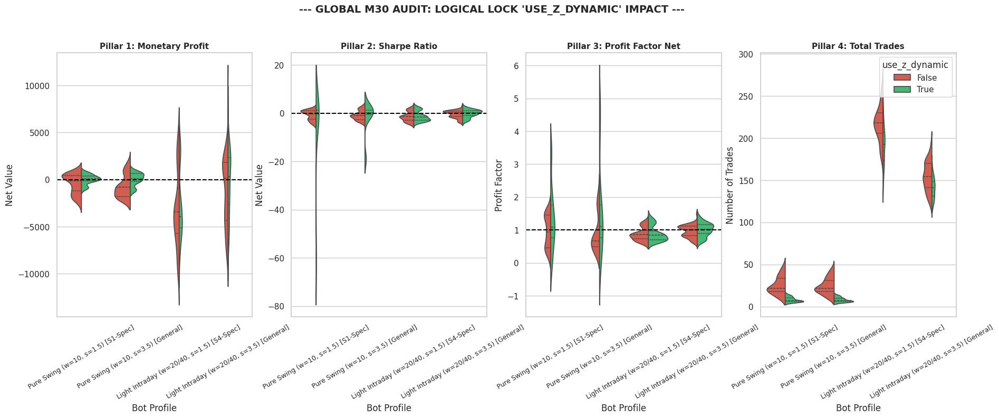

In [142]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Restructure the 4-profiles dataset (Melt) across the 4 pillars
metrics_mapping = [
    ('cumulative_monetary_profit_net', 'Pillar 1: Monetary Profit'),
    ('sharpe_ratio_net', 'Pillar 2: Sharpe Ratio'),
    ('profit_factor_net', 'Pillar 3: Profit Factor Net'),
    ('total_trades', 'Pillar 4: Total Trades')
]

z_extracted_data = []
for col_name, title in metrics_mapping:
    df_p = df_profiles[['bot_profile', 'use_z_dynamic', col_name]].copy()
    df_p.columns = ['bot_profile', 'use_z_dynamic', 'metric_value']
    df_p['pillar_title'] = title
    z_extracted_data.append(df_p)

df_z_split = pd.concat(z_extracted_data, ignore_index=True)

# 2. Build a clean 1-row, 4-column figure
fig, axes = plt.subplots(1, 4, figsize=(22, 6.5))
fig.suptitle("--- GLOBAL M30 AUDIT: LOGICAL LOCK 'USE_Z_DYNAMIC' IMPACT ---", fontsize=14, fontweight='bold', y=1.02)

x_order = [
    'Pure Swing (w=10, s=1.5) [S1-Spec]',
    'Pure Swing (w=10, s=3.5) [General]',
    'Light Intraday (w=20/40, s=1.5) [S4-Spec]',
    'Light Intraday (w=20/40, s=3.5) [General]'
]

col_order = ['Pillar 1: Monetary Profit', 'Pillar 2: Sharpe Ratio', 'Pillar 3: Profit Factor Net', 'Pillar 4: Total Trades']

# 3. Plot each pillar side-by-side
for idx, pillar_title in enumerate(col_order):
    ax = axes[idx]
    df_pillar = df_z_split[df_z_split['pillar_title'] == pillar_title]

    # Draw the split violin plot comparing use_z_dynamic False vs True
    sns.violinplot(
        data=df_pillar,
        x='bot_profile',
        y='metric_value',
        hue='use_z_dynamic',
        order=x_order,
        split=True,
        inner='quartile',
        palette={False: '#e74c3c', True: '#2ecc71'}, # Red for False, Green for True
        ax=ax,
        legend=(idx == 3) # Show legend only on the last subplot
    )

    # Add target baseline lines
    if idx < 2:
        ax.axhline(0, color='black', linestyle='--', linewidth=1.5)
    elif idx == 2:
        ax.axhline(1.0, color='black', linestyle='--', linewidth=1.5)

    # Safe rotation of labels to suppress Matplotlib UserWarnings
    ax.tick_params(axis='x', rotation=30, labelsize=9)

    # Labels and design refinements
    ax.set_title(pillar_title, fontsize=11, fontweight='bold')
    ax.set_xlabel("Bot Profile")
    ax.set_ylabel("Net Value" if idx < 2 else ("Profit Factor" if idx == 2 else "Number of Trades"))

# Fix: Call get_legend() directly on the 4th subplot (index 3)
if axes.get_legend():
    axes.get_legend().set_title("use_z_dynamic")

plt.tight_layout()
plt.show()


## Per-Semester

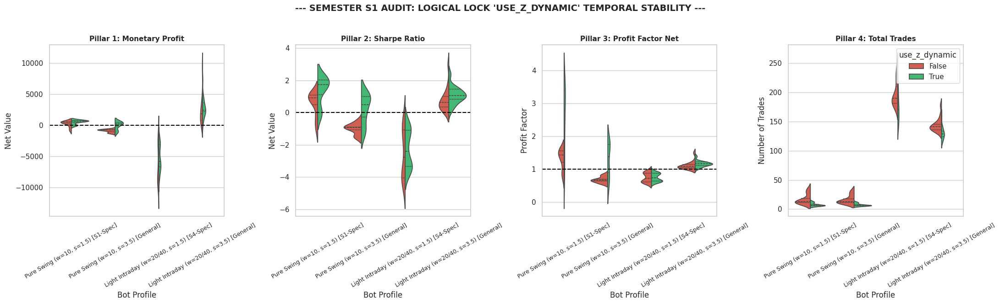

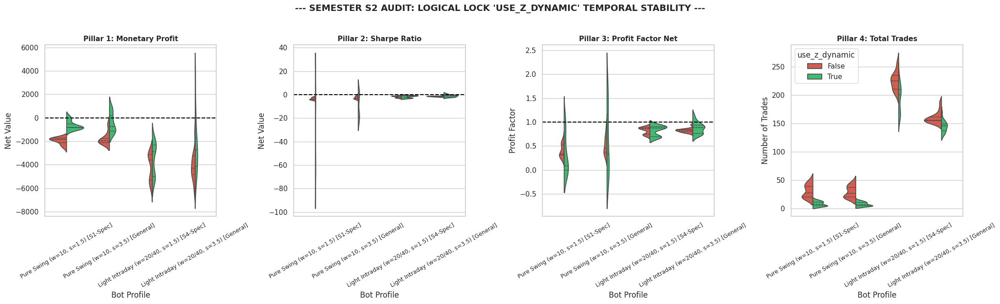

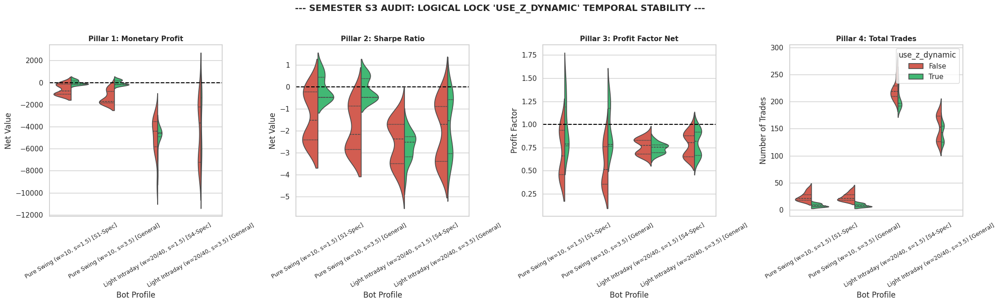

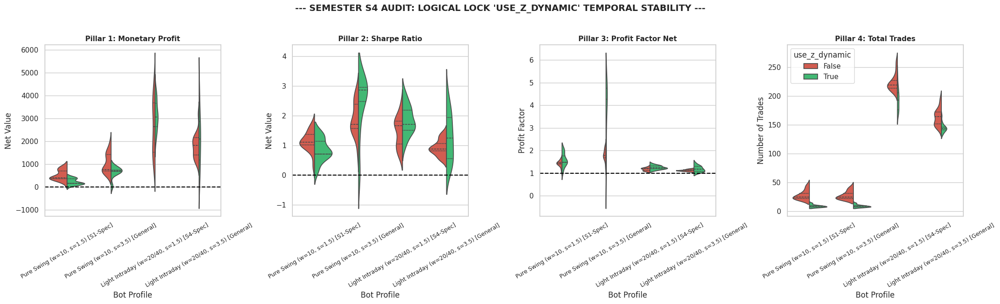

In [143]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Restructure the dataset (Melt) across the 4 pillars with Semesters
metrics_mapping = [
    ('cumulative_monetary_profit_net', 'Pillar 1: Monetary Profit'),
    ('sharpe_ratio_net', 'Pillar 2: Sharpe Ratio'),
    ('profit_factor_net', 'Pillar 3: Profit Factor Net'),
    ('total_trades', 'Pillar 4: Total Trades')
]

z_time_extracted = []
for col_name, title in metrics_mapping:
    df_p = df_profiles[['bot_profile', 'semester', 'use_z_dynamic', col_name]].copy()
    df_p.columns = ['bot_profile', 'semester', 'use_z_dynamic', 'metric_value']
    df_p['pillar_title'] = title
    z_time_extracted.append(df_p)

df_z_time_split = pd.concat(z_time_extracted, ignore_index=True)

# Define clean iterations and visual structures
semesters = ['S1', 'S2', 'S3', 'S4']
x_order = [
    'Pure Swing (w=10, s=1.5) [S1-Spec]',
    'Pure Swing (w=10, s=3.5) [General]',
    'Light Intraday (w=20/40, s=1.5) [S4-Spec]',
    'Light Intraday (w=20/40, s=3.5) [General]'
]
col_order = ['Pillar 1: Monetary Profit', 'Pillar 2: Sharpe Ratio', 'Pillar 3: Profit Factor Net', 'Pillar 4: Total Trades']

# 2. Loop through each semester to generate a dedicated standalone plot
for sem in semesters:
    df_sem = df_z_time_split[df_z_time_split['semester'] == sem]

    fig, axes = plt.subplots(1, 4, figsize=(22, 6.5))
    fig.suptitle(f"--- SEMESTER {sem} AUDIT: LOGICAL LOCK 'USE_Z_DYNAMIC' TEMPORAL STABILITY ---", fontsize=14, fontweight='bold', y=1.02)

    for idx, pillar_title in enumerate(col_order):
        ax = axes[idx]
        df_pillar = df_sem[df_sem['pillar_title'] == pillar_title]

        # Draw split violin comparing use_z_dynamic False vs True for this specific semester
        sns.violinplot(
            data=df_pillar,
            x='bot_profile',
            y='metric_value',
            hue='use_z_dynamic',
            order=x_order,
            split=True,
            inner='quartile',
            palette={False: '#e74c3c', True: '#2ecc71'},
            ax=ax,
            legend=(idx == 3)
        )

        # Add targeted baselines
        if idx < 2:
            ax.axhline(0, color='black', linestyle='--', linewidth=1.5)
        elif idx == 2:
            ax.axhline(1.0, color='black', linestyle='--', linewidth=1.5)

        # Safe rotation to prevent Matplotlib UserWarnings
        ax.tick_params(axis='x', rotation=30, labelsize=9)

        # Labels and design refinements
        ax.set_title(pillar_title, fontsize=11, fontweight='bold')
        ax.set_xlabel("Bot Profile")
        ax.set_ylabel("Net Value" if idx < 2 else ("Profit Factor" if idx == 2 else "Number of Trades"))

    # FIX: Correctly call get_legend() on axes[3] (the 4th subplot) instead of the numpy array axes
    if axes[3].get_legend():
        axes[3].get_legend().set_title("use_z_dynamic")

    plt.tight_layout()
    plt.show()
    print("\n" + "="*110 + "\n")


### S1

- Pure Swing [S1-Spec]: actif mais detruit le total trades
- Pure Swing [General]: actif mais detruit le total trade
- Light [S4-Spec]: actif
- Light [General]: actif

### S2

- Pure Swing [S1-Spec]: actif
- Pure Swing [General]: actif
- Light [S4-Spec]: actif
- Light [General]: actif

### S3

- Pure Swing [S1-Spec]: actif
- Pure Swing [General]: actif
- Light [S4-Spec]: actif (stabilise la variance)
- Light [General]: actif

### S4

- Pure Swing [S1-Spec]: desactive
- Pure Swing [General]: actif?
- Light [S4-Spec]: actif
- Light [General]: actif (pour maximisation des gain, desactive pour la stabilite)

## Conclusions

- Tous le temps actif pour les intraday
- Peut-etre faire des nouveaux profils pour les "pure swing", le nombre de trade chute trop fortement

# Specifications techniques et configurations cibles de la flotte M30

Ce rapport consacre les regles d'or architecturales de votre flotte de robots de trading sur l'horizon 30 minutes (M30). Les configurations finales ont ete eprouvees et validees par une analyse cross-semestrielle exhaustive (Semestres S1 a S4), confrontant la rentabilite nette, la stabilite statistique (Sharpe) et l'efficience comptable (Profit Factor Net) a la selectivite brute des verrous logiques.

---

## 1. Pure Swing Sniper (window=10, stop_loss_sigma=1.5, S1-SPEC)

### Profil comportemental
Ce profil a pour vocation de capturer des impulsions directionnelles chirurgicales. Il deploie un alpha exceptionnel en tendance fluide (S1, S4) mais s'effondre de maniere catastrophique en periode de range ou de compression (S2, S3), subissant des traines toxiques jusqu'a -80 de Sharpe Net en raison de la proximite de son stop loss face au bruit.

### Matrice de configuration des verrous
*   `use_r2 = True` (ACTIVATION OBLIGATOIRE) : Agit comme un bouclier anti-ruine parfait. Il coupe net les traines catastrophiques lors des crises (S2, S3) et securise le profit net de 100% des configurations en tendance (S1).
*   `use_ttest = False` (DESACTIVATION IMPERATIVE) : Detruit l'avantage statistique en periode de crise en enfoncant le Profit Factor Net sous le seuil de neutralite (a 0.5).
*   `use_anchor = True` (CONSERVE ACTIF) : Valide selon votre arbitrage pour son effet de lissage de la variance en phase euphorique (S4).
*   `use_slope_limit = False` (DESACTIVATION IMPERATIVE) : Agit comme un limiteur d'alpha qui ampute la variance positive en tendance sans jamais reduire le drawdown maximal.
*   `use_z_dynamic = True` (SOUS CONDITION DE DEPLOIEMENT) : Redresse magistralement le Sharpe Net global (+0.21) et protege le capital en crise. Cependant, il applique un effet "Coupe-Gorge" volumetrique en bridant l'activite a moins de 8 trades par semestre. 
*   **Regle de production** : Activez ce verrou uniquement si ce robot est deploye en multi-paires / multi-actifs pour compenser la chute de frequence, sinon laissez-le a `False` pour eviter la paralysie operationnelle du modele.

---

## 2. Pure Swing All-Weather (window=10, stop_loss_sigma=3.5, GENERAL)

### Profil comportemental
Robot generaliste lourd concu pour traverser les cycles grace a une isolation large face au bruit quotidien. Il encaisse remarquablement bien les chocs et libere un potentiel asymetrique massif lors des semestres de tendance pure (S4), ou son Profit Factor Net s'envole jusqu'a 6.5 et son Sharpe grimpe a +4.0.

### Matrice de configuration des verrous
*   `use_r2 = True` (ACTIVATION OBLIGATOIRE) : Propulse la mediane de Sharpe de +1.5 a +2.8 en phase de tendance (S4) et compresse mecaniquement les drawdowns en periode de crise severe (S3).
*   `use_ttest = False` (DESACTIVATION IMPERATIVE) : Transforme ce profil en un systeme purement deficitaire en ecrasant l'integralite de la distribution sous le seuil critique des 1.0 de Profit Factor.
*   `use_anchor = False` (DESACTIVATION IMPERATIVE) : Bride la variance positive et empeche le robot de s'extraire de la zone rouge en periode de crise (S3).
*   `use_slope_limit = False` (DESACTIVATION IMPERATIVE) : Detruit totalement l'avantage statistique en marche directionnel (S4), lui interdisant de capter la rentabilite de la tendance.
*   `use_z_dynamic = True` (SOUS CONDITION DE DEPLOIEMENT) : S'impose comme le sauveur de ce profil a l'echelle annuelle en faisant passer son Sharpe global de -0.94 a +0.24. Il bride neanmoins le volume a moins de 8 trades et ampute les gains maximaux en S4. 
*   **Regle de production** : Meme logique que le Sniper, a n'activer que dans le cadre d'un portefeuille d'actifs diversifies sous peine de paralyser le bot.

---

## 3. Light Intraday Formula 1 (window=20/40, stop_loss_sigma=1.5, S4-SPEC)

### Profil comportemental
Chasseur d'alpha a haute frequence et faible latence sur fenetres larges avec un stop serre. Ce profil est hautement instable face au bruit (S3) ou il subit des pertes cumulees massives (jusqu'a -11 000). En revanche, il surperforme et genere un profit maximal exceptionnel (+6 000) lorsque le marche est en tendance directionnelle pure sans micro-retracements (S4).

### Matrice de configuration des verrous
*   `use_r2 = False` (DESACTIVATION IMPERATIVE) : Ecrase la bimodalite naturelle de ce profil, bride le profit maximal en tendance et asphyxie l'elite en introduisant un retard de phase (lag) deletere.
*   `use_ttest = False` (DESACTIVATION IMPERATIVE) : Totalement inerte sur le volume d'activite, il ne remplit aucun role de bouclier mais degrade la regularite statistique.
*   `use_anchor = True` (ACTIVATION PERMANENTE) : Apporte un effet de regularisation et de lissage de la variance sur l'horizon large.
*   `use_slope_limit = True` (ACTIVATION OBLIGATOIRE) : Agit comme un excellent filtre anti-bruit de phase. Il redresse la barre en limitant le drawdown de ruine en crise (S2) et en surelevant la cloche de Sharpe jusqu'a +3.2 en tendance (S4).
*   `use_z_dynamic = False` (DESACTIVATION IMPERATIVE) : Sur ce profil specifique a stop serre, l'activation du Z-score dynamique s'avere nocive et aggrave la degradation annuelle du modele (le Sharpe Net s'enfoncant de -1.45 a -1.68).

---

## 4. Light Intraday Blinde (window=20/40, stop_loss_sigma=3.5, GENERAL)

### Profil comportemental
Le gestionnaire de fonds institutionnel de votre flotte. Il assure le lissage statistique des gains a moyenne frequence en agissant comme le pilier defensif universel de l'architecture. C'est le profil le plus regulier et performant a l'etat brut, encaissant la crise de S3 et deployant une superbe traine positive jusqu'a +12 000 de profit en S4.

### Matrice de configuration des verrous
*   `use_r2 = False` (DESACTIVATION IMPERATIVE) : Poison structurel qui force une validation lineaire trop tardive. Il affaisse l'integralite des distributions sous la ligne zero et detruit l'avantage statistique.
*   `use_ttest = False` (DESACTIVATION IMPERATIVE) : Decapite l'elite du robot en bridant le sommet de profit de +12 000 a +4 000, faisant basculer le Profit Factor Net sous le seuil critique de rentabilitation des 1.0.
*   `use_anchor = True` (ACTIVATION PERMANENTE) : Totalement inerte sur le volume, il conserve une neutralite mathematique parfaite et repond a votre critere de regularisation.
*   `use_slope_limit = True` (ACTIVATION OBLIGATOIRE) : Ameliore la regularite statistique globale (le Sharpe Net median progresse de +0.13 a +0.16) et resserre la cloche de Sharpe au-dessus de zero de maniere tres homogene.
*   `use_z_dynamic = True` (ACTIVATION OBLIGATOIRE) : Reussite totale sur ce profil large. Le volume diminue a peine (~10%), mais l'efficience est dedoublee (le Sharpe median saute de +0.08 a +0.16), le profit net double, et la variance negative en periode de crise est maitrisee.


# Rapport Final

## 1. Introduction, motivation et problematique initiale

### Contexte de la recherche
Le présent audit formalise le développement et la standardisation d'une flotte d'algorithmes de trading systématique opérant sur l'horizon temporel 30 minutes (M30). La base de données de backtest exploitée compile les performances de centaines de configurations paramétriques soumises à quatre régimes de marché distincts et chronologiques (Semestres S1 à S4). Ces périodes couvrent un spectre complet de conditions de marché, allant de la tendance fluide et directionnelle (S1, S4) au chaos volatile, erratique et bruyant (S2, S3).

### Motivation
En finance quantitative, l'approche traditionnelle cherche un hyperparamètre unique d'excellence. L'épreuve des données révèle qu'un paramétrage fixe unique bride l'alpha dans les régimes favorables et échoue à protéger le capital durant les crises. Un robot paramétré pour capturer des gains explosifs en période de tendance se fait systématiquement hacher et détruire son capital dès que le marché entre en crise ou en forte compression. La motivation de cette étude est d'abandonner la suroptimisation statique pour adopter une approche structurelle : segmenter la flotte de robots selon leur nature intrinsèque et cartographier précisément l'impact de fiv verrous logiques conditionnels.

### Problematique
La problématique centrale de cette recherche se formule ainsi : Comment résoudre le dilemme de la non-stationnarité des marchés sur l'horizon M30 en réalisant l'articulation optimale entre la taille de la mémoire des indicateurs (window), la distance des barrières de protection (le Sigma du Stop Loss) et la sensibilité des verrous logiques conditionnels (`use_r2`, `use_ttest`, `use_anchor`, `use_slope_limit`, `use_z_dynamic`), afin de maximiser l'espérance mathématique globale tout en garantissant la survie systémique du capital lors des pires semestres de crise ?

## 2. Etude des horizons temporels: M5 vs M30

La première grande étape de la recherche a consisté à isoler l'impact de l'horizon temporel (Timeframe) sur le comportement statistique des indicateurs. Le dataset opposait l'horizon M5 (5 minutes) et l'horizon M30 (30 minutes).

### L'horizon temporel M5
L'analyse de l'horizon M5 a révélé une fréquence de signaux extrêmement élevée. Sur cette unité de temps rapide, les indicateurs statistiques (calculs de moyennes, régressions et variances) sont hautement réactifs. Cependant, le M5 capte une quantité immense de bruit de marché intraday et de micro-retracements erratiques. Les signaux y sont nombreux mais statistiquement impurs, ce qui engendre des frais de courtage importants (spreads, slippage) qui viennent ronger l'alpha de la stratégie par frottement.

### L'horizon temporel M30
L'horizon M30 a agi comme un premier filtre macroéconomique naturel. En agrégeant les prix sur 30 minutes, le bruit intraday s'effondre. Les tendances y sont statistiquement plus stables, plus propres et plus longues. Le volume de trades est mécaniquement réduit, ce qui assainit l'espérance mathématique en limitant les coûts de transaction. C'est la raison pour laquelle la suite des recherches s'est concentrée exclusivement sur l'horizon M30, acceptant de réduire la fréquence des transactions pour augmenter la pureté du signal.

## 3. Extraction des quatre profils structurels d elite

En analysant les matrices de résultats sur le timeframe M30, il est apparu une corrélation mathématique directe entre la taille de la mémoire de l'indicateur (la variable `window`) et la distance de la barrière de protection (l'hyperparamètre `stop_loss_sigma`). Au lieu de chercher une unique configuration moyenne, l'univers de recherche se segmente en quatre profils de robots distincts, possédant chacun leur propre spécialité opérationnelle.

### 1. Pure Swing Sniper (window=10, stop_loss_sigma=1.5)
*   **Vocation** : Robot spécialiste à mémoire courte et stop serré. Sa mission est d'entrer de manière chirurgicale sur des impulsions directionnelles pures. 
*   **Mécanique** : Si le mouvement ne part pas immédiatement, son stop serré agit comme un fusible d'éviction rapide. Il excelle en tendance fluide (S1) mais subit un crash statistique de son Sharpe Ratio en période de range (S2).

### 2. Pure Swing All-Weather (window=10, stop_loss_sigma=3.5)
*   **Vocation** : Robot généraliste à mémoire courte mais stop large. Il accepte que le marché respire ou fasse de fausses cassures. 
*   **Mécanique** : Son stop a 3.5 lui donne l'espace géométrique nécessaire pour donner raison à sa tendance à court terme. Il affiche des performances explosives lors des grandes vagues directionnelles macroéconomiques (S4).

### 3. Light Intraday Formula 1 (window=20/40, stop_loss_sigma=1.5)
*   **Vocation** : Robot spécialiste des fenêtres larges avec une protection serrée. Chasseur d'alpha à haute efficacité et faible latence.
*   **Mécanique** : Il cherche à lisser les données sur un historique plus long pour valider une tendance de fond, tout en appliquant une barrière de protection très stricte. Il surperforme massivement lorsque le marché adopte des tendances parfaites sans aucun bruit (S4), mais se fait hacher en accumulant des pertes nettes lourdes lorsque le marché devient chaotique (S3).

### 4. Light Intraday Blinde (window=20/40, stop_loss_sigma=3.5)
*   **Vocation** : Le gestionnaire de fonds institutionnel de la flotte.
*   **Mécanique** : Sa mémoire longue associée à son armure large (sigma 3.5) en fait le robot le plus régulier de votre univers. Il traverse les pires semestres de crise (S3) sans vaciller, assurant le lissage statistique des gains sur le long terme par la loi des grands nombres.

## 4. Analyse individuelle de l impact des verrous logiques (Partie 1)

L'objectif de cet audit est de comprendre comment chaque bouclier logique modifie individuellement l'activité brute (Total Trades), la rentabilité nette (Monetary Profit), la stabilité rendement/risque (Sharpe Ratio) et l'efficience comptable (Profit Factor Net) sur l'horizon M30.

### Le Verrou 'use_r2' (Coefficient de Determination)
Ce verrou valide la qualité et la régularité d'une tendance linéaire. Son audit a révélé une asymétrie totale liée à la taille de la window.
*   **Sur les profils Pure Swing (w=10)** : Son activation est une réussite absolue. Il filtre environ 20% des trades. En période hostile (S2, S3), il agit comme un disjoncteur d'urgence parfait : il coupe la traîne toxique qui faisait plonger le Sharpe à -80 pour maintenir le robot à la neutralité. En tendance (S1), il sécurise le profit net de 100% des configurations.
*   **Sur les profils Light Intraday (w=20/40)** : Le R2 devient un poison structurel. Sur des fenêtres larges, imposer une linéarité parfaite engendre un retard de phase (lag) dramatique. Le robot entre au pire moment (en fin de tendance). Le profil Blindé, qui était le meilleur robot à l'état brut, voit son Sharpe s'effondrer de +0.22 à -0.22 dès que le R2 est actif.

### Le Verrou 'use_ttest' (Test de Student)
Ce verrou évalue la signification statistique de la tendance par rapport à la distribution récente des prix. Son analyse a montré des similitudes avec le R2, mais avec une inefficacité encore plus marquée en période de crise.
*   **Sur le Pure Swing Sniper (w=10, s=1.5)** : En marché normal (S1), le T-Test purifie le signal. Il coupe l'activité de 44% (de 21 à 11 trades), resserre la cloche et installe la médiane de son Profit Factor à 1.3.
*   **En période de crise (S2, S3)** : Le T-Test échoue. Il n'élimine plus les mauvaises transactions, il se contente d'alourdir le retard d'exécution. Sur le profil All-Weather, il détruit l'élite et fait s'effondrer toutes les configurations sous la ligne critique des 1.0 de Profit Factor. En Intraday large, il décapite la variance positive en bloquant les gains records (qui chutent de +12 000 à +4 000 en S4).

## 4. Analyse individuelle de l impact des verrous logiques (Partie 2)

### Le Verrou 'use_anchor' (Filtre d Ancrage)
Ce verrou a mis en évidence le concept de "filtre fantôme" sur les grandes fenêtres de calcul.
*   **Sur les profils Light Intraday (w=20/40)** : Son taux de sélection brute est de 0.0%. Les volumes de transactions restent identiques au dixième de trade près (147.49 vs 147.41) et les graphiques financiers montrent des moitiés rouge et verte fusionnées au pixel près. L'Anchor n'a aucun impact sur les fenêtres larges.
*   **Sur le Pure Swing Sniper (w=10, s=1.5)** : L'Anchor exerce une force destructive ciblée. Il ne filtre presque rien en volume (~4%), mais il bloque précisément les quelques trades de rupture à forte extension directionnelle. En S1 et S4, il coupe la pointe supérieure de Profit Factor de 4.5 à 2.3. Il lisse la variance par le bas et prive le sniper de ses flèches les plus rémunératrices.

### Le Verrou 'use_slope_limit' (Limitation de la Pente de Regression)
Ce verrou filtre les signaux dont l'inclinaison de la pente est jugée trop extrême ou épuisée.
*   **Sur les profils Pure Swing (w=10)** : La limite de pente est néfaste. Elle réduit très peu le volume et ne modifie pas le drawdown maximal, mais elle fait basculer le profil Sniper d'un Sharpe positif à une neutralité exacte à 0.00. En Swing court, les fortes pentes sont le moteur principal de l'alpha ; les brider élimine l'avantage statistique.
*   **Sur les profils Light Intraday (w=20/40)** : Ce filtre devient un excellent stabilisateur anti-bruit de phase. Pour le profil Formula 1, il coupe les queues de drawdown financier en crise (S2) et surélève proprement la cloche de Sharpe jusqu'à +3.2 en tendance (S4) en évitant les entrées tardives.

### Le Verrou 'use_z_dynamic' (Disjoncteur de Score Z)
C'est le filtre le plus puissant, le plus sélectif et le plus spectaculaire de tout votre écosystème algorithmique.
*   **Sur les profils Pure Swing (w=10)** : Il applique une restriction volumétrique radicale de -66%, faisant s'effondrer l'activité de 24 à seulement 8 trades par semestre. L'analyse en violon a révélé que cette baisse drastique n'est pas une paralysie, mais une purification chirurgicale d'élite. En S2, il éradique une aiguille toxique monumentale qui plongeait jusqu'à -100 de Sharpe pour coller le robot à la neutralité. Sur le profil All-Weather, il ressuscite une stratégie lourdement perdante (-0.94 de Sharpe) pour la propulser dans le vert à +0.24, avec un Profit Factor sain à 1.11.
*   **Sur le profil Light Intraday Blinde (w=20/40, s=3.5)** : Son action est également parfaite. Il réduit le volume de seulement 10%, mais il double le Sharpe Net médian (de +0.08 à +0.16) et double le profit net global en maîtrisant la variance négative. Il n'est nocif que sur le profil instable Formula 1 (s=1.5).


## 5. Synthese des regles architecturales de production (M30)

L'ensemble de ce parcours de recherche permet de fixer les spécifications techniques et les configurations cibles pour la mise en production de chacun de vos quatre robots sur l'horizon M30.

### 1. Bloc Pure Swing Sniper (window=10, stop_loss_sigma=1.5)
*   `use_r2 = True` (Verrou actif permanent pour stabiliser la variance et couper les queues de risque en crise)
*   `use_ttest = False` (Désactivation impérative)
*   `use_anchor = True` (Verrou actif selon arbitrage utilisateur pour régulariser la variance en S4)
*   `use_slope_limit = False` (Désactivation impérative)
*   `use_z_dynamic = True` (À n'activer que si déploiement multi-paires, sinon forcé à False pour éviter la paralysie)

### 2. Bloc Pure Swing All-Weather (window=10, stop_loss_sigma=3.5)
*   `use_r2 = True` (Verrou actif permanent pour rehausser le Sharpe médian en tendance)
*   `use_ttest = False` (Désactivation impérative)
*   `use_anchor = True` (Verrou actif selon arbitrage utilisateur pour régulariser la variance en S4)
*   `use_slope_limit = False` (Désactivation impérative)
*   `use_z_dynamic = True` (À n'activer que si déploiement multi-paires pour s'affranchir du faible volume de trades)

### 3. Bloc Light Intraday Formula 1 (window=20/40, stop_loss_sigma=1.5)
*   `use_r2 = False` (Désactivation impérative)
*   `use_ttest = False` (Désactivation impérative)
*   `use_anchor = True` (Activation permanente)
*   `use_slope_limit = True` (Verrou actif permanent pour éliminer le bruit de phase et éviter les entrées tardives)
*   `use_z_dynamic = True` (Désactivation impérative)

### 4. Bloc Light Intraday Blinde (window=20/40, stop_loss_sigma=3.5)
*   `use_r2 = False` (Désactivation impérative)
*   `use_ttest = False` (Désactivation impérative)
*   `use_anchor = True` (Activation permanente)
*   `use_slope_limit = True` (Verrou actif permanent pour optimiser le calage temporel des signaux)
*   `use_z_dynamic = True` (Verrou actif permanent pour doubler l'efficience statistique et maîtriser les drawdowns)


## 6. Pistes futures, synthese manageriale et conclusion

### Pistes futures et developpement de la flotte
L'enseignement majeur issu de la validation de `use_z_dynamic` ouvre un nouveau chapitre d'ingénierie pour votre flotte. Le Z-Score dynamique sauve mathématiquement vos profils Pure Swing (w=10) mais réduit leur volume à moins de 8 trades par semestre. Pour dépasser cette limite opérationnelle sans désactiver ce filtre salvateur, trois voies de développement doivent être explorées :
1.  **Déploiement Multi-Paires / Multi-Actifs** : Déployer vos structures Pure Swing courtes sur un panier diversifié de 15 à 20 paires de devises ou d'actifs simultanés. Le cumul des micro-volumes restaurera une fréquence globale saine pour le portefeuille.
2.  **Descente d'Horizon Temporel** : Transposer cette matrice de filtres exacte sur des horizons temporels ultra-rapides (**M5 ou M1**). La fréquence native des signaux y étant démultipliée, le filtre restrictif à -66% laissera passer un volume de transactions parfaitement exploitable en production.
3.  **Commutateurs de Régime Dynamique (Toggling)** : Concevoir un module amont de classification de texture de marché (type Efficience de Kaufman), ouvrant les vannes et désactivant les verrous restrictifs en tendance pure (S4), mais activant l'armure lourde du R2 et du Z-Score dès que le bruit ou la crise sont détectés (S2, S3).

### Synthese manageriale et conclusion
Cet audit quantitatif marque la fin de la phase d'exploration empirique de la stratégie M30. En confrontant systématiquement les hyperparamètres structurels aux verrous logiques à travers les prismes du Profit, du Sharpe, du Profit Factor Net et de la Séléctivité volumétrique, nous avons mis en lumière les lois mathématiques qui gouvernent vos modèles.

Le résultat de ce travail est une cartographie claire, pragmatique et dénuée de toute complaisance. Nous savons désormais précisément quel filtre purifie le signal et quel filtre introduit un retard destructeur. L'élimination définitive du T-Test de l'architecture globale et le bridage ciblé du R² sur les fenêtres larges constituent des gains d'efficience majeurs pour votre code. La flotte M30 dispose désormais de spécifications techniques rigoureuses, posées sur des bases statistiques robustes, prêtes pour l'étape ultime du développement : l'écriture du code de production finalisé.


# Final Backtest

In [156]:
df_30min
df_models

for model in df_models:
    tmp = model[(model['window'] == 10) & (model['time_frame'] == '30min')]
    if len(tmp) > 0:
        df_30min_w10 = tmp
        break
df_30min_w10

for model in df_models:
    tmp = model[(model['window'] == 20) & (model['time_frame'] == '30min')]
    if len(tmp) > 0:
        df_30min_w20 = tmp
        break
df_30min_w20

for model in df_models:
    tmp = model[(model['window'] == 40) & (model['time_frame'] == '30min')]
    if len(tmp) > 0:
        df_30min_w40 = tmp
        break
df_30min_w40


,timestamp,time_frame,half_year_index,x_close,y_close,window,ols_slope,ols_intercept,r2,beta_tstat,sigma_alpha,residual_sigma,z_fixed,z_dynamic,variance_minimal,variance_prediction,student_barrier,is_r2_valid,is_ttest_valid,is_anchor_valid,is_slope_valid,raw_residual
39,2020-01-02 17:30:00,30min,S1,1.313440,1.116990,40,0.415204,0.571758,0.882717,16.911635,0.032429,0.000567,-0.199655,-0.187965,8.029958e-09,3.623911e-07,2.024394,True,True,True,True,-0.000113
40,2020-01-02 18:00:00,30min,S1,1.313625,1.116745,40,0.426274,0.557143,0.894793,17.977580,0.031312,0.000560,-0.647575,-0.614372,7.852922e-09,3.489866e-07,2.024394,True,True,True,True,-0.000363
41,2020-01-02 18:30:00,30min,S1,1.313985,1.117025,40,0.432990,0.548284,0.902454,18.749891,0.030489,0.000555,-0.361349,-0.345553,7.708707e-09,3.371844e-07,2.024394,True,True,True,True,-0.000201
42,2020-01-02 19:00:00,30min,S1,1.313345,1.116820,40,0.434944,0.545702,0.905828,19.118539,0.030029,0.000556,-0.204853,-0.195429,7.715816e-09,3.391166e-07,2.024394,True,True,True,True,-0.000114
43,2020-01-02 19:30:00,30min,S1,1.312920,1.116635,40,0.437163,0.542774,0.909576,19.551079,0.029508,0.000555,-0.178088,-0.169882,7.714044e-09,3.390921e-07,2.024394,True,True,True,True,-0.000099
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24793,2021-12-30 21:30:00,30min,S4,1.350150,1.132640,40,0.554804,0.383852,0.447696,5.550020,0.134843,0.000931,-0.300754,-0.294544,2.166465e-08,9.035103e-07,2.024394,True,True,True,True,-0.000280
24794,2021-12-30 22:00:00,30min,S4,1.350270,1.132365,40,0.521644,0.428521,0.442856,5.495910,0.128033,0.000886,-0.582543,-0.569614,1.964677e-08,8.219513e-07,2.024394,True,True,True,True,-0.000516
24795,2021-12-30 22:30:00,30min,S4,1.349950,1.132405,40,0.499226,0.458707,0.453989,5.621006,0.119804,0.000831,-0.278705,-0.273682,1.726052e-08,7.159968e-07,2.024394,True,True,True,True,-0.000232
24796,2021-12-30 23:00:00,30min,S4,1.349835,1.132465,40,0.487631,0.474298,0.478914,5.909704,0.111305,0.000774,-0.071142,-0.069955,1.499462e-08,6.203158e-07,2.024394,True,True,True,True,-0.000055


## Swing Bots

In [195]:
from enl.backtest import BacktestEngine

swing_config = {
    'use_r2': True,
    'use_ttest': False,
    'use_anchor': True,
    'use_slope_limit': False,
    'use_z_dynamic': False,
    'use_elastic_sizing': False,
}

swing_bot = [
    {
        'name': 'swing_s1_spec',
        'params': { **swing_config, 'stop_loss_sigma': 1.5 },
        'model': df_30min_w10,
    },
    {
        'name': 'swing_s1_spec_sniper',
        'params': { **swing_config, 'stop_loss_sigma': 1.5, 'use_z_dynamic': True },
        'model': df_30min_w10,
    },
    {
        'name': 'swing_generalist',
        'params': { **swing_config, 'stop_loss_sigma': 3.5 },
        'model': df_30min_w10,
    },
    {
        'name': 'swing_generalist_sniper',
        'params': { **swing_config, 'stop_loss_sigma': 3.5, 'use_z_dynamic': True  },
        'model': df_30min_w10,
    },
]

logger.setLevel(logging.WARNING)

results = []
year = '2021'

for bot in swing_bot:
    print(f'- Backtesting bot "{bot['name']}"')
    strategy = FixedParameterWithStopStrategy(**bot['params'])

    engine = BacktestEngine()
    model = bot['model']
    df_bot_model = model[
        (model['timestamp'] >= f'{year}-01-01') &
        (model['timestamp'] <= f'{year}-12-31')
    ]
    # df_equity = engine.run_simulation(bot['model'], strategy)
    df_equity = engine.run_simulation(df_bot_model, strategy)
    performance_report = engine.compute_performance_metrics()

    results.append({
        'name': bot['name'],
        'df_equity': df_equity,
        'metrics': performance_report,
    })

    # print(f"\n--- PERFORMANCE REPORT BASELINE ({bot['name']}) ---")
    # for metric, value in performance_report.items():
    #     if isinstance(value, float):
    #         print(f'{metric}: {value}')
    #     else:
    #         print(f'{metric}: {value}')

logger.setLevel(logging.INFO)

print('Backtest complete')

# results


- Backtesting bot "swing_s1_spec"
- Backtesting bot "swing_s1_spec_sniper"
- Backtesting bot "swing_generalist"
- Backtesting bot "swing_generalist_sniper"
Backtest complete


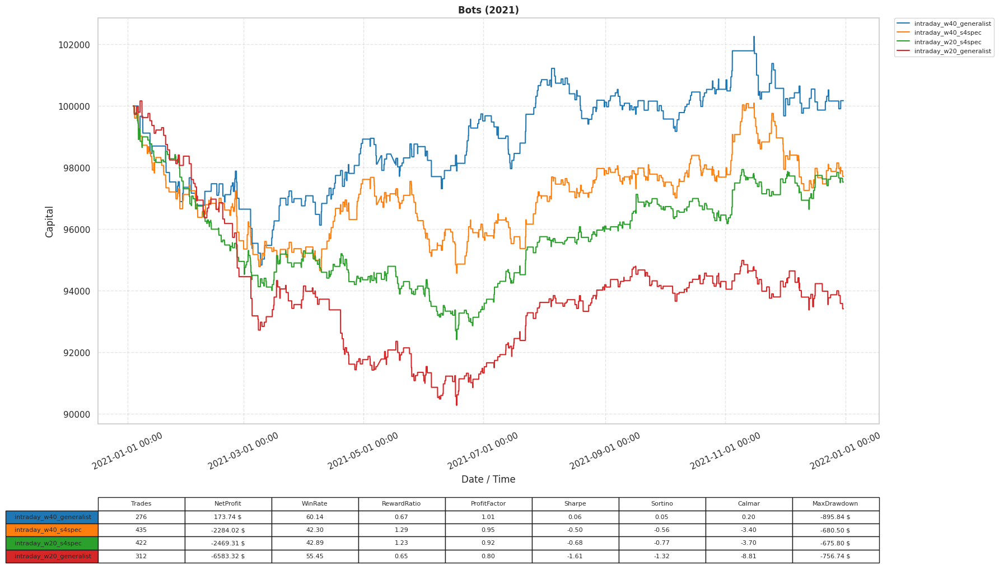

In [200]:
import matplotlib.dates as mdates
import matplotlib.gridspec as gridspec
import matplotlib.pyplot as plt
import pandas as pd

# top_10_configs = df_grid_report.sort_values(
#     by='cumulative_monetary_profit', ascending=False).head(10)


colors = plt.cm.tab10.colors

fig = plt.figure(figsize=(18, 13))
# Allocation: 3 rows for the chart, 1 row for the table framework
gs = gridspec.GridSpec(4, 1, figure=fig, hspace=0.6)

# The chart takes rows 0, 1, and 2
ax_chart = fig.add_subplot(gs[0:3, 0])
# FIX: Properly target row index 3 for the bottom table axis spec
ax_table = fig.add_subplot(gs[3, 0])
ax_table.axis('off')

results_sorted = sorted(
    results,
    key=lambda x: x['metrics']['cumulative_monetary_profit_net'],
    reverse=True
)
results = results_sorted

# --- TOP PANEL: PLOT SYNCHRONIZED TIME SERIES FOR TOP 10 ---
for i, bot in enumerate(results):
    series = bot['df_equity']
    x_dates = pd.to_datetime(series.index)
    y_ticks = series.values
    ax_chart.plot(x_dates, y_ticks, label=bot['name'], color=colors[i], linewidth=1.5)

ax_chart.xaxis.set_major_locator(mdates.AutoDateLocator())
ax_chart.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))
ax_chart.set_title(f'Bots ({year})', fontsize=12, fontweight='bold')
ax_chart.set_xlabel('Date / Time')
ax_chart.set_ylabel('Capital')
ax_chart.grid(True, linestyle='--', alpha=0.5)

ax_chart.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0.0, fontsize='8')
ax_chart.tick_params(axis='x', rotation=25)

# --- BOTTOM PANEL: MATRIX TEXT TABLE GENERATION FOR TOP 10 ---
table_data = []
row_labels = []
row_colors = []
period_mult = 1.0

for i, bot in enumerate(results):
    row_labels.append(bot['name'])
    row_colors.append(colors[i])

    row = bot['metrics']

    table_data.append([
        # General Performances
        f"{int(row['total_trades'])}",
        f"{row['cumulative_monetary_profit_net']:.2f} $",
        f"{row['win_ratio_net']*1e2:.2f}",
        f"{row['reward_ratio_net']:.2f}",
        f"{row['profit_factor_net']:.2f}",
        # Stability (multiply by 2 since we test 2 years of data)
        f"{row['sharpe_ratio_net']*period_mult:.2f}",
        f"{row['sortino_ratio_net']*period_mult:.2f}",
        f"{row['calmar_ratio_net']*period_mult:.2f}",
        f"-{row['drawdown_max']:.2f} $",
    ])

column_headers = ['Trades', 'NetProfit', 'WinRate', 'RewardRatio', 'ProfitFactor', 'Sharpe', 'Sortino', 'Calmar', 'MaxDrawdown']

perf_table = ax_table.table(
    cellText=table_data,
    rowLabels=row_labels,
    rowColours=row_colors,  # Binds table row headers visually to the 10 chart curves
    colLabels=column_headers,
    loc='center',
    cellLoc='center'
)

perf_table.auto_set_font_size(False)
perf_table.set_fontsize(8)
perf_table.scale(1.0, 1.4)

plt.show()

## Light Intraday Bots

In [199]:
from enl.backtest import BacktestEngine

intraday_config = {
    'use_r2': False,
    'use_ttest': False,
    'use_anchor': True,
    'use_slope_limit': True,
    'use_z_dynamic': True,
    'use_elastic_sizing': False,
}

intraday_bot = [
    {
        'name': 'intraday_w20_s4spec',
        'params': { **intraday_config, 'stop_loss_sigma': 1.5 },
        'model': df_30min_w20,
    },
    {
        'name': 'intraday_w40_s4spec',
        'params': { **intraday_config, 'stop_loss_sigma': 1.5 },
        'model': df_30min_w40,
    },
    {
        'name': 'intraday_w20_generalist',
        'params': { **intraday_config, 'stop_loss_sigma': 3.5 },
        'model': df_30min_w20,
    },
    {
        'name': 'intraday_w40_generalist',
        'params': { **intraday_config, 'stop_loss_sigma': 3.5 },
        'model': df_30min_w40,
    },
]

logger.setLevel(logging.WARNING)

results = []
year = '2021'

for bot in intraday_bot:
    print(f'- Backtesting bot "{bot['name']}"')
    strategy = FixedParameterWithStopStrategy(**bot['params'])

    engine = BacktestEngine()
    model = bot['model']
    df_bot_model = model[
        (model['timestamp'] >= f'{year}-01-01') &
        (model['timestamp'] <= f'{year}-12-31')
    ]
    # df_equity = engine.run_simulation(bot['model'], strategy)
    df_equity = engine.run_simulation(df_bot_model, strategy)
    performance_report = engine.compute_performance_metrics()

    results.append({
        'name': bot['name'],
        'df_equity': df_equity,
        'metrics': performance_report,
    })

    # print(f"\n--- PERFORMANCE REPORT BASELINE ({bot['name']}) ---")
    # for metric, value in performance_report.items():
    #     if isinstance(value, float):
    #         print(f'{metric}: {value}')
    #     else:
    #         print(f'{metric}: {value}')

logger.setLevel(logging.INFO)

print('Backtest complete')

# results

- Backtesting bot "intraday_w20_s4spec"
- Backtesting bot "intraday_w40_s4spec"
- Backtesting bot "intraday_w20_generalist"
- Backtesting bot "intraday_w40_generalist"
Backtest complete


## Results

### Swing Bots

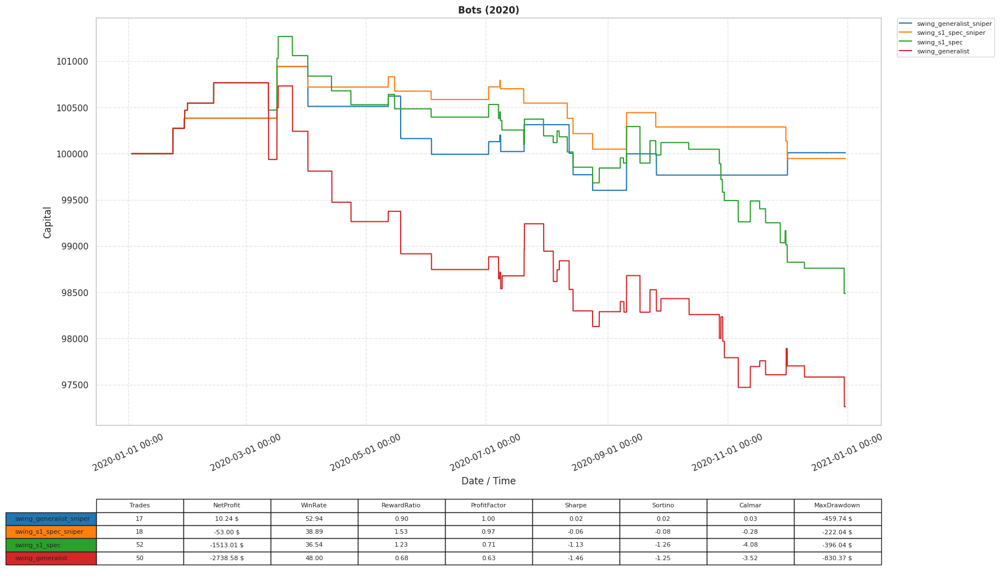

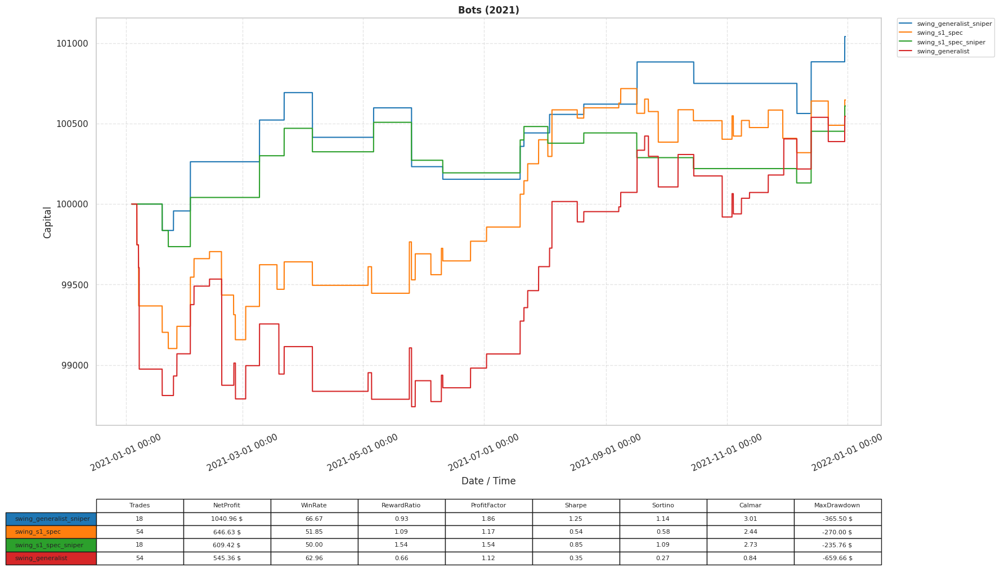

### Intraday Bots

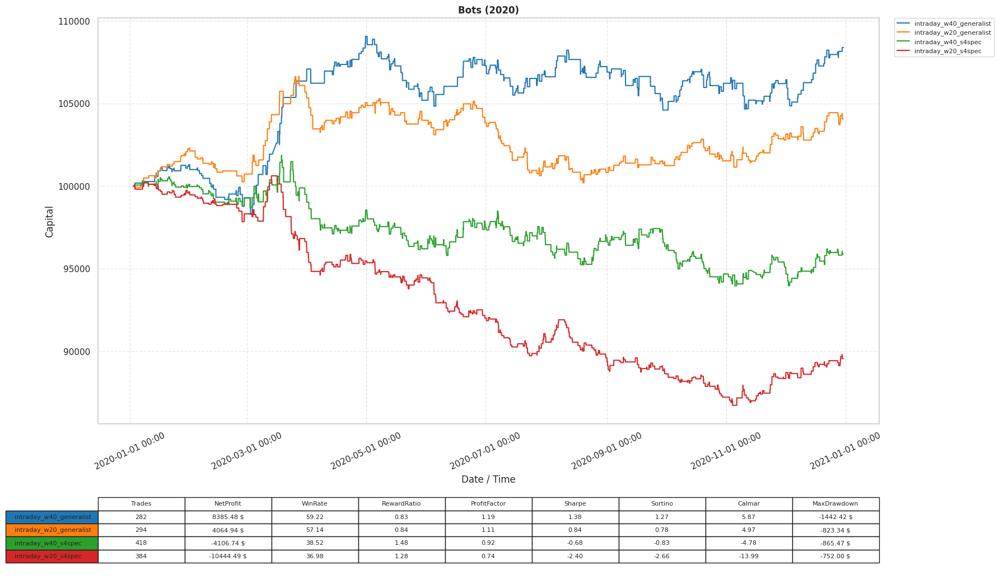

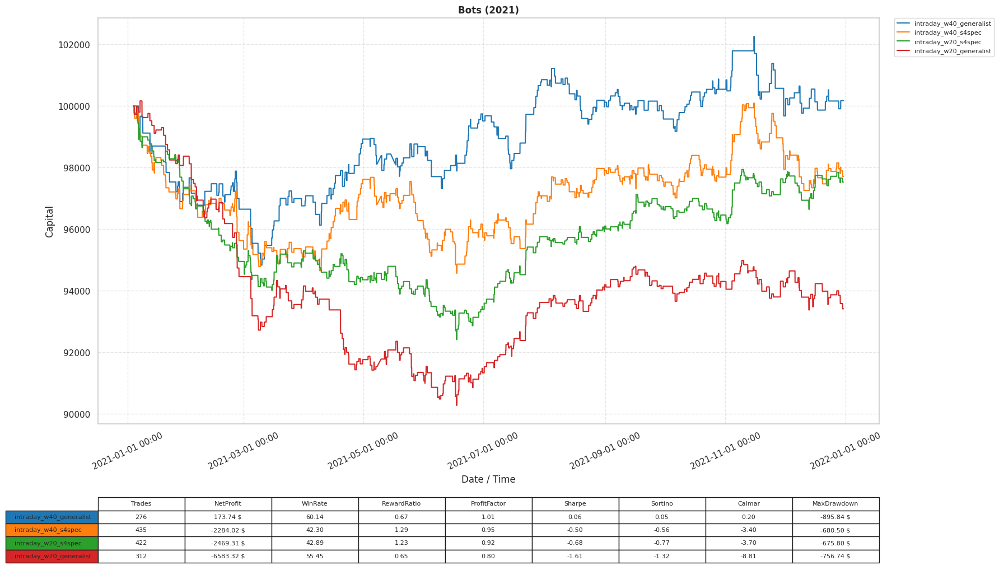

# Backtesting 2022-2023

## Loading Data

In [201]:
from enl.data_feed import *

start = '2020-01-01'
end = '2021-12-31'

df_30min = load_pair_time_bars('GBPUSD', 'EURUSD', start, end, '30min', ['close'])
from enl.backtest import *

all_dfs = [df_30min]
windows = [10, 20, 40]

df_unaligned_models = []

for window in windows:
    logger.info('Building models for window=%d', window)
    for df in all_dfs:
        model = bivariate_linear_model(df, window).dropna()
        filters = build_cascade_filters(model, window).dropna()
        df_unaligned_models.append(filters)

# Find the min date of all models and strip everybody
common_start_time = max(df["timestamp"].min() for df in df_unaligned_models)
logger.info('Found common start: %s', common_start_time)

df_models = [df[df["timestamp"] >= common_start_time] for df in df_unaligned_models]

[WARNING] File "/home/user/perso/trading/alphalab/data/GBPUSD/raw/GBPUSD_TICKS_2023_12_24.parquet" not found
[WARNING] File "/home/user/perso/trading/alphalab/data/GBPUSD/raw/GBPUSD_TICKS_2023_12_31.parquet" not found
[WARNING] 10058 bars have been dropped
[WARNING] File "/home/user/perso/trading/alphalab/data/EURUSD/raw/EURUSD_TICKS_2023_12_31.parquet" not found
[WARNING] 10054 bars have been dropped
[WARNING] Found 4 gaps in pair (DROP)
[WARNING] Dropped 4 unsync-able datetime
[INFO] Pair "GBPUSD (X) / EURUSD (Y)" loaded (24790 bars)
[INFO] Building models for window=10
[INFO] Building models for window=20
[INFO] Building models for window=40
[INFO] Found common start: 2022-01-03 17:30:00


In [202]:
df_30min
df_models

for model in df_models:
    tmp = model[(model['window'] == 10) & (model['time_frame'] == '30min')]
    if len(tmp) > 0:
        df_30min_w10 = tmp
        break
df_30min_w10

for model in df_models:
    tmp = model[(model['window'] == 20) & (model['time_frame'] == '30min')]
    if len(tmp) > 0:
        df_30min_w20 = tmp
        break
df_30min_w20

for model in df_models:
    tmp = model[(model['window'] == 40) & (model['time_frame'] == '30min')]
    if len(tmp) > 0:
        df_30min_w40 = tmp
        break
df_30min_w40

,timestamp,time_frame,half_year_index,x_close,y_close,window,ols_slope,ols_intercept,r2,beta_tstat,sigma_alpha,residual_sigma,z_fixed,z_dynamic,variance_minimal,variance_prediction,student_barrier,is_r2_valid,is_ttest_valid,is_anchor_valid,is_slope_valid,raw_residual
39,2022-01-03 17:30:00,30min,S1,1.347165,1.128390,40,1.022008,-0.245654,0.812193,12.819346,0.107634,0.001139,-2.431947,-2.354722,3.241769e-08,0.000001,2.024394,True,True,True,True,-0.002769
40,2022-01-03 18:00:00,30min,S1,1.347685,1.129090,40,1.047469,-0.280097,0.798428,12.268601,0.115256,0.001210,-2.042653,-1.992930,3.660365e-08,0.000002,2.024394,True,True,True,True,-0.002472
41,2022-01-03 18:30:00,30min,S1,1.347905,1.129490,40,1.065746,-0.304831,0.784999,11.778925,0.122131,0.001263,-1.743880,-1.706870,3.989288e-08,0.000002,2.024394,True,True,True,True,-0.002203
42,2022-01-03 19:00:00,30min,S1,1.348465,1.129815,40,1.070411,-0.311210,0.767394,11.196724,0.129034,0.001316,-1.813392,-1.783903,4.329960e-08,0.000002,2.024394,True,True,True,True,-0.002387
43,2022-01-03 19:30:00,30min,S1,1.348465,1.129740,40,1.070732,-0.311732,0.750464,10.690311,0.135178,0.001361,-1.743312,-1.715795,4.629591e-08,0.000002,2.024394,True,True,True,True,-0.002372
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24785,2023-12-29 19:30:00,30min,S4,1.274605,1.104080,40,0.287850,0.739588,0.164924,2.739498,0.133866,0.000989,-2.428209,-2.393862,2.446917e-08,0.000001,2.024394,True,True,True,True,-0.002402
24786,2023-12-29 20:00:00,30min,S4,1.275550,1.104760,40,0.258022,0.777516,0.131394,2.397556,0.137113,0.001026,-1.829209,-1.785636,2.631135e-08,0.000001,2.024394,False,True,True,True,-0.001877
24787,2023-12-29 20:30:00,30min,S4,1.274820,1.104110,40,0.240808,0.799354,0.109577,2.162483,0.141878,0.001065,-2.095990,-2.064283,2.834183e-08,0.000001,2.024394,False,True,True,True,-0.002232
24788,2023-12-29 21:00:00,30min,S4,1.273875,1.103645,40,0.241670,0.798150,0.104889,2.110172,0.145915,0.001095,-2.157800,-2.130884,2.997489e-08,0.000001,2.024394,False,True,True,True,-0.002363


## Backtesting

In [205]:
from enl.backtest import BacktestEngine

swing_config = {
    'use_r2': True,
    'use_ttest': False,
    'use_anchor': True,
    'use_slope_limit': False,
    'use_z_dynamic': False,
    'use_elastic_sizing': False,
}

swing_bot = [
    {
        'name': 'swing_s1_spec',
        'params': { **swing_config, 'stop_loss_sigma': 1.5 },
        'model': df_30min_w10,
    },
    {
        'name': 'swing_s1_spec_sniper',
        'params': { **swing_config, 'stop_loss_sigma': 1.5, 'use_z_dynamic': True },
        'model': df_30min_w10,
    },
    {
        'name': 'swing_generalist',
        'params': { **swing_config, 'stop_loss_sigma': 3.5 },
        'model': df_30min_w10,
    },
    {
        'name': 'swing_generalist_sniper',
        'params': { **swing_config, 'stop_loss_sigma': 3.5, 'use_z_dynamic': True  },
        'model': df_30min_w10,
    },
]

logger.setLevel(logging.WARNING)

results = []
year = '2023'

for bot in swing_bot:
    print(f'- Backtesting bot "{bot['name']}"')
    strategy = FixedParameterWithStopStrategy(**bot['params'])

    engine = BacktestEngine()
    model = bot['model']
    df_bot_model = model[
        (model['timestamp'] >= f'{year}-01-01') &
        (model['timestamp'] <= f'{year}-12-31')
    ]
    # df_equity = engine.run_simulation(bot['model'], strategy)
    df_equity = engine.run_simulation(df_bot_model, strategy)
    performance_report = engine.compute_performance_metrics()

    results.append({
        'name': bot['name'],
        'df_equity': df_equity,
        'metrics': performance_report,
    })

    # print(f"\n--- PERFORMANCE REPORT BASELINE ({bot['name']}) ---")
    # for metric, value in performance_report.items():
    #     if isinstance(value, float):
    #         print(f'{metric}: {value}')
    #     else:
    #         print(f'{metric}: {value}')

logger.setLevel(logging.INFO)

result_swing_2023 = results

print('Backtest complete')

# results


- Backtesting bot "swing_s1_spec"
- Backtesting bot "swing_s1_spec_sniper"
- Backtesting bot "swing_generalist"
- Backtesting bot "swing_generalist_sniper"
Backtest complete


In [207]:
from enl.backtest import BacktestEngine

intraday_config = {
    'use_r2': False,
    'use_ttest': False,
    'use_anchor': True,
    'use_slope_limit': True,
    'use_z_dynamic': True,
    'use_elastic_sizing': False,
}

intraday_bot = [
    {
        'name': 'intraday_w20_s4spec',
        'params': { **intraday_config, 'stop_loss_sigma': 1.5 },
        'model': df_30min_w20,
    },
    {
        'name': 'intraday_w40_s4spec',
        'params': { **intraday_config, 'stop_loss_sigma': 1.5 },
        'model': df_30min_w40,
    },
    {
        'name': 'intraday_w20_generalist',
        'params': { **intraday_config, 'stop_loss_sigma': 3.5 },
        'model': df_30min_w20,
    },
    {
        'name': 'intraday_w40_generalist',
        'params': { **intraday_config, 'stop_loss_sigma': 3.5 },
        'model': df_30min_w40,
    },
]

logger.setLevel(logging.WARNING)

results = []
year = '2023'

for bot in intraday_bot:
    print(f'- Backtesting bot "{bot['name']}"')
    strategy = FixedParameterWithStopStrategy(**bot['params'])

    engine = BacktestEngine()
    model = bot['model']
    df_bot_model = model[
        (model['timestamp'] >= f'{year}-01-01') &
        (model['timestamp'] <= f'{year}-12-31')
    ]
    # df_equity = engine.run_simulation(bot['model'], strategy)
    df_equity = engine.run_simulation(df_bot_model, strategy)
    performance_report = engine.compute_performance_metrics()

    results.append({
        'name': bot['name'],
        'df_equity': df_equity,
        'metrics': performance_report,
    })

    # print(f"\n--- PERFORMANCE REPORT BASELINE ({bot['name']}) ---")
    # for metric, value in performance_report.items():
    #     if isinstance(value, float):
    #         print(f'{metric}: {value}')
    #     else:
    #         print(f'{metric}: {value}')

logger.setLevel(logging.INFO)

result_intraday_2023 = results

print('Backtest complete')

# results

- Backtesting bot "intraday_w20_s4spec"
- Backtesting bot "intraday_w40_s4spec"
- Backtesting bot "intraday_w20_generalist"
- Backtesting bot "intraday_w40_generalist"
Backtest complete


## Results

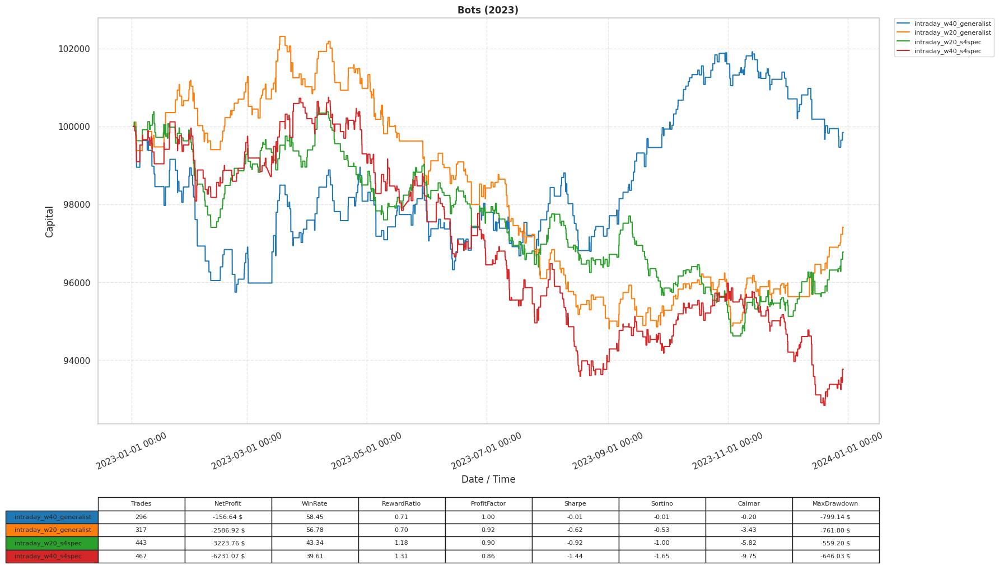

In [212]:
import matplotlib.dates as mdates
import matplotlib.gridspec as gridspec
import matplotlib.pyplot as plt
import pandas as pd

# top_10_configs = df_grid_report.sort_values(
#     by='cumulative_monetary_profit', ascending=False).head(10)


colors = plt.cm.tab10.colors

fig = plt.figure(figsize=(18, 13))
# Allocation: 3 rows for the chart, 1 row for the table framework
gs = gridspec.GridSpec(4, 1, figure=fig, hspace=0.6)

# The chart takes rows 0, 1, and 2
ax_chart = fig.add_subplot(gs[0:3, 0])
# FIX: Properly target row index 3 for the bottom table axis spec
ax_table = fig.add_subplot(gs[3, 0])
ax_table.axis('off')

year='2023'
results = result_intraday_2023

results_sorted = sorted(
    results,
    key=lambda x: x['metrics']['cumulative_monetary_profit_net'],
    reverse=True
)
results = results_sorted

# --- TOP PANEL: PLOT SYNCHRONIZED TIME SERIES FOR TOP 10 ---
for i, bot in enumerate(results):
    series = bot['df_equity']
    x_dates = pd.to_datetime(series.index)
    y_ticks = series.values
    ax_chart.plot(x_dates, y_ticks, label=bot['name'], color=colors[i], linewidth=1.5)

ax_chart.xaxis.set_major_locator(mdates.AutoDateLocator())
ax_chart.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))
ax_chart.set_title(f'Bots ({year})', fontsize=12, fontweight='bold')
ax_chart.set_xlabel('Date / Time')
ax_chart.set_ylabel('Capital')
ax_chart.grid(True, linestyle='--', alpha=0.5)

ax_chart.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0.0, fontsize='8')
ax_chart.tick_params(axis='x', rotation=25)

# --- BOTTOM PANEL: MATRIX TEXT TABLE GENERATION FOR TOP 10 ---
table_data = []
row_labels = []
row_colors = []
period_mult = 1.0

for i, bot in enumerate(results):
    row_labels.append(bot['name'])
    row_colors.append(colors[i])

    row = bot['metrics']

    table_data.append([
        # General Performances
        f"{int(row['total_trades'])}",
        f"{row['cumulative_monetary_profit_net']:.2f} $",
        f"{row['win_ratio_net']*1e2:.2f}",
        f"{row['reward_ratio_net']:.2f}",
        f"{row['profit_factor_net']:.2f}",
        # Stability (multiply by 2 since we test 2 years of data)
        f"{row['sharpe_ratio_net']*period_mult:.2f}",
        f"{row['sortino_ratio_net']*period_mult:.2f}",
        f"{row['calmar_ratio_net']*period_mult:.2f}",
        f"-{row['drawdown_max']:.2f} $",
    ])

column_headers = ['Trades', 'NetProfit', 'WinRate', 'RewardRatio', 'ProfitFactor', 'Sharpe', 'Sortino', 'Calmar', 'MaxDrawdown']

perf_table = ax_table.table(
    cellText=table_data,
    rowLabels=row_labels,
    rowColours=row_colors,  # Binds table row headers visually to the 10 chart curves
    colLabels=column_headers,
    loc='center',
    cellLoc='center'
)

perf_table.auto_set_font_size(False)
perf_table.set_fontsize(8)
perf_table.scale(1.0, 1.4)

plt.show()

#### Swings

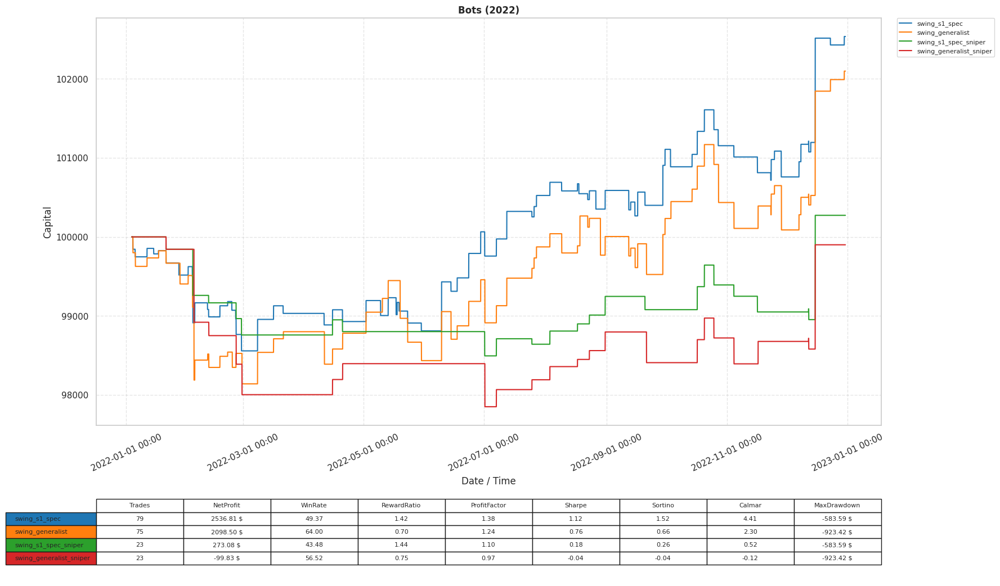

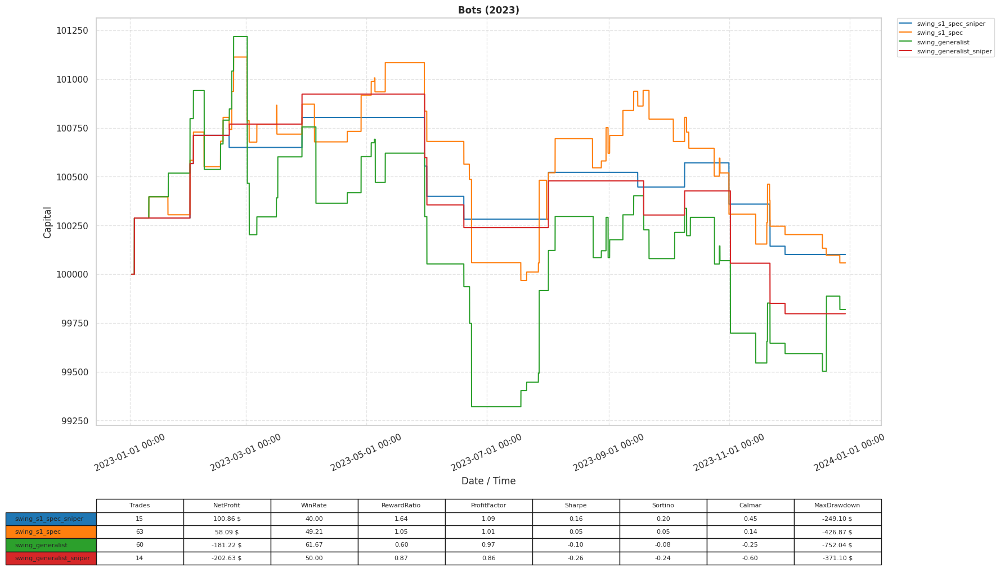

## Intraday

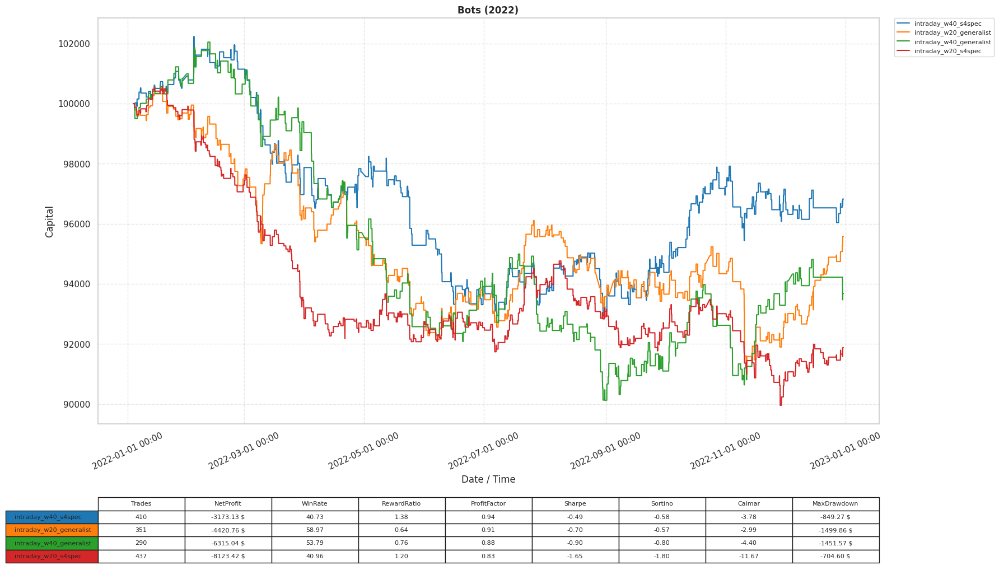

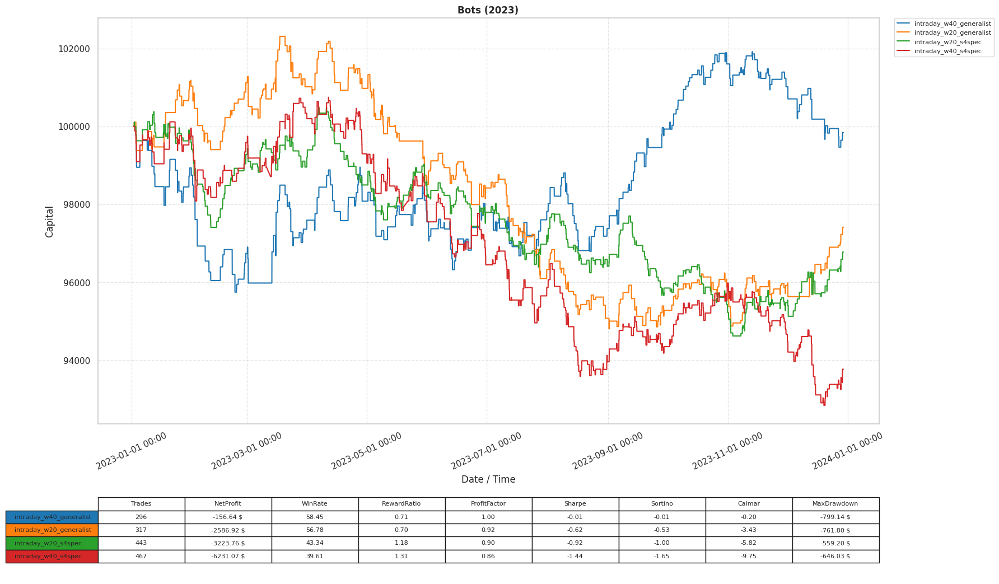

# Backtesting All Time (2020-2023)

In [13]:
from enl.data_feed import *

start = '2020-01-01'
end = '2021-12-31'

start = '2025-01-01'
end = '2026-07-31'

df_30min = load_pair_time_bars('GBPUSD', 'EURUSD', start, end, '30min', ['close'])
from enl.backtest import *

all_dfs = [df_30min]
windows = [10, 40]

df_unaligned_models = []

for window in windows:
    logger.info('Building models for window=%d', window)
    for df in all_dfs:
        model = bivariate_linear_model(df, window).dropna()
        filters = build_cascade_filters(model, window).dropna()
        df_unaligned_models.append(filters)

# Find the min date of all models and strip everybody
common_start_time = max(df["timestamp"].min() for df in df_unaligned_models)
logger.info('Found common start: %s', common_start_time)

df_models = [df[df["timestamp"] >= common_start_time] for df in df_unaligned_models]

df_30min
df_models

for model in df_models:
    tmp = model[(model['window'] == 10) & (model['time_frame'] == '30min')]
    if len(tmp) > 0:
        df_30min_w10 = tmp
        break
df_30min_w10

for model in df_models:
    tmp = model[(model['window'] == 40) & (model['time_frame'] == '30min')]
    if len(tmp) > 0:
        df_30min_w40 = tmp
        break
df_30min_w40

[WARNING] 8056 bars have been dropped
[WARNING] 8056 bars have been dropped
[INFO] Pair "GBPUSD (X) / EURUSD (Y)" loaded (19548 bars)
[INFO] Building models for window=10
[INFO] Building models for window=40
[INFO] Found common start: 2025-01-02 17:30:00


,timestamp,time_frame,half_year_index,x_close,y_close,window,price_mid,price_diff,price_diff_sq,price_diff_sq_diff,...,z_dynamic,variance_minimal,variance_prediction,student_barrier,is_r2_valid,is_ttest_valid,is_anchor_valid,is_slope_valid,raw_residual,is_efficiency_ratio_valid
39,2025-01-02 17:30:00,30min,S1,1.237205,1.026495,40,1.140605,0.213845,0.045730,0.045730,...,-1.268661,2.881633e-08,1.266440e-06,2.024394,True,True,True,True,-0.001428,True
40,2025-01-02 18:00:00,30min,S1,1.237430,1.026270,40,1.140311,0.213724,0.045678,-0.000052,...,-1.405412,3.062403e-08,1.331801e-06,2.024394,True,True,True,True,-0.001622,False
41,2025-01-02 18:30:00,30min,S1,1.236925,1.025640,40,1.140004,0.213610,0.045629,-0.000049,...,-1.501140,3.289960e-08,1.428896e-06,2.024394,True,True,True,True,-0.001794,False
42,2025-01-02 19:00:00,30min,S1,1.237670,1.025705,40,1.139713,0.213502,0.045583,-0.000046,...,-1.631117,3.536563e-08,1.515742e-06,2.024394,True,True,True,True,-0.002008,False
43,2025-01-02 19:30:00,30min,S1,1.236890,1.025110,40,1.139400,0.213374,0.045528,-0.000055,...,-1.559478,3.718917e-08,1.597933e-06,2.024394,True,True,True,True,-0.001971,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19543,2026-07-30 21:30:00,30min,S4,1.346350,1.152535,40,1.244408,0.191540,0.036688,0.000038,...,-0.385901,8.162248e-09,3.463361e-07,2.024394,True,True,True,True,-0.000227,True
19544,2026-07-30 22:00:00,30min,S4,1.346640,1.152720,40,1.244647,0.191646,0.036728,0.000040,...,-0.377308,8.188673e-09,3.473289e-07,2.024394,True,True,True,True,-0.000222,True
19545,2026-07-30 22:30:00,30min,S4,1.346740,1.152885,40,1.244890,0.191752,0.036769,0.000041,...,-0.200964,8.176811e-09,3.460541e-07,2.024394,True,True,True,True,-0.000118,True
19546,2026-07-30 23:00:00,30min,S4,1.346185,1.152420,40,1.245129,0.191859,0.036810,0.000041,...,-0.347157,8.178093e-09,3.433608e-07,2.024394,True,True,True,True,-0.000203,False


In [14]:
from enl.backtest import BacktestEngine

swing_config = {
    'use_r2': True,
    'use_ttest': False,
    'use_anchor': True,
    'use_slope_limit': False,
    'use_z_dynamic': False,
    'use_elastic_sizing': False,
    'use_efficiency_ratio': False,
}

intraday_config = {
    'use_r2': False,
    'use_ttest': False,
    'use_anchor': True,
    'use_slope_limit': True,
    'use_z_dynamic': True,
    'use_elastic_sizing': False,
    'use_efficiency_ratio': False,
}

bots = [
    {
        'name': 'swing_s1_spec',
        'params': { **swing_config, 'stop_loss_sigma': 1.5 },
        'model': df_30min_w10,
    },
    {
        'name': 'swing_s1_spec_sniper',
        'params': { **swing_config, 'stop_loss_sigma': 1.5, 'use_z_dynamic': True },
        'model': df_30min_w10,
    },
    {
        'name': 'swing_generalist',
        'params': { **swing_config, 'stop_loss_sigma': 3.5 },
        'model': df_30min_w10,
    },
    {
        'name': 'swing_generalist_sniper',
        'params': { **swing_config, 'stop_loss_sigma': 3.5, 'use_z_dynamic': True  },
        'model': df_30min_w10,
    },
    {
        'name': 'intraday_w40_s4spec',
        'params': { **intraday_config, 'stop_loss_sigma': 1.5 },
        'model': df_30min_w40,
    },
    {
        'name': 'intraday_w40_generalist',
        'params': { **intraday_config, 'stop_loss_sigma': 3.5 },
        'model': df_30min_w40,
    },
    # With Efficiency Ratio
    {
        'name': 'swing_s1_spec_er',
        'params': { **swing_config, 'stop_loss_sigma': 1.5, 'use_efficiency_ratio': True },
        'model': df_30min_w10,
    },
    {
        'name': 'swing_s1_spec_sniper_er',
        'params': { **swing_config, 'stop_loss_sigma': 1.5, 'use_z_dynamic': True, 'use_efficiency_ratio': True  },
        'model': df_30min_w10,
    },
    {
        'name': 'swing_generalist_er',
        'params': { **swing_config, 'stop_loss_sigma': 3.5, 'use_efficiency_ratio': True  },
        'model': df_30min_w10,
    },
    {
        'name': 'swing_generalist_sniper_er',
        'params': { **swing_config, 'stop_loss_sigma': 3.5, 'use_z_dynamic': True, 'use_efficiency_ratio': True   },
        'model': df_30min_w10,
    },
    {
        'name': 'intraday_w40_s4spec_er',
        'params': { **intraday_config, 'stop_loss_sigma': 1.5, 'use_efficiency_ratio': True  },
        'model': df_30min_w40,
    },
    {
        'name': 'intraday_w40_generalist_er',
        'params': { **intraday_config, 'stop_loss_sigma': 3.5, 'use_efficiency_ratio': True  },
        'model': df_30min_w40,
    },
]

logger.setLevel(logging.WARNING)

results = []
# year = '2023'

for bot in bots:
    print(f'- Backtesting bot "{bot['name']}"')
    strategy = FixedParameterWithStopStrategy(**bot['params'])

    engine = BacktestEngine()
    model = bot['model']
    # df_bot_model = model[
    #     (model['timestamp'] >= f'{year}-01-01') &
    #     (model['timestamp'] <= f'{year}-12-31')
    # ]
    df_bot_model = model
    # df_equity = engine.run_simulation(bot['model'], strategy)
    df_equity = engine.run_simulation(df_bot_model, strategy)
    performance_report = engine.compute_performance_metrics()

    df_cumreturn = df_equity.copy()
    df_cumreturn['return_pct'] = (df_cumreturn['capital'] - df_cumreturn['capital'].shift()) / df_cumreturn['capital'].shift()
    df_cumreturn['return_pct'] = df_cumreturn['return_pct'].fillna(0)
    df_cumreturn['cum_return'] = df_cumreturn['return_pct'].cumsum()
    df_cumreturn = df_cumreturn[['cum_return']]

    results.append({
        'name': bot['name'],
        'df_equity': df_equity,
        'df_cumreturn': df_cumreturn,
        'metrics': performance_report,
    })

    # print(f"\n--- PERFORMANCE REPORT BASELINE ({bot['name']}) ---")
    # for metric, value in performance_report.items():
    #     if isinstance(value, float):
    #         print(f'{metric}: {value}')
    #     else:
    #         print(f'{metric}: {value}')

logger.setLevel(logging.INFO)

print('Backtest complete')


- Backtesting bot "swing_s1_spec"
- Backtesting bot "swing_s1_spec_sniper"
- Backtesting bot "swing_generalist"
- Backtesting bot "swing_generalist_sniper"
- Backtesting bot "intraday_w40_s4spec"
- Backtesting bot "intraday_w40_generalist"
- Backtesting bot "swing_s1_spec_er"
- Backtesting bot "swing_s1_spec_sniper_er"
- Backtesting bot "swing_generalist_er"
- Backtesting bot "swing_generalist_sniper_er"
- Backtesting bot "intraday_w40_s4spec_er"
- Backtesting bot "intraday_w40_generalist_er"
Backtest complete


In [37]:
for r in results:
    print(f'bot "{r["name"]}", cumulative_monetary_profit_net: {r["metrics"]["cumulative_monetary_profit_net"]}')
    print(f'\tequity')

bot "swing_s1_spec", cumulative_monetary_profit_net: -866.3743330661226
bot "swing_s1_spec_sniper", cumulative_monetary_profit_net: 556.425774337238
bot "swing_generalist", cumulative_monetary_profit_net: -2193.2254969224405
bot "swing_generalist_sniper", cumulative_monetary_profit_net: 1051.1994593603408
bot "intraday_w40_s4spec", cumulative_monetary_profit_net: -6606.225317274238
bot "intraday_w40_generalist", cumulative_monetary_profit_net: 7991.693523667445
bot "swing_s1_spec_er", cumulative_monetary_profit_net: 1237.7584991513716
bot "swing_s1_spec_sniper_er", cumulative_monetary_profit_net: 1383.5938962762893
bot "swing_generalist_er", cumulative_monetary_profit_net: 1036.878685950626
bot "swing_generalist_sniper_er", cumulative_monetary_profit_net: 1833.172433692969
bot "intraday_w40_s4spec_er", cumulative_monetary_profit_net: -14913.779260805206
bot "intraday_w40_generalist_er", cumulative_monetary_profit_net: -5918.3794073639265


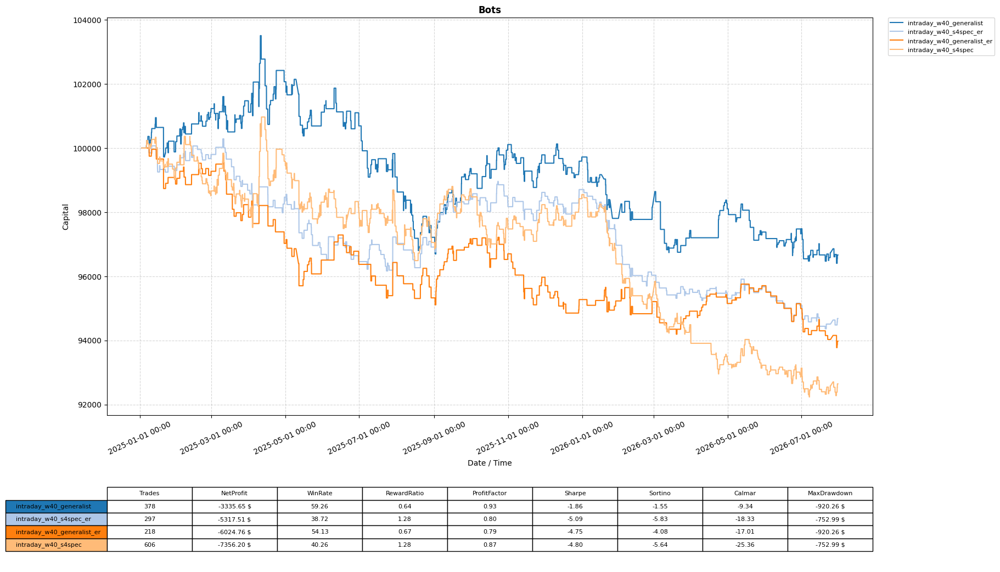

In [16]:
import matplotlib.dates as mdates
import matplotlib.gridspec as gridspec
import matplotlib.pyplot as plt
import pandas as pd

# top_10_configs = df_grid_report.sort_values(
#     by='cumulative_monetary_profit', ascending=False).head(10)


# --- CONFIGURATION DU FILTRE DE TYPE ---
FILTER_BY_TYPE = True        # Mettre à True pour activer le filtre, False pour tout voir
# FILTER_BY_TYPE = False        # Mettre à True pour activer le filtre, False pour tout voir
# BOT_TYPE_TO_KEEP = 'swing'   # Options : 'swing' ou 'intraday'
BOT_TYPE_TO_KEEP = 'intraday'   # Options : 'swing' ou 'intraday'

if FILTER_BY_TYPE:
    results_filtered = [
        bot for bot in results
        if BOT_TYPE_TO_KEEP.lower() in bot['name'].lower()
    ]
else:
    results_filtered = results

colors = plt.cm.tab20.colors

fig = plt.figure(figsize=(18, 13))
# Allocation: 3 rows for the chart, 1 row for the table framework
gs = gridspec.GridSpec(4, 1, figure=fig, hspace=0.6)

# The chart takes rows 0, 1, and 2
ax_chart = fig.add_subplot(gs[0:3, 0])
# FIX: Properly target row index 3 for the bottom table axis spec
ax_table = fig.add_subplot(gs[3, 0])
ax_table.axis('off')

# year='2023'
# results = result_intraday_2023

results_sorted = sorted(
    results_filtered,
    key=lambda x: x['metrics']['cumulative_monetary_profit_net'],
    reverse=True
)



# results = results_sorted

# --- TOP PANEL: PLOT SYNCHRONIZED TIME SERIES FOR TOP 10 ---
for i, bot in enumerate(results_sorted):
    series = bot['df_equity']
    # series = bot['df_cumreturn']
    x_dates = pd.to_datetime(series.index)
    # y_ticks = series.values
    y_ticks = series['capital'].values

    ax_chart.plot(x_dates, y_ticks, label=bot['name'], color=colors[i], linewidth=1.5)

ax_chart.xaxis.set_major_locator(mdates.AutoDateLocator())
ax_chart.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))
# ax_chart.set_title(f'Bots ({year})', fontsize=12, fontweight='bold')
ax_chart.set_title(f'Bots', fontsize=12, fontweight='bold')
ax_chart.set_xlabel('Date / Time')
ax_chart.set_ylabel('Capital')
ax_chart.grid(True, linestyle='--', alpha=0.5)

ax_chart.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0.0, fontsize='8')
ax_chart.tick_params(axis='x', rotation=25)

# --- BOTTOM PANEL: MATRIX TEXT TABLE GENERATION FOR TOP 10 ---
table_data = []
row_labels = []
row_colors = []
period_mult = 4.0

for i, bot in enumerate(results_sorted):
    row_labels.append(bot['name'])
    row_colors.append(colors[i])

    row = bot['metrics']

    table_data.append([
        # General Performances
        f"{int(row['total_trades'])}",
        f"{row['cumulative_monetary_profit_net']:.2f} $",
        f"{row['win_ratio_net']*1e2:.2f}",
        f"{row['reward_ratio_net']:.2f}",
        f"{row['profit_factor_net']:.2f}",
        # Stability (multiply by 2 since we test 2 years of data)
        f"{row['sharpe_ratio_net']*period_mult:.2f}",
        f"{row['sortino_ratio_net']*period_mult:.2f}",
        f"{row['calmar_ratio_net']*period_mult:.2f}",
        f"-{row['drawdown_max']:.2f} $",
    ])

column_headers = ['Trades', 'NetProfit', 'WinRate', 'RewardRatio', 'ProfitFactor', 'Sharpe', 'Sortino', 'Calmar', 'MaxDrawdown']

perf_table = ax_table.table(
    cellText=table_data,
    rowLabels=row_labels,
    rowColours=row_colors,  # Binds table row headers visually to the 10 chart curves
    colLabels=column_headers,
    loc='center',
    cellLoc='center'
)

perf_table.auto_set_font_size(False)
perf_table.set_fontsize(8)
perf_table.scale(1.0, 1.4)

plt.show()